Project: Advanced Lane Finding
In this project, the goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car.

In [1]:
# Project stpes include:
# 1. Camera calibration
# 2. Distortion correction
# 3. Color/gradient threshold
# 4. Perspective transform
# 5. Detect lane lines
# 6. Determine the lane curvature

Import Packages

In [2]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

Read in Images and use cv2.findChessboardCorners to find corners

This is image is:  <class 'numpy.ndarray'> with dimensions:  (720, 1280, 3)
True


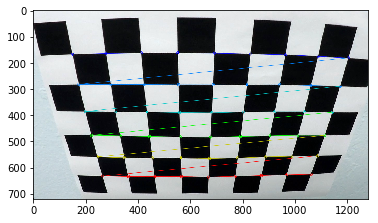

In [3]:
#image = mpimg.imread('test_images/test5.jpg')
fname = 'camera_cal/calibration2.jpg'
#fname = 'test_images/test1.jpg'
org_img = cv2.imread(fname)
print ('This is image is: ', type(org_img), 'with dimensions: ', org_img.shape)
plt.imshow(org_img)
img = np.copy(org_img)
gray = cv2.cvtColor(org_img, cv2.COLOR_BGR2GRAY)
#plt.imshow(gray)
nx = 9
ny = 6
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
print (ret)
if ret == True:
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)

Camera calibration and correct distortion

use cv2.calibrateCamera and cv2.undistort to perform camera calibration, image distortion correction and returns the undistorted images and calibration matrix


In [4]:
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (img.shape[1],img.shape[0]), None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return mtx, dist, undist

def plot3(img1, img1_name, img2=None, img2_name=None ,img3=None, img3_name=None):
    if (img2 is not None) and (img3 is not None):
        f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title(img1_name, fontsize=50)
        ax2.imshow(img2)
        ax2.set_title(img2_name, fontsize=50)
        ax3.imshow(img3)
        ax3.set_title(img3_name, fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    elif img2 is not None:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title(img1_name, fontsize=50)
        ax2.imshow(img2)
        ax2.set_title(img2_name, fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        
    else:
        f, (ax1) = plt.subplots(1,1, figsize=(5,4))
        f.tight_layout()
        ax1.imshow(img1)
        ax1.set_title((img1_name + " (can't calibrate)"), fontsize=20)

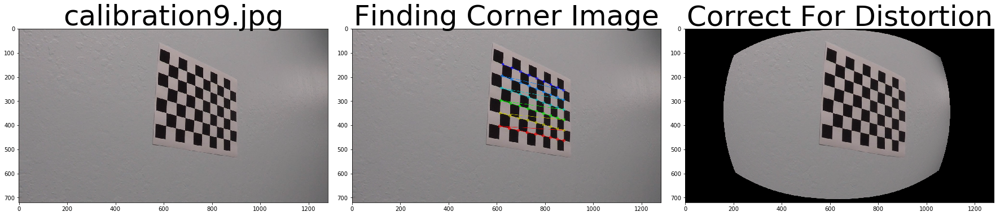

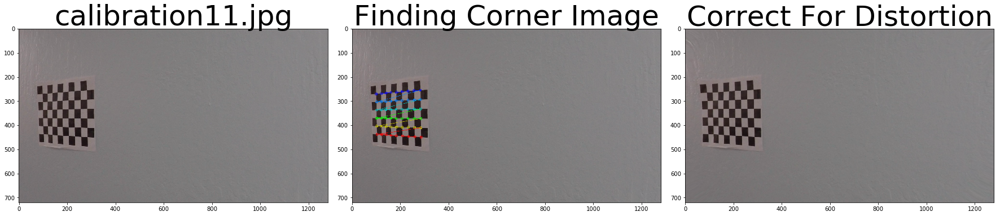

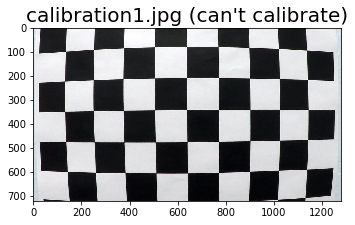

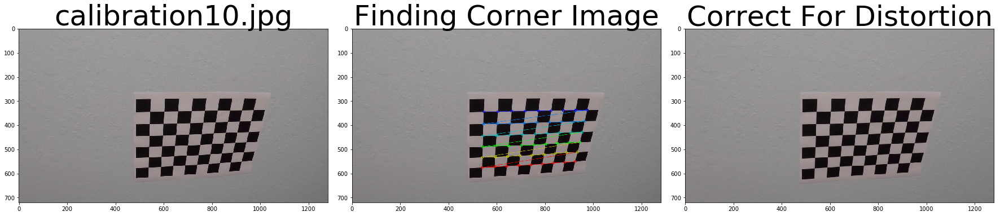

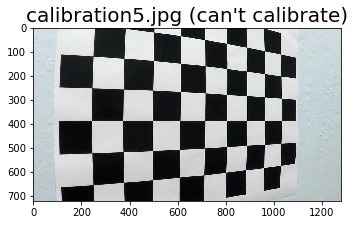

...

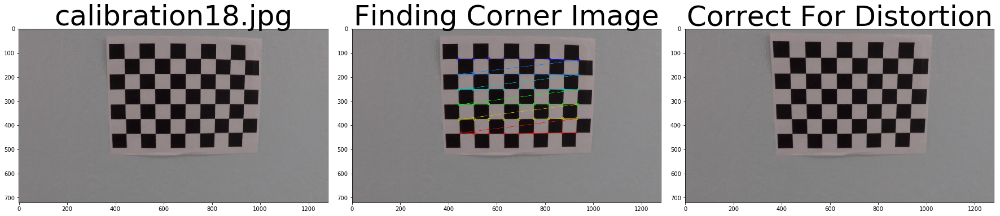

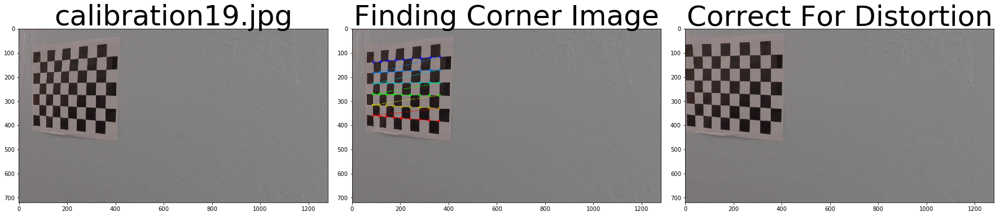

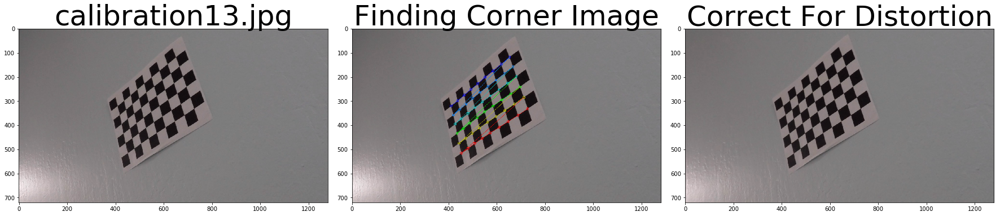

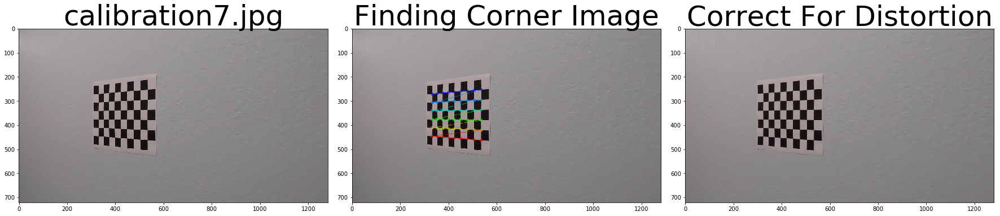

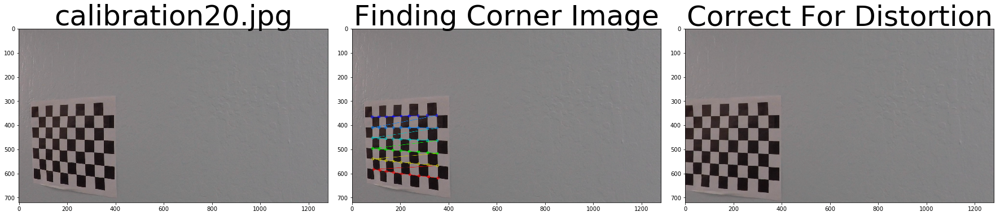

In [5]:
nx = 9
ny = 6

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
#images = ['camera_cal/calibration2.jpg']
#images = ['camera_cal/calibration1.jpg', 'camera_cal/calibration2.jpg']
#print (images.shape)

def camera_cal(images, nx, ny):
    #prepare object points, like (0,0,0), (1,0,0), (nx-1,ny-1,0)
    objp = np.zeros((ny*nx, 3),np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    #print (np.mgrid[0:nx, 0:ny].T)

    #Array to store object points and image points from all the images
    objpoints = [] #3D points in real world space
    imgpoints = [] #2D points in img plane
    #mtx = None
    #dist = None
    #undist = None

    #Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        image_name = fname.split('/')[1]
        #print (image_name)
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
        #find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        #print (ret)
    
        #If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            img_corner = np.copy(img)
            #Draw and display the corners
            cv2.drawChessboardCorners(img_corner, (nx, ny), corners, ret)
            
            #correct the distortion
            mtx, dist, undist = cal_undistort(img, objpoints, imgpoints)
            
            #plot org, finding corner and undist 
            plot3(img, image_name, img_corner, 'Finding Corner Image', undist, 'Correct For Distortion')
            
        else:
            plot3(img, image_name)
        
    return mtx, dist, undist
        
#cv2.destroyAllWindows()

mtx, dist, undist = camera_cal(images, nx, ny)

In [6]:
print (mtx)
print (dist)

[[  1.15777829e+03   0.00000000e+00   6.67113866e+02]
 [  0.00000000e+00   1.15282230e+03   3.86124658e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
[[-0.24688572 -0.02372824 -0.00109832  0.00035104 -0.00260433]]


use calibration matrix to undistort image get from camera

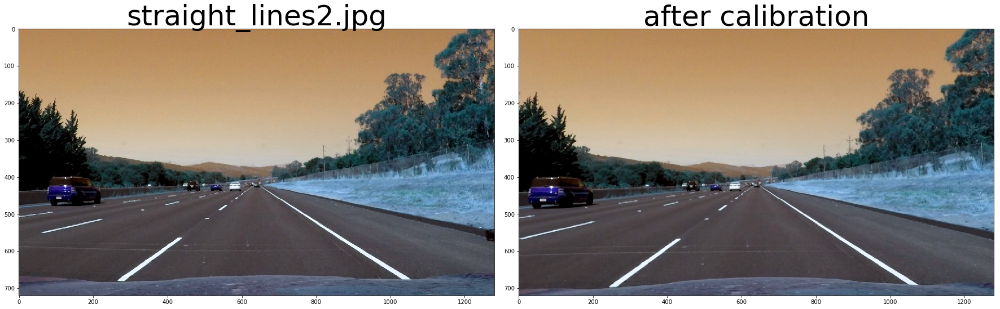

In [7]:
#test_undist_img_file = 'test_images/test4.jpg'
test_undist_img_file = 'test_images/straight_lines2.jpg'
#test_undist_img_file = 'test_images/ch_3.jpg'
test_undist_img = cv2.imread(test_undist_img_file)

result_undist = cv2.undistort(test_undist_img, mtx, dist, None, mtx)
plot3(test_undist_img, test_undist_img_file.split('/')[1], result_undist, 'after calibration')

Color/gradient threshold

Use color and gradient transform to create a binary threshold image

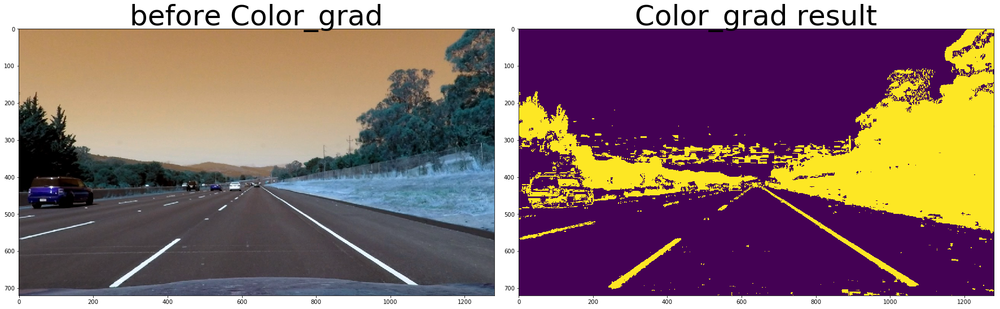

In [8]:
def color_grad(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    #Convert to HLS color space and seperate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    r = img[:,:,0]
    
    #plot3(h_channel, "h", r, "r", l_channel, "s")
    
    # Sobel x then take the absolute value
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # take the derivative in x
    #sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # take the derivative in y
    abs_sobelx = np.absolute(sobelx) # absolute x derivative to accentuate lines away
    
    #Scale to 8-bit (0-255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    #plot3(s_channel, "", scaled_sobel, "2")
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= s_thresh[1])] = 1
    
    #print (img.shape)
    vertices = np.array([[(400,500), (img.shape[1] - 400,500),
                   (img.shape[1], img.shape[0] * 0.95), (0, img.shape[0] * 0.95)]], np.int32)
    mask = np.zeros_like(scaled_sobel)
    #print (mask.shape, vertices.shape)
    cv2.fillPoly(mask, vertices, 255)
    masked = cv2.bitwise_and(sxbinary,mask)
    
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= 15) & (h_channel <= 100)] = 1
    
    r_binary = np.zeros_like(h_channel)
    r_binary[(r >= 200) & (r <= 255)] = 1
    
    #Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    #plot3(h_binary, "h_binary", sxbinary, "sxbinary", s_binary, "s_binary")
    
    #Stack each channel
    color_binary = np.dstack((np.zeros_like(sxbinary), masked, s_binary))
    
    #gray pic
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (h_binary == 1) | (sxbinary== 1)] = 1
    return combined_binary


result_colorgrad = color_grad(result_undist)
#print ("result_colorgrad", result_colorgrad.shape)

plot3(result_undist, 'before Color_grad', result_colorgrad, img2_name='Color_grad result')

Perspective transform

use cv2.warpPerspective to perform Birds-eye view - image for the lane lines return Birds-eye view image and inverse transform matrix

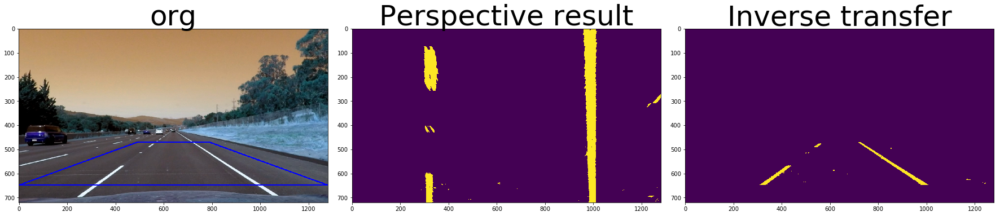

In [9]:
def perspective_transform(img):
    img_size = (img.shape[1], img.shape[0])
    #print ("alvin", img.shape[0], img.shape[1])
    #[0] height   [1] width
    offset = 100
    # Four source coordinate
    src = np.float32([[(490,470), (img.shape[1]-490,470),
                   (img.shape[1], img.shape[0]*0.9), (0, img.shape[0]*0.9)]])
        
    # Four desiredcoordinate
    dst = np.float32([[0, 0], [img.shape[1], 0],
                    [img.shape[1], img.shape[0]], [0, img.shape[0]]])
    
    # compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    # could compute the inverse also by swapping the input parameter
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv

def region(img):
    img = np.copy(img)
    img_size = (img.shape[1], img.shape[0])
    
    src = np.array([[(490,470), (img.shape[1]-490,470),
                   (img.shape[1], img.shape[0]*0.9), (0, img.shape[0]*0.9)]], np.int32).reshape((-1,1,2))
    #print ("2: ", src2.shape)
    #print (src2)
    
    cv2.polylines(img, [src], True, (0,0,255), 3)
    return img

mask_perspective = region(result_undist)
result_perspective, Minv = perspective_transform(result_colorgrad)
#result_perspective, Minv = perspective_transform(mask_perspective)

test_Minv = cv2.warpPerspective(result_perspective, Minv, (mask_perspective.shape[1], mask_perspective.shape[0]), flags=cv2.INTER_LINEAR)
plot3(mask_perspective, 'org', result_perspective, 'Perspective result', test_Minv, "Inverse transfer")

line detect

use sliding window to scan though bird-eye image to find the lanelines

In [10]:
def histogram(img):
    """
    input file should already been perspective transform
    """
    histogram = np.sum(img[int(img.shape[0]/2):, :], axis = 0)
    return histogram

def slidingWindow(binary_warped, plot=False):
    """
    Sliding the windows to find the lane lines
    """
    binary_warped = np.copy(binary_warped)
    # Assume you have created a warped binary image called binary_warped
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):, :], axis = 0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines, np.argmax retrun index
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #print (midpoint, leftx_base, rightx_base)
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero() # will seperate the row, col location into 2 []
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Create min number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    #print (nonzeroy)
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundary in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height # top y 
        win_y_high = binary_warped.shape[0] - (window) * window_height # bot y
        win_xleft_low = leftx_current - margin #left of left line
        win_xleft_high = leftx_current + margin #right of left line
        win_xright_low = rightx_current - margin #left of right line
        win_xright_high = rightx_current + margin #right of right line
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                        (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these ind to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
    # Concatenate the arrays of ind
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]        
    #print (lefty)
        
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #print (left_fit, right_fit)
        
        
    # Visualization
    if plot:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0]) # start, end, N
        left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]  # Ay^2 + By + C
        right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
            
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.title('lane detect from sliding window')
    return left_fit, right_fit

if already find the lane lines before, use the data as reference

In [11]:
def fit_frame(binary_warped, left_fit, right_fit, plot=False):
    # Assume you now have a new warped binary image
    # from the next frame of video(also called "binary warped")
    # It's now much more easier to find line pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy**2) + left_fit[1] * nonzeroy
                                  + left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy**2) 
                                  + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy**2) + right_fit[1] * nonzeroy
                                  + right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy**2) 
                                  + right_fit[1] * nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel position
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    #print (lefty)
    
    if (len(rightx) == 0  or len(leftx) / len(rightx) >= 10):
        return np.polyfit(lefty, leftx, 2), np.polyfit(lefty, leftx, 2)
    if (len(leftx)== 0 or len(rightx) / len(leftx) >= 10):
        return np.polyfit(righty, rightx, 2), np.polyfit(righty, rightx, 2)
        
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #print (left_fit, right_fit)
    
    if plot:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0]) # start, end, N
        left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]  # Ay^2 + By + C
        right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
        
        # Create an img to draw on and an img to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
        # Generate a polygon to illustrate the search window area
        # and recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))
        
        # Draw the lane onto the warped blank img
        cv2.fillPoly(window_img, np.int_(left_line_pts), (0,255,0))
        cv2.fillPoly(window_img, np.int_(right_line_pts), (0,255,0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    return left_fit, right_fit

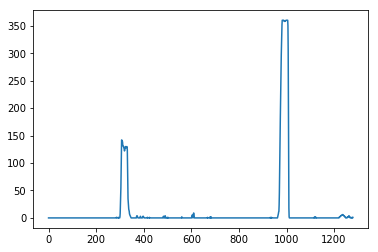

In [12]:
hist = histogram(result_perspective)
plt.plot(hist)
plt.show()

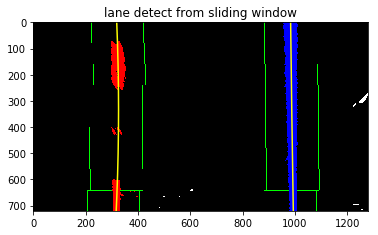

In [13]:
test_left_fit, test_right_fit = slidingWindow(result_perspective, plot=True)
#print (test_left_fit, test_right_fit)

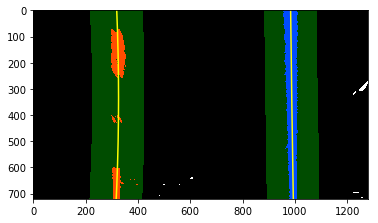

In [14]:
test_left_fit, test_right_fit = fit_frame(result_perspective, test_left_fit, test_right_fit, plot=True)

Calculate the line curvature

Create some fake data and use them to calculate the line curvature

1449.83234458 1515.22164451
475.394005985 m 497.642382087 m


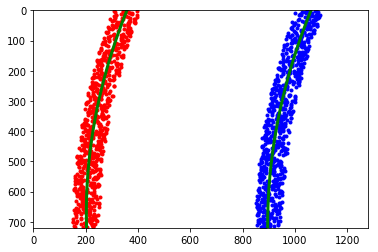

In [15]:
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720) # to cover same y-range as img
quadractic_coeff = 3e-4 # arbitrary quardratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2) * quadractic_coeff + np.random.randint(-50, high=51)
                 for y in ploty])
rightx = np.array([900 + (y**2) * quadractic_coeff + np.random.randint(-50, high=51)
                 for y in ploty])
leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1] # Reverse to match top-to-bottom in y

# Fit a second order polynomial to pixel position in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

# Define y-value where we want radius of curvature
# choose the max y-value, corresponding to the bottom of the img
y_eval = np.max(ploty)
left_curverad = ((1 + (2 * left_fit[0] * y_eval + left_fit[1])**2)**1.5) / np.absolute(2 * left_fit[0])
right_curverad = ((1 + (2 * right_fit[0] * y_eval + right_fit[1])**2)**1.5) / np.absolute(2 * right_fit[0])
print (left_curverad, right_curverad)

##
ym_per_pix = 30/720  # meterrs per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
#ploty = np.linspace(0, 719, num=720) # to cover same y-range as img
    
# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty * ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty * ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radius of curvature
left_curverad2 = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
right_curverad2 = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
print (left_curverad2, 'm', right_curverad2, 'm')

transform the pixel unit to real world meter unit

In [16]:
def curvature(left_fit, right_fit):
    # Define conversions to x,y in world space
    ym_per_pix = 30/720  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    #print (ym_per_pix, xm_per_pix)
    
    ploty = np.linspace(0, 719, num=720) # to cover same y-range as img
    y_eval = np.max(ploty)
    #print (y_eval)
    
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]    
    
    #print ('left', left_fitx[0])
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx*xm_per_pix, 2)
    #print ('left_cr', left_fit_cr)
    # Calculate the new radius of curvature
    left_curverad2 = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad2 = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
    return left_curverad2, right_curverad2

#print (left_curverad, right_curverad)
left, right = curvature(left_fit, right_fit)
print ('fake data',left, 'm', right, 'm')

print (left_fit, test_left_fit)
proj_left, proj_right = curvature(test_left_fit, test_right_fit)
print (proj_left, 'm', proj_right, 'm')

fake data 475.394005985 m 497.642382087 m
[  3.45463534e-04  -4.62836285e-01   3.57713794e+02] [ -6.09388778e-05   4.10717314e-02   3.18922829e+02]
2695.0827786 m 46577.4055342 m


Draw

visulaize the leftline and right line with cv2.polylines()

[ -6.09388778e-05   4.10717314e-02   3.18922829e+02] [  3.52591197e-06   1.16257327e-02   9.83764450e+02]


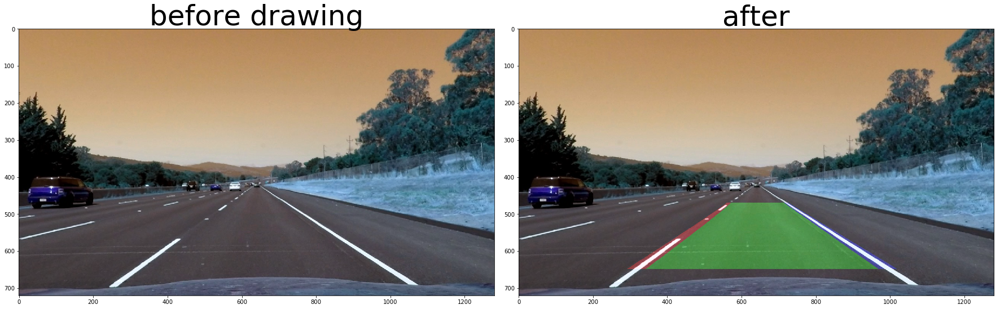

In [17]:
def draw_zone(img, binary_warped, left_fit, right_fit, Minv):
    #print (left_fit)
    # Generate x and  y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0]) # start, end, N
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]  # Ay^2 + By + C
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
        
    # Create an img to draw on and an img to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Calculate all the x and y point
    left_pt = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_pt = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    #print (right_pt)
    pt = np.hstack((left_pt, right_pt))

    # Draw left and right line and polyfill the zone
    cv2.fillPoly(window_img, np.int_(pt), (0,255,0))
    #plt.plot(left_fitx, ploty, color='red', linewidth=3)
    #plt.plot(right_fitx, ploty, color='blue', linewidth=3)
    cv2.polylines(window_img, np.int_(left_pt), False, (255,0,0), 50)
    cv2.polylines(window_img, np.int_(right_pt), False, (0,0,255), 50)
    tmp = cv2.addWeighted(window_img, 1, out_img, 0.3, 0)
    #plt.imshow(tmp)
    #plt.imshow(window_img)

    
    # use Minv to transfer curve line back to org location
    warped = cv2.warpPerspective(window_img, Minv, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)    
    # combine the result with org img
    result = cv2.addWeighted(img, 1, warped, 0.3, 0)
    #plt.imshow(warped)
    #plt.imshow(result)
    return result

#test_pipeline_image = 'test_images/straight_lines2.jpg'
#test_pipeline_image = 'test_images/test2.jpg'
#test_draw_img = cv2.imread('test_images/test4.jpg')
#plot3(test_img, "org")
print (test_left_fit, test_right_fit)
test_reverse = draw_zone(result_undist, result_perspective, test_left_fit, test_right_fit, Minv)
#plt.imshow(test_reverse)
plot3(result_undist, 'before drawing', test_reverse, 'after')

Tracking

keep track of things like where the last several detections of the lane lines were and what the curvature was

In [18]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False
        # n number of data saved
        self.n = 0
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # average x values of the fitted line over the last n iterations
        self.bestx = None
        # polynomial coefficients averaged over the last n iteration
        self.best_fit = None
        
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        # distance in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        # x values for detected line pixels
        self.allx = None
        # y values for detected line pixels
        self.ally = None
        
    #function
    def reset(self):
        self.detected = False
        self.n = 0
        self.bestx = None
        self.best_fit = None
        self.radius_of_curvature = None
        self.line_base_pos = None
            
    def set_x(self, linefit, x, y):
        xloc = linefit[0] * y ** 2 + linefit[1] * y + linefit[2] # Ay^2 + By + C
        self.recent_xfitted.append(xloc)
        while (len(self.recent_xfitted) > 15):
            self.recent_xfitted.pop(0)
            self.n = len(self.recent_xfitted)
        self.bestx = np.average(self.recent_xfitted)
        self.line_base_pos = np.absolute(np.int(x/2) - self.bestx)
            
    def set_best_fit(self):
        if self.best_fit == None:
            self.best_fit = self.current_fit
        else:
            self.best_fit = (self.best_fit * (len(self.recent_xfitted) - 1) + self.current_fit) / len(self.recent_xfitted)
        
    def pass_sanity(self, linefit):
        #if len(self.recent_xfitted) >= 5:
        margin = 100
        if self.bestx != None and np.absolute((linefit[0] * 719 ** 2 + linefit[1] * 719 + 
                                               linefit[2]) - self.bestx) > margin:
            return
        
        self.detected = True
        self.set_x(linefit, 1279, 719)
        self.current_fit = linefit
        #print ("self", self.current_fit)
        self.set_best_fit()
        
    def not_pass_sanity_check(self):
        print ("len", len(self.recent_xfitted))
        if len(self.recent_xfitted) >= 1:
            self.current_fit = self.best_fit
            self.recent_xfitted.pop(0)
        else:
            self.reset()

Sanity Check

Checking that whether left lines and right lines are good

In [19]:
def isSilmiarCurvature(left_fit, right_fit, thresh=(0.02, 50)):
    left_radius, right_radius = curvature(left_fit, right_fit)
    #print ("aaa", left, right)
    #print (np.absolute(left - right))
    #print (np.absolute(left - right) / left)
    ratio = left_radius / right_radius
    print ('ratio', ratio)
    return (ratio > thresh[0]) and (ratio < thresh[1])

    
def isRightDist(left_fit, right_fit, thresh=(450, 900)):
    left_fitx = left_fit[0] * 719**2 + left_fit[1] * 719 + left_fit[2] # Ay^2 + By + C
    right_fitx = right_fit[0] * 719**2 + right_fit[1] * 719 + right_fit[2]
    neardis = right_fitx - left_fitx
    print ('neardis', neardis)
    return neardis >= thresh[0] and neardis <= thresh[1]
    
    
def isParallel(left_fit, right_fit, thresh=(400, 900)):
    #fardis = np.absolute(right_fit[2] - left_fit[2])
    #dl = 2 * left_fit[0] * 400 + left_fit[1]
    #dr = 2 * right_fit[0] * 400 + right_fit[1]
    farl = left_fit[0] * 350**2 + left_fit[1] * 350 + left_fit[2] # Ay^2 + By + C
    farr = right_fit[0] * 350**2 + right_fit[1] * 350 + right_fit[2]
    diff = np.absolute(farl - farr)
    #diff = np.absolute(dl/dr)
    print ('diff', diff)
    return diff >= thresh[0] and diff <= thresh[1]

In [20]:
# Initial global parameter
leftline = Line()
rightline = Line()

Pipeline

In [21]:
#1. use distortion image matrix to undist input image, 
#2. then generate binary threshold image and transform the lane lines into bird-eye view
#3. find and calculate the left nd right line function # Ay^2 + By + C
#4. use lines info to calculate curvature and offset

ratio 0.0575910088512
neardis 677.067050501
diff 662.435876334


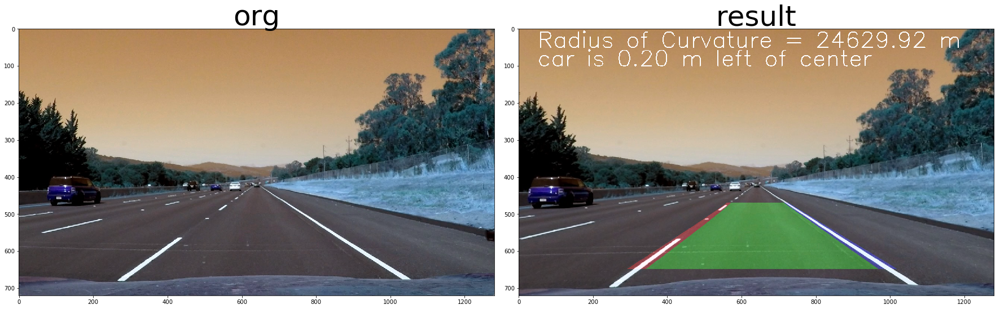

In [22]:
def pipeline(img):
    global leftline, rightline
    
    #print ("best", leftline.best_fit, rightline.best_fit)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    colorgrad = color_grad(undist)
    #plot3(undist, 'org', colorgrad, img2_name='Color_grad result')

    warped_binary, Minv = perspective_transform(colorgrad)

    if leftline.detected and rightline.detected:
        #print ("found")
        left_fit, right_fit = fit_frame(warped_binary, leftline.best_fit, rightline.best_fit, plot=False)

            
        if np.array_equal(left_fit, right_fit):
            left_fit[2] = leftline.bestx
            right_fit[2] = rightline.bestx
            print ("same", left_fit, right_fit)
            
    else:
        #print ("new")
        left_fit, right_fit = slidingWindow(warped_binary, plot=False)

    # sanity check
    if (isSilmiarCurvature(left_fit, right_fit) and isRightDist(left_fit, right_fit) and isParallel(left_fit, right_fit,)):
        #print ("pass sanity check")        
        leftline.pass_sanity(left_fit)
        rightline.pass_sanity(right_fit)
        leftline.radius_of_curvature, rightline.radius_of_curvature = curvature(left_fit, right_fit)
    else:
        #print ("no pass sanity check")
        leftline.not_pass_sanity_check()
        rightline.not_pass_sanity_check()
        
        
    #add some info to the output image
    result = draw_zone(undist, warped_binary, leftline.best_fit, rightline.best_fit, Minv)
    linecenter = (leftline.line_base_pos + rightline.line_base_pos)

    xm_per_pix = 3.7/700
    offset = np.absolute((linecenter - undist.shape[1]/2) * xm_per_pix)
    
    if offset >0:
        direction = "left"
    else:
        direction = "right"
        
    radius = (leftline.radius_of_curvature + rightline.radius_of_curvature)/2
    #print ("cur", radius2, radius)
    
    # Add radius and direction info to img
    cv2.putText(result, "car is %.2f m %s of center" %(offset, direction), (50,100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255,255), 2)
    cv2.putText(result, "Radius of Curvature = %.2f m" %(radius), (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255,255), 2)

    return result

img = cv2.imread('test_images/straight_lines2.jpg')
#img = cv2.imread('test_images/ch_3.jpg')
#img = cv2.imread('test_images/test4.jpg')

result = pipeline(img)
#print (leftline.best_fit)
plot3(img, 'org', result, 'result')
#plt.imshow(result)

In [23]:
# Initial global parameter
leftline = Line()
rightline = Line()

In [24]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
project_output = 'project_output.mp4'
clip2 = VideoFileClip('project_video.mp4')
project_clip = clip2.fl_image(pipeline)
print ("aa")
%time project_clip.write_videofile(project_output, audio=False)

ratio 0.689142617975
neardis 699.77752473
diff 666.935580234
aa
[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4


  0%|          | 1/1261 [00:00<07:19,  2.86it/s]

ratio 0.684806716705
neardis 699.731770276
diff 667.025353764


  0%|          | 2/1261 [00:00<07:24,  2.83it/s]

ratio 0.182880628194
neardis 702.294509362
diff 659.500411823


  0%|          | 3/1261 [00:01<07:18,  2.87it/s]

ratio 0.305911349449
neardis 698.006030109
diff 657.085858619


  0%|          | 4/1261 [00:01<07:15,  2.89it/s]

ratio 0.499886263425
neardis 691.890478902
diff 655.780493388


  0%|          | 5/1261 [00:01<07:27,  2.81it/s]

ratio 0.964041835268
neardis 689.709888406
diff 657.394350746


  0%|          | 6/1261 [00:02<07:11,  2.91it/s]

ratio 0.79026397105
neardis 688.095644081
diff 652.32025578


  1%|          | 7/1261 [00:02<07:09,  2.92it/s]

ratio 0.882733843463
neardis 686.966411597
diff 655.812931679


  1%|          | 8/1261 [00:02<06:59,  2.99it/s]

ratio 1.07054175813
neardis 682.102261382
diff 651.274716495


  1%|          | 9/1261 [00:03<07:07,  2.93it/s]

ratio 1.82278495966
neardis 676.047381131
diff 656.602908768


  1%|          | 10/1261 [00:03<07:25,  2.81it/s]

ratio 1.52850822949
neardis 680.569330353
diff 657.466964577


  1%|          | 11/1261 [00:03<07:21,  2.83it/s]

ratio 1.01358234034
neardis 686.313900846
diff 653.282033472


  1%|          | 12/1261 [00:04<07:05,  2.94it/s]

ratio 0.78342350825
neardis 692.648848769
diff 665.887161264


  1%|          | 13/1261 [00:04<07:17,  2.85it/s]

ratio 0.309951848773
neardis 699.475025958
diff 659.594029592


  1%|          | 14/1261 [00:04<07:00,  2.96it/s]

ratio 0.107907958859
neardis 701.680993696
diff 656.508700412


  1%|          | 15/1261 [00:05<07:06,  2.92it/s]

ratio 0.148007978733
neardis 694.441652338
diff 647.625252043


  1%|▏         | 16/1261 [00:05<07:20,  2.83it/s]

ratio 0.000276744225941
len 15
len 15


  1%|▏         | 17/1261 [00:05<07:07,  2.91it/s]

ratio 0.639671575472
neardis 677.787676065
diff 642.491719781


  1%|▏         | 18/1261 [00:06<07:09,  2.89it/s]

ratio 0.385059867463
neardis 675.659866293
diff 640.323613532


  2%|▏         | 19/1261 [00:06<07:01,  2.95it/s]

ratio 0.233435391934
neardis 676.100175125
diff 647.038065006


  2%|▏         | 20/1261 [00:06<07:01,  2.95it/s]

ratio 1.35133928136
neardis 669.710765648
diff 652.983121647


  2%|▏         | 21/1261 [00:07<06:45,  3.05it/s]

ratio 0.91898634137
neardis 676.275676702
diff 659.850667311


  2%|▏         | 22/1261 [00:07<06:44,  3.06it/s]

ratio 3.01314293591
neardis 672.245480905
diff 668.922259075


  2%|▏         | 23/1261 [00:07<06:35,  3.13it/s]

ratio 12.6861833681
neardis 670.81822707
diff 676.626130423


  2%|▏         | 24/1261 [00:08<06:24,  3.21it/s]

ratio 3.15556166525
neardis 679.798388066
diff 672.501485981


  2%|▏         | 25/1261 [00:08<06:17,  3.28it/s]

ratio 3.6273801146
neardis 677.260998472
diff 670.570264604


  2%|▏         | 26/1261 [00:08<06:10,  3.33it/s]

ratio 4.02818711342
neardis 687.233678535
diff 678.977421007


  2%|▏         | 27/1261 [00:08<06:07,  3.36it/s]

ratio 1.18110064022
neardis 698.487959962
diff 676.951268382


  2%|▏         | 28/1261 [00:09<06:18,  3.25it/s]

ratio 0.518489632856
neardis 706.064211473
diff 683.305940529


  2%|▏         | 29/1261 [00:09<06:18,  3.26it/s]

ratio 0.555859432852
neardis 701.474632989
diff 679.780915972


  2%|▏         | 30/1261 [00:09<06:32,  3.13it/s]

ratio 0.397112023195
neardis 701.361190579
diff 672.490992409


  2%|▏         | 31/1261 [00:10<06:28,  3.16it/s]

ratio 0.574814395213
neardis 698.832429183
diff 664.986848094


  3%|▎         | 32/1261 [00:10<06:30,  3.14it/s]

ratio 0.460145313742
neardis 694.825534396
diff 655.655700605


  3%|▎         | 33/1261 [00:10<06:31,  3.14it/s]

ratio 0.53597980695
neardis 698.655913974
diff 662.34448123


  3%|▎         | 34/1261 [00:11<06:46,  3.02it/s]

ratio 1.58330775416
neardis 684.197213447
diff 660.612440606


  3%|▎         | 35/1261 [00:11<06:34,  3.11it/s]

ratio 1.82019413081
neardis 686.933612106
diff 659.579180797


  3%|▎         | 36/1261 [00:11<06:24,  3.18it/s]

ratio 1.29635169255
neardis 688.001352139
diff 653.404550108


  3%|▎         | 37/1261 [00:12<06:21,  3.21it/s]

ratio 0.876366546995
neardis 695.226438574
diff 647.422778352


  3%|▎         | 38/1261 [00:12<06:21,  3.20it/s]

ratio 0.38080459982
neardis 699.108135367
diff 641.160550267


  3%|▎         | 39/1261 [00:12<07:08,  2.85it/s]

ratio 0.214228945326
neardis 696.406874227
diff 633.645357085


  3%|▎         | 40/1261 [00:13<07:11,  2.83it/s]

ratio 0.290426087471
neardis 692.713105383
diff 637.523420138


  3%|▎         | 41/1261 [00:13<06:50,  2.97it/s]

ratio 0.0695693422423
neardis 690.321442879
diff 635.113889986


  3%|▎         | 42/1261 [00:13<06:41,  3.04it/s]

ratio 0.742434514676
neardis 683.187607771
diff 642.487017873


  3%|▎         | 43/1261 [00:14<06:48,  2.98it/s]

ratio 0.809289464283
neardis 683.867559422
diff 646.86679797


  3%|▎         | 44/1261 [00:14<06:57,  2.91it/s]

ratio 0.537054725399
neardis 687.350058149
diff 651.126537945


  4%|▎         | 45/1261 [00:14<07:07,  2.85it/s]

ratio 0.636909189368
neardis 682.423537896
diff 655.157136358


  4%|▎         | 46/1261 [00:15<06:52,  2.94it/s]

ratio 0.755371425164
neardis 681.018625412
diff 656.857544281


  4%|▎         | 47/1261 [00:15<06:44,  3.00it/s]

ratio 1.12335748635
neardis 678.576432279
diff 660.754271466


  4%|▍         | 48/1261 [00:15<06:44,  3.00it/s]

ratio 1.37787655727
neardis 678.600824885
diff 658.705849823


  4%|▍         | 49/1261 [00:16<06:44,  2.99it/s]

ratio 1.20927143053
neardis 685.759750489
diff 665.549933417


  4%|▍         | 50/1261 [00:16<06:54,  2.92it/s]

ratio 1.0223907687
neardis 685.440077116
diff 664.124100419


  4%|▍         | 51/1261 [00:16<06:51,  2.94it/s]

ratio 0.772580208178
neardis 689.238749204
diff 662.841599852


  4%|▍         | 52/1261 [00:17<06:54,  2.92it/s]

ratio 0.109312420881
neardis 695.371406213
diff 652.365718695


  4%|▍         | 53/1261 [00:17<06:55,  2.91it/s]

ratio 0.431432770358
neardis 687.496417434
diff 653.55806377


  4%|▍         | 54/1261 [00:18<06:59,  2.88it/s]

ratio 0.547087786938
neardis 681.557921516
diff 652.719971678


  4%|▍         | 55/1261 [00:18<06:47,  2.96it/s]

ratio 0.77137814317
neardis 682.054120106
diff 656.026985275


  4%|▍         | 56/1261 [00:18<06:51,  2.93it/s]

ratio 0.860212077409
neardis 683.401384825
diff 660.194687067


  5%|▍         | 57/1261 [00:19<06:42,  2.99it/s]

ratio 0.960032366164
neardis 682.305687971
diff 660.495186527


  5%|▍         | 58/1261 [00:19<06:36,  3.03it/s]

ratio 1.57371435744
neardis 679.06872466
diff 662.95488767


  5%|▍         | 59/1261 [00:19<06:32,  3.06it/s]

ratio 8.03980864193
neardis 663.917999303
diff 656.311046766


  5%|▍         | 60/1261 [00:20<06:39,  3.01it/s]

ratio 5.67666322828
neardis 671.014957716
diff 647.111233601


  5%|▍         | 61/1261 [00:20<06:37,  3.02it/s]

ratio 2.67073751991
neardis 672.865918836
diff 642.588767461


  5%|▍         | 62/1261 [00:20<06:39,  3.00it/s]

ratio 1.62874211507
neardis 679.366893317
diff 635.729824074


  5%|▍         | 63/1261 [00:21<06:38,  3.01it/s]

ratio 0.545245831125
neardis 687.494180531
diff 635.849441961


  5%|▌         | 64/1261 [00:21<06:37,  3.01it/s]

ratio 0.408000043204
neardis 686.965245571
diff 631.873514931


  5%|▌         | 65/1261 [00:21<06:41,  2.98it/s]

ratio 0.200855272677
neardis 689.174951513
diff 634.334626573


  5%|▌         | 66/1261 [00:22<07:00,  2.84it/s]

ratio 0.73224647451
neardis 683.796012879
diff 634.098935171


  5%|▌         | 67/1261 [00:22<06:57,  2.86it/s]

ratio 0.779079583366
neardis 681.037721081
diff 634.885591544


  5%|▌         | 68/1261 [00:22<06:44,  2.95it/s]

ratio 0.298665149034
neardis 683.371382874
diff 637.484873721


  5%|▌         | 69/1261 [00:23<06:56,  2.86it/s]

ratio 0.239426061544
neardis 682.937170419
diff 631.556954459


  6%|▌         | 70/1261 [00:23<06:46,  2.93it/s]

ratio 0.130098241631
neardis 694.018999388
diff 638.263594837


  6%|▌         | 71/1261 [00:23<06:44,  2.94it/s]

ratio 1.22458802156
neardis 667.887013777
diff 638.392877828


  6%|▌         | 72/1261 [00:24<06:43,  2.94it/s]

ratio 1.45990641684
neardis 668.184370023
diff 642.411746102


  6%|▌         | 73/1261 [00:24<06:36,  3.00it/s]

ratio 1.08937757084
neardis 674.879808998
diff 644.384645592


  6%|▌         | 74/1261 [00:24<06:28,  3.05it/s]

ratio 1.31000835031
neardis 673.328342551
diff 645.678449502


  6%|▌         | 75/1261 [00:25<06:28,  3.06it/s]

ratio 1.71719561587
neardis 668.399510473
diff 652.0056005


  6%|▌         | 76/1261 [00:25<06:25,  3.08it/s]

ratio 1.06529804437
neardis 675.546397015
diff 649.713539525


  6%|▌         | 77/1261 [00:25<06:26,  3.06it/s]

ratio 1.11643383584
neardis 680.708738169
diff 661.933514184


  6%|▌         | 78/1261 [00:26<06:36,  2.98it/s]

ratio 0.270538519711
neardis 686.519452816
diff 661.537746775


  6%|▋         | 79/1261 [00:26<06:51,  2.87it/s]

ratio 0.875426025098
neardis 687.184267104
diff 668.9328022


  6%|▋         | 80/1261 [00:26<07:45,  2.54it/s]

ratio 0.714353280151
neardis 685.273681162
diff 669.960492367


  6%|▋         | 81/1261 [00:27<07:47,  2.52it/s]

ratio 4.07530265576
neardis 682.537833821
diff 670.748248425


  7%|▋         | 82/1261 [00:27<07:37,  2.58it/s]

ratio 2.77536771621
neardis 685.252428096
diff 672.624944222


  7%|▋         | 83/1261 [00:28<07:36,  2.58it/s]

ratio 1.26033691691
neardis 695.751146119
diff 673.344818387


  7%|▋         | 84/1261 [00:28<07:22,  2.66it/s]

ratio 2.16590660324
neardis 696.989772066
diff 685.908818069


  7%|▋         | 85/1261 [00:28<07:17,  2.69it/s]

ratio 4.21287575829
neardis 694.847346641
diff 686.432389816


  7%|▋         | 86/1261 [00:29<07:23,  2.65it/s]

ratio 4.85079223297
neardis 689.954758987
diff 685.562618784


  7%|▋         | 87/1261 [00:29<07:17,  2.68it/s]

ratio 3.89163750296
neardis 688.379819284
diff 671.671908096


  7%|▋         | 88/1261 [00:29<07:00,  2.79it/s]

ratio 2.02238642515
neardis 695.500272165
diff 659.668437075


  7%|▋         | 89/1261 [00:30<06:48,  2.87it/s]

ratio 0.18432224396
neardis 703.644752339
diff 647.838725662


  7%|▋         | 90/1261 [00:30<06:33,  2.97it/s]

ratio 0.114545587999
neardis 697.561246508
diff 636.448467989


  7%|▋         | 91/1261 [00:30<06:33,  2.97it/s]

ratio 0.0936365235391
neardis 697.419749242
diff 640.715240086


  7%|▋         | 92/1261 [00:31<06:38,  2.93it/s]

ratio 0.668297633784
neardis 692.227660902
diff 644.325280153


  7%|▋         | 93/1261 [00:31<06:49,  2.85it/s]

ratio 0.569616440954
neardis 688.839635834
diff 638.761135347


  7%|▋         | 94/1261 [00:31<06:42,  2.90it/s]

ratio 0.532706706923
neardis 686.136081311
diff 637.238646472


  8%|▊         | 95/1261 [00:32<06:46,  2.87it/s]

ratio 0.508564090916
neardis 683.70167726
diff 640.294961919


  8%|▊         | 96/1261 [00:32<06:31,  2.98it/s]

ratio 1.07042369587
neardis 673.825566499
diff 642.286857772


  8%|▊         | 97/1261 [00:32<06:30,  2.98it/s]

ratio 1.66210709574
neardis 668.815821388
diff 641.785536662


  8%|▊         | 98/1261 [00:33<06:27,  3.00it/s]

ratio 1.68321855701
neardis 672.097629346
diff 647.593942182


  8%|▊         | 99/1261 [00:33<06:29,  2.99it/s]

ratio 1.19533991167
neardis 675.302300822
diff 641.917079744


  8%|▊         | 100/1261 [00:33<06:42,  2.89it/s]

ratio 1.49664167876
neardis 672.762484706
diff 646.607903913


  8%|▊         | 101/1261 [00:34<06:36,  2.92it/s]

ratio 0.862103771837
neardis 680.462136371
diff 642.508254389


  8%|▊         | 102/1261 [00:34<06:37,  2.91it/s]

ratio 0.687882689781
neardis 678.16619711
diff 639.08648932


  8%|▊         | 103/1261 [00:34<06:39,  2.90it/s]

ratio 0.638556706263
neardis 680.383061703
diff 639.064016873


  8%|▊         | 104/1261 [00:35<06:53,  2.79it/s]

ratio 0.800933917947
neardis 676.789228988
diff 642.342532317


  8%|▊         | 105/1261 [00:35<06:39,  2.90it/s]

ratio 0.152432314307
neardis 680.027292983
diff 648.960955411


  8%|▊         | 106/1261 [00:36<06:31,  2.95it/s]

ratio 1.60895426618
neardis 680.200558104
diff 658.423895841


  8%|▊         | 107/1261 [00:36<06:27,  2.98it/s]

ratio 1.25826622496
neardis 684.395931533
diff 663.199688755


  9%|▊         | 108/1261 [00:36<06:19,  3.04it/s]

ratio 0.405033850336
neardis 691.14869068
diff 656.21709788


  9%|▊         | 109/1261 [00:36<06:21,  3.02it/s]

ratio 2.45977322553
neardis 674.052439768
diff 657.34871694


  9%|▊         | 110/1261 [00:37<06:26,  2.98it/s]

ratio 2.85847114477
neardis 673.834394766
diff 658.175581338


  9%|▉         | 111/1261 [00:37<06:24,  2.99it/s]

ratio 1.61500520583
neardis 681.18540571
diff 655.42115371


  9%|▉         | 112/1261 [00:38<06:31,  2.93it/s]

ratio 1.27555314676
neardis 686.92385982
diff 664.976126878


  9%|▉         | 113/1261 [00:38<06:28,  2.95it/s]

ratio 1.1666375147
neardis 686.095313547
diff 657.897842857


  9%|▉         | 114/1261 [00:38<06:31,  2.93it/s]

ratio 0.53731164071
neardis 691.768192637
diff 653.818269012


  9%|▉         | 115/1261 [00:39<06:35,  2.90it/s]

ratio 0.214627442618
neardis 693.891785199
diff 645.699327229


  9%|▉         | 116/1261 [00:39<06:26,  2.96it/s]

ratio 0.381904351475
neardis 686.662887049
diff 643.806225191


  9%|▉         | 117/1261 [00:39<06:27,  2.95it/s]

ratio 0.400633495777
neardis 683.287911116
diff 645.518716831


  9%|▉         | 118/1261 [00:40<06:16,  3.04it/s]

ratio 1.35486713223
neardis 679.0631426
diff 649.969182984


  9%|▉         | 119/1261 [00:40<06:36,  2.88it/s]

ratio 1.15407339983
neardis 679.291505475
diff 649.207146446


 10%|▉         | 120/1261 [00:40<06:24,  2.96it/s]

ratio 0.787459323142
neardis 679.564007123
diff 642.106048744


 10%|▉         | 121/1261 [00:41<06:23,  2.97it/s]

ratio 0.874534554242
neardis 681.471726112
diff 646.462083028


 10%|▉         | 122/1261 [00:41<06:19,  3.00it/s]

ratio 1.90530898804
neardis 667.255607022
diff 645.83011026


 10%|▉         | 123/1261 [00:41<06:19,  3.00it/s]

ratio 1.51945342573
neardis 671.832731576
diff 639.5556783


 10%|▉         | 124/1261 [00:42<06:23,  2.96it/s]

ratio 1.21026230148
neardis 676.915023186
diff 637.334275239


 10%|▉         | 125/1261 [00:42<06:17,  3.01it/s]

ratio 1.14932879439
neardis 674.506121822
diff 634.777380355


 10%|▉         | 126/1261 [00:42<06:13,  3.04it/s]

ratio 0.760069591763
neardis 685.834741676
diff 641.877810285


 10%|█         | 127/1261 [00:43<06:25,  2.95it/s]

ratio 0.579579417444
neardis 686.93567499
diff 638.611986453


 10%|█         | 128/1261 [00:43<06:21,  2.97it/s]

ratio 0.509865248536
neardis 686.470642635
diff 641.70425682


 10%|█         | 129/1261 [00:43<06:13,  3.03it/s]

ratio 0.826808462801
neardis 678.215880643
diff 634.622854305


 10%|█         | 130/1261 [00:44<06:20,  2.97it/s]

ratio 1.15985785741
neardis 674.795157713
diff 638.445153635


 10%|█         | 131/1261 [00:44<06:12,  3.03it/s]

ratio 0.906570615057
neardis 674.786429617
diff 636.278068334


 10%|█         | 132/1261 [00:44<06:04,  3.10it/s]

ratio 0.914534127703
neardis 672.155300519
diff 633.018563476


 11%|█         | 133/1261 [00:44<05:58,  3.15it/s]

ratio 1.03939984134
neardis 669.032566654
diff 636.309593172


 11%|█         | 134/1261 [00:45<06:09,  3.05it/s]

ratio 2.70276225398
neardis 648.453240335
diff 636.282125371


 11%|█         | 135/1261 [00:45<06:14,  3.01it/s]

ratio 2.12910185987
neardis 653.533228274
diff 639.536967122


 11%|█         | 136/1261 [00:46<06:30,  2.88it/s]

ratio 1.69318552334
neardis 665.498517363
diff 642.574620056


 11%|█         | 137/1261 [00:46<06:19,  2.96it/s]

ratio 1.40217959395
neardis 674.753993206
diff 645.460349193


 11%|█         | 138/1261 [00:46<06:17,  2.97it/s]

ratio 1.35553469103
neardis 679.957950552
diff 651.665553279


 11%|█         | 139/1261 [00:47<06:22,  2.93it/s]

ratio 1.17496935221
neardis 682.821335659
diff 653.473952977


 11%|█         | 140/1261 [00:47<06:16,  2.98it/s]

ratio 0.711835902579
neardis 690.074856938
diff 659.065232767


 11%|█         | 141/1261 [00:47<06:11,  3.02it/s]

ratio 0.408340250657
neardis 691.40776408
diff 655.874795671


 11%|█▏        | 142/1261 [00:48<06:09,  3.03it/s]

ratio 0.611396541096
neardis 686.893935583
diff 656.963586121


 11%|█▏        | 143/1261 [00:48<06:12,  3.00it/s]

ratio 1.01160759084
neardis 684.414841927
diff 651.5250278


 11%|█▏        | 144/1261 [00:48<06:10,  3.01it/s]

ratio 0.487465870916
neardis 686.470833704
diff 647.566447876


 11%|█▏        | 145/1261 [00:49<06:04,  3.06it/s]

ratio 0.51253790677
neardis 684.98690512
diff 649.703632969


 12%|█▏        | 146/1261 [00:49<06:10,  3.01it/s]

ratio 0.0294349791456
neardis 692.781981517
diff 646.414892339


 12%|█▏        | 147/1261 [00:49<06:15,  2.96it/s]

ratio 1.50441619649
neardis 677.972446703
diff 650.771451054


 12%|█▏        | 148/1261 [00:50<06:11,  2.99it/s]

ratio 1.15170329619
neardis 678.466885241
diff 638.592604813


 12%|█▏        | 149/1261 [00:50<06:22,  2.91it/s]

ratio 1.04446966146
neardis 678.736639557
diff 638.578522411


 12%|█▏        | 150/1261 [00:50<06:11,  2.99it/s]

ratio 1.11510525313
neardis 680.247160129
diff 643.005803474


 12%|█▏        | 151/1261 [00:51<06:01,  3.07it/s]

ratio 0.187220016228
neardis 688.752404063
diff 644.87700496


 12%|█▏        | 152/1261 [00:51<05:57,  3.11it/s]

ratio 0.237455557716
neardis 688.177802584
diff 648.236111717


 12%|█▏        | 153/1261 [00:51<06:01,  3.06it/s]

ratio 0.289436890343
neardis 683.945339672
diff 642.951419126


 12%|█▏        | 154/1261 [00:52<06:00,  3.07it/s]

ratio 0.31978778293
neardis 683.06373767
diff 651.413819293


 12%|█▏        | 155/1261 [00:52<06:00,  3.07it/s]

ratio 148.082231124
len 15
len 15


 12%|█▏        | 156/1261 [00:52<06:16,  2.93it/s]

ratio 18.5686133753
neardis 681.407209384
diff 660.304774108


 12%|█▏        | 157/1261 [00:53<06:11,  2.98it/s]

ratio 1.51561978618
neardis 685.197590039
diff 658.691617282


 13%|█▎        | 158/1261 [00:53<06:07,  3.00it/s]

ratio 1.68435967534
neardis 678.122971649
diff 650.403262207


 13%|█▎        | 159/1261 [00:53<06:18,  2.91it/s]

ratio 2.7266061779
neardis 673.406108776
diff 655.89913022


 13%|█▎        | 160/1261 [00:54<06:26,  2.85it/s]

ratio 1.9421835838
neardis 679.556194506
diff 651.312754533


 13%|█▎        | 161/1261 [00:54<06:39,  2.75it/s]

ratio 1.20196990934
neardis 695.019318915
diff 655.456135493


 13%|█▎        | 162/1261 [00:54<06:29,  2.82it/s]

ratio 0.797758255445
neardis 698.641510201
diff 655.743623882


 13%|█▎        | 163/1261 [00:55<06:32,  2.80it/s]

ratio 1.48858295523
neardis 741.975432178
diff 648.830526986


 13%|█▎        | 164/1261 [00:55<06:28,  2.83it/s]

ratio 0.889856949269
neardis 717.454558522
diff 647.749598455


 13%|█▎        | 165/1261 [00:55<06:10,  2.95it/s]

ratio 0.668142782733
neardis 704.481472237
diff 640.840794183


 13%|█▎        | 166/1261 [00:56<06:08,  2.97it/s]

ratio 0.491261899848
neardis 697.623649379
diff 644.443609767


 13%|█▎        | 167/1261 [00:56<06:06,  2.98it/s]

ratio 0.578316078431
neardis 688.409888238
diff 643.826743053


 13%|█▎        | 168/1261 [00:56<06:06,  2.98it/s]

ratio 0.468859852142
neardis 691.324728123
diff 653.315364926


 13%|█▎        | 169/1261 [00:57<06:06,  2.98it/s]

ratio 0.167149629114
neardis 692.564704257
diff 657.17121669


 13%|█▎        | 170/1261 [00:57<06:08,  2.96it/s]

ratio 0.356234134346
neardis 692.206680055
diff 665.520298788


 14%|█▎        | 171/1261 [00:57<05:58,  3.04it/s]

ratio 0.659693201632
neardis 683.689871351
diff 667.571078495


 14%|█▎        | 172/1261 [00:58<05:53,  3.08it/s]

ratio 3.31840884127
neardis 657.538106635
diff 669.523194535


 14%|█▎        | 173/1261 [00:58<05:50,  3.10it/s]

ratio 2.08074375787
neardis 676.218760428
diff 664.683900375


 14%|█▍        | 174/1261 [00:58<05:42,  3.18it/s]

ratio 1.65765585361
neardis 678.98561227
diff 656.928012277


 14%|█▍        | 175/1261 [00:59<05:42,  3.17it/s]

ratio 1.99874755331
neardis 676.008860528
diff 655.395762135


 14%|█▍        | 176/1261 [00:59<05:45,  3.14it/s]

ratio 1.74062772414
neardis 682.485037724
diff 654.710051062


 14%|█▍        | 177/1261 [00:59<05:45,  3.14it/s]

ratio 1.88388967645
neardis 685.955705797
diff 665.023615147


 14%|█▍        | 178/1261 [01:00<05:47,  3.12it/s]

ratio 1.82959011109
neardis 690.635862733
diff 668.434999679


 14%|█▍        | 179/1261 [01:00<05:58,  3.02it/s]

ratio 2.38995462144
neardis 690.873469313
diff 671.768291518


 14%|█▍        | 180/1261 [01:00<05:53,  3.06it/s]

ratio 6.04632140387
neardis 692.121547525
diff 683.139649384


 14%|█▍        | 181/1261 [01:01<05:47,  3.10it/s]

ratio 4.82862765362
neardis 694.043533586
diff 674.86128632


 14%|█▍        | 182/1261 [01:01<05:47,  3.10it/s]

ratio 4.2565923629
neardis 699.734232426
diff 680.409185743


 15%|█▍        | 183/1261 [01:01<05:48,  3.09it/s]

ratio 4.53907124416
neardis 692.034585286
diff 673.808858761


 15%|█▍        | 184/1261 [01:02<05:53,  3.05it/s]

ratio 3.17258666687
neardis 695.099846532
diff 664.938061548


 15%|█▍        | 185/1261 [01:02<06:05,  2.95it/s]

ratio 1.74884316164
neardis 704.134046194
diff 657.019044675


 15%|█▍        | 186/1261 [01:02<05:55,  3.02it/s]

ratio 1.00691630567
neardis 707.271525234
diff 637.458682159


 15%|█▍        | 187/1261 [01:03<05:53,  3.04it/s]

ratio 0.610809893781
neardis 712.43444767
diff 633.811082616


 15%|█▍        | 188/1261 [01:03<05:55,  3.02it/s]

ratio 0.495577010341
neardis 709.796781617
diff 626.683794574


 15%|█▍        | 189/1261 [01:03<05:57,  3.00it/s]

ratio 0.486165562128
neardis 706.001213391
diff 625.429736624


 15%|█▌        | 190/1261 [01:04<05:56,  3.01it/s]

ratio 0.912449126293
neardis 694.285191346
diff 627.717506993


 15%|█▌        | 191/1261 [01:04<05:47,  3.08it/s]

ratio 0.64689269144
neardis 690.639450677
diff 619.145179259


 15%|█▌        | 192/1261 [01:04<05:41,  3.13it/s]

ratio 0.616680234519
neardis 688.833677678
diff 623.95309444


 15%|█▌        | 193/1261 [01:04<05:40,  3.14it/s]

ratio 0.634074520575
neardis 683.908003194
diff 619.949998329


 15%|█▌        | 194/1261 [01:05<05:41,  3.12it/s]

ratio 1.0909444615
neardis 678.888746855
diff 622.819890568


 15%|█▌        | 195/1261 [01:05<05:43,  3.10it/s]

ratio 2.00553527227
neardis 658.749876305
diff 624.911036913


 16%|█▌        | 196/1261 [01:05<05:44,  3.09it/s]

ratio 2.03978892931
neardis 666.363075759
diff 643.391657512


 16%|█▌        | 197/1261 [01:06<05:45,  3.08it/s]

ratio 3.13929847108
neardis 665.654366406
diff 659.560774734


 16%|█▌        | 198/1261 [01:06<05:48,  3.05it/s]

ratio 2.90176335127
neardis 677.799384923
diff 676.251068924


 16%|█▌        | 199/1261 [01:06<05:43,  3.09it/s]

ratio 1.76484046737
neardis 693.005052317
diff 690.913441355


 16%|█▌        | 200/1261 [01:07<05:39,  3.12it/s]

ratio 1.32198619029
neardis 694.770182626
diff 688.956196432


 16%|█▌        | 201/1261 [01:07<05:40,  3.12it/s]

ratio 1.04760663705
neardis 704.901377552
diff 690.384862797


 16%|█▌        | 202/1261 [01:07<05:39,  3.12it/s]

ratio 0.242791688881
neardis 719.203757056
diff 671.634458519


 16%|█▌        | 203/1261 [01:08<05:46,  3.06it/s]

ratio 0.14620203406
neardis 708.20002836
diff 671.641073848


 16%|█▌        | 204/1261 [01:08<05:38,  3.13it/s]

ratio 0.542120571326
neardis 704.653042623
diff 675.21532433


 16%|█▋        | 205/1261 [01:08<05:55,  2.97it/s]

ratio 0.78694245436
neardis 699.406530551
diff 666.076720782


 16%|█▋        | 206/1261 [01:09<06:03,  2.90it/s]

ratio 1.67279506543
neardis 696.151462863
diff 667.978662115


 16%|█▋        | 207/1261 [01:09<05:59,  2.93it/s]

ratio 2.00974110022
neardis 681.777936462
diff 653.171210644


 16%|█▋        | 208/1261 [01:09<05:56,  2.95it/s]

ratio 2.98503454489
neardis 667.781777415
diff 648.185910336


 17%|█▋        | 209/1261 [01:10<06:03,  2.90it/s]

ratio 2.63529306923
neardis 677.520080889
diff 654.535106488


 17%|█▋        | 210/1261 [01:10<05:51,  2.99it/s]

ratio 2.24626103045
neardis 684.045312528
diff 659.310012204


 17%|█▋        | 211/1261 [01:10<05:45,  3.04it/s]

ratio 1.44084178733
neardis 701.798407402
diff 667.71960131


 17%|█▋        | 212/1261 [01:11<05:47,  3.02it/s]

ratio 0.663737870005
neardis 714.026166539
diff 657.465209282


 17%|█▋        | 213/1261 [01:11<05:47,  3.02it/s]

ratio 0.630105593826
neardis 708.81874382
diff 658.743503426


 17%|█▋        | 214/1261 [01:11<05:47,  3.02it/s]

ratio 0.305534903812
neardis 708.744185206
diff 654.51033355


 17%|█▋        | 215/1261 [01:12<05:36,  3.11it/s]

ratio 0.184358803744
neardis 705.652788348
diff 650.87133779


 17%|█▋        | 216/1261 [01:12<05:49,  2.99it/s]

ratio 0.392646752182
neardis 699.491655658
diff 652.832531255


 17%|█▋        | 217/1261 [01:12<06:03,  2.87it/s]

ratio 0.872653516321
neardis 694.930109905
diff 652.461413088


 17%|█▋        | 218/1261 [01:13<05:58,  2.91it/s]

ratio 0.661752247532
neardis 694.911521578
diff 657.710127278


 17%|█▋        | 219/1261 [01:13<06:01,  2.88it/s]

ratio 0.654088120575
neardis 690.032319277
diff 648.865606905


 17%|█▋        | 220/1261 [01:13<06:00,  2.89it/s]

ratio 1.2942733148
neardis 671.318687157
diff 655.314587297


 18%|█▊        | 221/1261 [01:14<06:01,  2.88it/s]

ratio 1.26999829742
neardis 674.456498812
diff 656.231164322


 18%|█▊        | 222/1261 [01:14<05:58,  2.90it/s]

ratio 1.43731322462
neardis 677.123539002
diff 657.309958448


 18%|█▊        | 223/1261 [01:14<05:56,  2.91it/s]

ratio 1.1346296026
neardis 684.002380939
diff 659.932739439


 18%|█▊        | 224/1261 [01:15<06:03,  2.85it/s]

ratio 0.710563030236
neardis 687.849353684
diff 648.488734774


 18%|█▊        | 225/1261 [01:15<05:49,  2.97it/s]

ratio 0.496476272006
neardis 691.070581355
diff 651.327708562


 18%|█▊        | 226/1261 [01:15<05:40,  3.04it/s]

ratio 0.0535359979318
neardis 694.387108944
diff 641.400595901


 18%|█▊        | 227/1261 [01:16<05:39,  3.05it/s]

ratio 0.806636881623
neardis 697.751381396
diff 637.917511127


 18%|█▊        | 228/1261 [01:16<05:42,  3.01it/s]

ratio 0.682166142498
neardis 690.244956814
diff 644.229829913


 18%|█▊        | 229/1261 [01:16<05:45,  2.99it/s]

ratio 0.458159080978
neardis 683.750450368
diff 652.059033348


 18%|█▊        | 230/1261 [01:17<05:44,  2.99it/s]

ratio 0.571343524876
neardis 684.147045276
diff 658.160292143


 18%|█▊        | 231/1261 [01:17<05:45,  2.98it/s]

ratio 0.567587233583
neardis 683.031555814
diff 657.737439788


 18%|█▊        | 232/1261 [01:17<05:30,  3.12it/s]

ratio 0.804442909604
neardis 680.244379682
diff 664.707749044


 18%|█▊        | 233/1261 [01:18<05:29,  3.12it/s]

ratio 0.673771626363
neardis 684.124860754
diff 664.444417187


 19%|█▊        | 234/1261 [01:18<05:32,  3.09it/s]

ratio 3.19562139711
neardis 665.145389282
diff 666.852965558


 19%|█▊        | 235/1261 [01:18<05:27,  3.13it/s]

ratio 3.12392352062
neardis 672.54329194
diff 667.734677614


 19%|█▊        | 236/1261 [01:19<05:25,  3.15it/s]

ratio 1.98150370289
neardis 681.220293575
diff 656.587530643


 19%|█▉        | 237/1261 [01:19<05:36,  3.05it/s]

ratio 1.3309193924
neardis 687.717585134
diff 656.566535548


 19%|█▉        | 238/1261 [01:19<05:33,  3.07it/s]

ratio 0.0580246271
neardis 698.253113901
diff 647.558629262


 19%|█▉        | 239/1261 [01:20<05:27,  3.12it/s]

ratio 0.575076535088
neardis 690.685471467
diff 647.300385286


 19%|█▉        | 240/1261 [01:20<05:29,  3.10it/s]

ratio 0.721640237045
neardis 689.320245043
diff 649.931487847


 19%|█▉        | 241/1261 [01:20<05:25,  3.13it/s]

ratio 1.71236776992
neardis 684.352015141
diff 656.158117345


 19%|█▉        | 242/1261 [01:21<05:21,  3.17it/s]

ratio 1.0978437733
neardis 690.954074199
diff 662.891833394


 19%|█▉        | 243/1261 [01:21<05:24,  3.14it/s]

ratio 1.2743836384
neardis 688.897112038
diff 657.64668684


 19%|█▉        | 244/1261 [01:21<05:27,  3.11it/s]

ratio 0.890277463267
neardis 692.18807296
diff 658.884302706


 19%|█▉        | 245/1261 [01:22<05:29,  3.08it/s]

ratio 2.67861408142
neardis 674.993103247
diff 655.010318225


 20%|█▉        | 246/1261 [01:22<05:29,  3.08it/s]

ratio 2.53446810657
neardis 676.147207676
diff 651.644939937


 20%|█▉        | 247/1261 [01:22<05:33,  3.04it/s]

ratio 2.09060810595
neardis 683.236297193
diff 653.284013647


 20%|█▉        | 248/1261 [01:23<05:32,  3.05it/s]

ratio 1.35589987123
neardis 687.301521571
diff 643.121751979


 20%|█▉        | 249/1261 [01:23<05:27,  3.09it/s]

ratio 1.39530679542
neardis 687.719346741
diff 650.497708718


 20%|█▉        | 250/1261 [01:23<05:27,  3.09it/s]

ratio 0.964890321131
neardis 690.607224258
diff 645.105340165


 20%|█▉        | 251/1261 [01:24<05:26,  3.09it/s]

ratio 1.03359358564
neardis 690.719674187
diff 650.375038052


 20%|█▉        | 252/1261 [01:24<05:26,  3.09it/s]

ratio 1.14970830203
neardis 691.010642611
diff 653.535212949


 20%|██        | 253/1261 [01:24<05:32,  3.03it/s]

ratio 1.31299373765
neardis 690.137678475
diff 653.55569101


 20%|██        | 254/1261 [01:25<05:38,  2.98it/s]

ratio 0.765783515389
neardis 694.27146976
diff 656.257305881


 20%|██        | 255/1261 [01:25<05:39,  2.96it/s]

ratio 0.829912627741
neardis 691.256377088
diff 651.588416352


 20%|██        | 256/1261 [01:25<05:35,  2.99it/s]

ratio 1.63995836019
neardis 674.911900645
diff 653.077037141


 20%|██        | 257/1261 [01:26<05:30,  3.04it/s]

ratio 2.86992246253
neardis 662.070349754
diff 651.824325967


 20%|██        | 258/1261 [01:26<05:39,  2.95it/s]

ratio 2.18730865853
neardis 671.213960606
diff 648.780746129


 21%|██        | 259/1261 [01:26<05:32,  3.01it/s]

ratio 2.27893770711
neardis 672.59674619
diff 652.36663829


 21%|██        | 260/1261 [01:27<05:29,  3.04it/s]

ratio 1.74163601745
neardis 679.621308664
diff 647.873062128


 21%|██        | 261/1261 [01:27<05:27,  3.05it/s]

ratio 1.63701207182
neardis 682.24137651
diff 656.719216256


 21%|██        | 262/1261 [01:27<05:41,  2.92it/s]

ratio 0.719972661714
neardis 694.955222089
diff 653.193828414


 21%|██        | 263/1261 [01:28<05:34,  2.98it/s]

ratio 0.959560823316
neardis 692.582590292
diff 655.975755719


 21%|██        | 264/1261 [01:28<05:32,  3.00it/s]

ratio 1.05820845115
neardis 692.122225279
diff 658.556123819


 21%|██        | 265/1261 [01:28<05:30,  3.01it/s]

ratio 2.03397513931
neardis 689.958565469
diff 662.955552776


 21%|██        | 266/1261 [01:29<05:26,  3.05it/s]

ratio 1.8449336056
neardis 695.40044542
diff 671.043524129


 21%|██        | 267/1261 [01:29<05:18,  3.12it/s]

ratio 1.6450903582
neardis 695.281873657
diff 666.328021888


 21%|██▏       | 268/1261 [01:29<05:21,  3.09it/s]

ratio 1.25585852221
neardis 696.952864621
diff 667.918671867


 21%|██▏       | 269/1261 [01:30<05:19,  3.10it/s]

ratio 1.81103897006
neardis 692.758749087
diff 675.051009898


 21%|██▏       | 270/1261 [01:30<05:21,  3.08it/s]

ratio 2.9646442096
neardis 685.96897855
diff 674.237355056


 21%|██▏       | 271/1261 [01:30<05:11,  3.18it/s]

ratio 2.19598215743
neardis 691.277746755
diff 668.127352761


 22%|██▏       | 272/1261 [01:30<05:09,  3.20it/s]

ratio 1.32488398593
neardis 696.667841267
diff 656.463030505


 22%|██▏       | 273/1261 [01:31<05:12,  3.16it/s]

ratio 0.726986039905
neardis 703.112492068
diff 653.315393629


 22%|██▏       | 274/1261 [01:31<05:07,  3.21it/s]

ratio 0.148794572365
neardis 704.685397953
diff 642.576865406


 22%|██▏       | 275/1261 [01:31<05:13,  3.14it/s]

ratio 0.0755382132909
neardis 702.48634569
diff 645.900631079


 22%|██▏       | 276/1261 [01:32<05:23,  3.04it/s]

ratio 0.372209909341
neardis 698.974858905
diff 653.94658191


 22%|██▏       | 277/1261 [01:32<05:25,  3.02it/s]

ratio 1.1256091858
neardis 696.256057709
diff 657.321666836


 22%|██▏       | 278/1261 [01:32<05:39,  2.89it/s]

ratio 1.1678132563
neardis 696.34691192
diff 662.740171233


 22%|██▏       | 279/1261 [01:33<05:51,  2.79it/s]

ratio 0.810352507702
neardis 693.648478605
diff 655.073040809


 22%|██▏       | 280/1261 [01:33<06:02,  2.71it/s]

ratio 1.32003806874
neardis 685.816813462
diff 655.507465415


 22%|██▏       | 281/1261 [01:34<05:53,  2.77it/s]

ratio 1.69459573781
neardis 675.659017211
diff 656.414374836


 22%|██▏       | 282/1261 [01:34<05:39,  2.88it/s]

ratio 1.78774424569
neardis 679.243569988
diff 652.397173177


 22%|██▏       | 283/1261 [01:34<05:26,  2.99it/s]

ratio 1.99606772396
neardis 684.209281438
diff 657.94682102


 23%|██▎       | 284/1261 [01:35<05:26,  2.99it/s]

ratio 1.76100546312
neardis 686.219775348
diff 656.177629048


 23%|██▎       | 285/1261 [01:35<05:19,  3.06it/s]

ratio 1.03379491025
neardis 692.845934386
diff 658.34065447


 23%|██▎       | 286/1261 [01:35<05:26,  2.99it/s]

ratio 0.50025403982
neardis 701.866436787
diff 662.895768332


 23%|██▎       | 287/1261 [01:36<05:26,  2.98it/s]

ratio 0.20131827476
neardis 701.881041522
diff 662.373659387


 23%|██▎       | 288/1261 [01:36<05:23,  3.01it/s]

ratio 0.316213145983
neardis 699.694959813
diff 669.012920853


 23%|██▎       | 289/1261 [01:36<05:20,  3.04it/s]

ratio 0.829996092212
neardis 695.65969172
diff 660.702853826


 23%|██▎       | 290/1261 [01:37<05:20,  3.03it/s]

ratio 1.12109713612
neardis 697.969120626
diff 665.126921867


 23%|██▎       | 291/1261 [01:37<05:24,  2.99it/s]

ratio 0.502242425025
neardis 694.685713469
diff 655.836516823


 23%|██▎       | 292/1261 [01:37<05:33,  2.90it/s]

ratio 1.00151924185
neardis 684.895879467
diff 652.889908614


 23%|██▎       | 293/1261 [01:38<05:27,  2.96it/s]

ratio 3.77598908836
neardis 675.430610789
diff 657.802051686


 23%|██▎       | 294/1261 [01:38<05:23,  2.99it/s]

ratio 2.8923132737
neardis 679.185972221
diff 653.497622362


 23%|██▎       | 295/1261 [01:38<05:16,  3.05it/s]

ratio 2.28760523656
neardis 686.639793213
diff 656.56681053


 23%|██▎       | 296/1261 [01:39<05:18,  3.03it/s]

ratio 4.93844035929
neardis 684.66817339
diff 654.169409315


 24%|██▎       | 297/1261 [01:39<05:12,  3.08it/s]

ratio 1.1693660665
neardis 694.741522558
diff 654.613661466


 24%|██▎       | 298/1261 [01:39<05:14,  3.07it/s]

ratio 0.522546184493
neardis 698.064362279
diff 656.734424105


 24%|██▎       | 299/1261 [01:39<05:04,  3.16it/s]

ratio 0.319113206115
neardis 698.518243578
diff 656.627375528


 24%|██▍       | 300/1261 [01:40<05:17,  3.03it/s]

ratio 0.658713289618
neardis 697.039859992
diff 663.584500771


 24%|██▍       | 301/1261 [01:40<05:12,  3.07it/s]

ratio 0.999373519461
neardis 694.804020233
diff 661.364176573


 24%|██▍       | 302/1261 [01:40<05:06,  3.13it/s]

ratio 3.2205732647
neardis 695.75032217
diff 673.319757205


 24%|██▍       | 303/1261 [01:41<05:10,  3.08it/s]

ratio 1.68646882923
neardis 697.856885573
diff 669.804634156


 24%|██▍       | 304/1261 [01:41<05:06,  3.12it/s]

ratio 1.81048300261
neardis 698.245166474
diff 668.982568416


 24%|██▍       | 305/1261 [01:41<05:15,  3.03it/s]

ratio 1.73480167886
neardis 698.565729515
diff 673.702165439


 24%|██▍       | 306/1261 [01:42<05:20,  2.98it/s]

ratio 3.17822671223
neardis 692.846859376
diff 663.114695242


 24%|██▍       | 307/1261 [01:42<05:11,  3.06it/s]

ratio 3.2294064581
neardis 695.987603947
diff 670.69124773


 24%|██▍       | 308/1261 [01:42<05:10,  3.07it/s]

ratio 1.85217320558
neardis 697.322038004
diff 655.589604013


 25%|██▍       | 309/1261 [01:43<05:09,  3.07it/s]

ratio 1.62419133985
neardis 700.470934113
diff 656.89328178


 25%|██▍       | 310/1261 [01:43<05:10,  3.07it/s]

ratio 1.53281020478
neardis 707.761865623
diff 649.401063825


 25%|██▍       | 311/1261 [01:43<05:10,  3.06it/s]

ratio 0.871912743693
neardis 700.835271588
diff 640.628000079


 25%|██▍       | 312/1261 [01:44<05:15,  3.00it/s]

ratio 0.592779213793
neardis 694.942211961
diff 642.563365889


 25%|██▍       | 313/1261 [01:44<05:09,  3.06it/s]

ratio 1.65530874203
neardis 686.543545551
diff 631.573597048


 25%|██▍       | 314/1261 [01:44<05:14,  3.01it/s]

ratio 2.02017404982
neardis 685.760243184
diff 635.02139927


 25%|██▍       | 315/1261 [01:45<05:12,  3.03it/s]

ratio 2.90978397596
neardis 684.935028325
diff 636.957626113


 25%|██▌       | 316/1261 [01:45<05:15,  2.99it/s]

ratio 1.07801819484
neardis 681.193349811
diff 641.702027979


 25%|██▌       | 317/1261 [01:45<05:06,  3.08it/s]

ratio 3.47150237414
neardis 664.494037221
diff 646.355660769


 25%|██▌       | 318/1261 [01:46<05:02,  3.12it/s]

ratio 5.47603898245
neardis 663.077606012
diff 637.806635


 25%|██▌       | 319/1261 [01:46<05:09,  3.04it/s]

ratio 5.83314485616
neardis 665.811107126
diff 643.226669069


 25%|██▌       | 320/1261 [01:46<05:08,  3.05it/s]

ratio 3.10192271777
neardis 674.529593637
diff 635.942987996


 25%|██▌       | 321/1261 [01:47<05:02,  3.11it/s]

ratio 127.096468833
len 15
len 15


 26%|██▌       | 322/1261 [01:47<05:10,  3.03it/s]

ratio 0.0661094432774
neardis 678.808954125
diff 641.833270977


 26%|██▌       | 323/1261 [01:47<05:04,  3.08it/s]

ratio 1.80386718618
neardis 674.222999481
diff 642.397277447


 26%|██▌       | 324/1261 [01:48<05:01,  3.11it/s]

ratio 1.40818560015
neardis 681.738625571
diff 651.469011137


 26%|██▌       | 325/1261 [01:48<05:06,  3.05it/s]

ratio 1.70300845514
neardis 676.21265765
diff 651.862585549


 26%|██▌       | 326/1261 [01:48<05:13,  2.98it/s]

ratio 0.325611479581
neardis 678.559649365
diff 650.754264567


 26%|██▌       | 327/1261 [01:49<05:13,  2.98it/s]

ratio 0.285836804293
neardis 682.420422615
diff 657.442001993


 26%|██▌       | 328/1261 [01:49<05:09,  3.01it/s]

ratio 0.852077163751
neardis 684.055863545
diff 658.723049573


 26%|██▌       | 329/1261 [01:49<05:11,  2.99it/s]

ratio 0.558433152246
neardis 687.45285393
diff 671.537726563


 26%|██▌       | 330/1261 [01:50<05:15,  2.95it/s]

ratio 2.28873293031
neardis 675.436079932
diff 665.632158079


 26%|██▌       | 331/1261 [01:50<05:05,  3.04it/s]

ratio 8.01742028912
neardis 682.407652345
diff 659.97359408


 26%|██▋       | 332/1261 [01:50<05:02,  3.07it/s]

ratio 22.8085567469
neardis 683.39255008
diff 645.285568539


 26%|██▋       | 333/1261 [01:51<04:56,  3.13it/s]

ratio 8.03679686202
neardis 693.831895925
diff 637.499064637


 26%|██▋       | 334/1261 [01:51<04:55,  3.13it/s]

ratio 4.15688875269
neardis 686.508389688
diff 640.972040694


 27%|██▋       | 335/1261 [01:51<05:05,  3.03it/s]

ratio 0.41242433845
neardis 688.363450628
diff 640.130512355


 27%|██▋       | 336/1261 [01:52<05:01,  3.07it/s]

ratio 1.09427438755
neardis 693.103496985
diff 653.71042391


 27%|██▋       | 337/1261 [01:52<05:04,  3.03it/s]

ratio 1.1791330002
neardis 689.873549417
diff 656.329989784


 27%|██▋       | 338/1261 [01:52<05:17,  2.91it/s]

ratio 18.4963969165
neardis 692.448394329
diff 655.753792823


 27%|██▋       | 339/1261 [01:53<05:04,  3.03it/s]

ratio 11.2303489206
neardis 691.655527625
diff 653.850121934


 27%|██▋       | 340/1261 [01:53<05:03,  3.04it/s]

ratio 6.16978867014
neardis 690.545779112
diff 646.856620814


 27%|██▋       | 341/1261 [01:53<05:00,  3.06it/s]

ratio 3.35189280445
neardis 677.251819052
diff 647.78967068


 27%|██▋       | 342/1261 [01:54<05:06,  3.00it/s]

ratio 3.66176510301
neardis 677.727707288
diff 636.889603586


 27%|██▋       | 343/1261 [01:54<04:59,  3.07it/s]

ratio 3.52853525358
neardis 679.915477461
diff 642.338622501


 27%|██▋       | 344/1261 [01:54<05:00,  3.05it/s]

ratio 131.791230708
len 15
len 15


 27%|██▋       | 345/1261 [01:55<05:02,  3.02it/s]

ratio 2.34642222127
neardis 686.285619655
diff 649.259562385


 27%|██▋       | 346/1261 [01:55<05:09,  2.95it/s]

ratio 0.64641285731
neardis 687.24741091
diff 656.071670968


 28%|██▊       | 347/1261 [01:55<05:13,  2.92it/s]

ratio 1.88504240807
neardis 687.599083014
diff 650.148257335


 28%|██▊       | 348/1261 [01:56<05:12,  2.92it/s]

ratio 2.18124681469
neardis 689.490105488
diff 656.094369328


 28%|██▊       | 349/1261 [01:56<05:35,  2.72it/s]

ratio 0.710594345507
neardis 682.907675036
diff 654.86794907


 28%|██▊       | 350/1261 [01:56<05:38,  2.69it/s]

ratio 0.265302878049
neardis 684.347740267
diff 662.614682015


 28%|██▊       | 351/1261 [01:57<06:55,  2.19it/s]

ratio 0.482259012777
neardis 685.990698378
diff 659.140130101


 28%|██▊       | 352/1261 [01:58<07:49,  1.94it/s]

ratio 0.342310916747
neardis 685.587860785
diff 659.183315212


 28%|██▊       | 353/1261 [01:58<07:42,  1.96it/s]

ratio 0.0678582322404
neardis 686.474251583
diff 666.304252776


 28%|██▊       | 354/1261 [01:59<06:56,  2.18it/s]

ratio 7.00642694005
neardis 682.547909228
diff 663.383316753


 28%|██▊       | 355/1261 [01:59<06:23,  2.36it/s]

ratio 5.92107117643
neardis 687.818147934
diff 665.235286705


 28%|██▊       | 356/1261 [01:59<06:00,  2.51it/s]

ratio 1.62949454002
neardis 693.338451966
diff 662.521558487


 28%|██▊       | 357/1261 [02:00<05:37,  2.68it/s]

ratio 1.27508397257
neardis 686.80877935
diff 655.553452256


 28%|██▊       | 358/1261 [02:00<05:24,  2.78it/s]

ratio 0.455684663838
neardis 696.189291803
diff 654.696292372


 28%|██▊       | 359/1261 [02:00<05:55,  2.54it/s]

ratio 0.392950630505
neardis 693.190689014
diff 647.720799636


 29%|██▊       | 360/1261 [02:01<06:07,  2.45it/s]

ratio 0.479734614823
neardis 691.222834181
diff 651.67467078


 29%|██▊       | 361/1261 [02:01<05:57,  2.52it/s]

ratio 0.0363514299788
neardis 686.88913525
diff 653.688453282


 29%|██▊       | 362/1261 [02:02<06:19,  2.37it/s]

ratio 0.0271541512334
neardis 682.688749371
diff 649.667549929


 29%|██▉       | 363/1261 [02:02<05:51,  2.55it/s]

ratio 0.342205519451
neardis 681.20157505
diff 653.674457029


 29%|██▉       | 364/1261 [02:02<06:02,  2.47it/s]

ratio 3.30226327597
neardis 674.158918575
diff 644.523459929


 29%|██▉       | 365/1261 [02:03<06:10,  2.42it/s]

ratio 3.44945706756
neardis 659.241230466
diff 650.629304683


 29%|██▉       | 366/1261 [02:03<06:06,  2.44it/s]

ratio 2.11215328927
neardis 665.896156788
diff 650.910602911


 29%|██▉       | 367/1261 [02:04<05:53,  2.53it/s]

ratio 0.828683357366
neardis 672.831425818
diff 654.943942792


 29%|██▉       | 368/1261 [02:04<05:37,  2.65it/s]

ratio 0.472877153446
neardis 673.466988713
diff 661.632807847


 29%|██▉       | 369/1261 [02:04<05:19,  2.80it/s]

ratio 0.365756126926
neardis 682.861447427
diff 651.828443245


 29%|██▉       | 370/1261 [02:05<05:18,  2.80it/s]

ratio 0.355393910831
neardis 684.249767219
diff 656.649100898


 29%|██▉       | 371/1261 [02:05<05:18,  2.79it/s]

ratio 0.437004495604
neardis 685.904333426
diff 654.967764295


 30%|██▉       | 372/1261 [02:05<05:16,  2.81it/s]

ratio 0.369037908028
neardis 687.36310673
diff 661.079884794


 30%|██▉       | 373/1261 [02:06<06:14,  2.37it/s]

ratio 0.0882780776657
neardis 686.721231972
diff 665.547123821


 30%|██▉       | 374/1261 [02:06<05:56,  2.49it/s]

ratio 0.218492417598
neardis 685.88791101
diff 658.905504062


 30%|██▉       | 375/1261 [02:07<05:30,  2.68it/s]

ratio 0.278997299497
neardis 688.485125425
diff 655.735823615


 30%|██▉       | 376/1261 [02:07<05:46,  2.56it/s]

ratio 0.873266725962
neardis 683.265013864
diff 643.808467404


 30%|██▉       | 377/1261 [02:07<05:43,  2.57it/s]

ratio 1.38092538744
neardis 683.587687948
diff 645.222054431


 30%|██▉       | 378/1261 [02:08<05:53,  2.49it/s]

ratio 1.11883574732
neardis 684.979888165
diff 641.715451213


 30%|███       | 379/1261 [02:08<06:13,  2.36it/s]

ratio 1.07672460999
neardis 684.82124988
diff 646.354356572


 30%|███       | 380/1261 [02:09<06:38,  2.21it/s]

ratio 0.62934372385
neardis 690.547831234
diff 649.839605341


 30%|███       | 381/1261 [02:09<06:56,  2.11it/s]

ratio 1.54613700717
neardis 692.629225679
diff 652.4093598


 30%|███       | 382/1261 [02:10<06:55,  2.11it/s]

ratio 1.38376794121
neardis 699.144142789
diff 650.602768947


 30%|███       | 383/1261 [02:10<07:02,  2.08it/s]

ratio 0.609594463802
neardis 695.075155819
diff 646.803525643


 30%|███       | 384/1261 [02:11<06:55,  2.11it/s]

ratio 1.10174866225
neardis 695.646647749
diff 644.079346571


 31%|███       | 385/1261 [02:11<06:57,  2.10it/s]

ratio 0.392192905722
neardis 691.815879206
diff 647.904946893


 31%|███       | 386/1261 [02:12<06:38,  2.19it/s]

ratio 0.600505932458
neardis 691.972775202
diff 651.070803345


 31%|███       | 387/1261 [02:12<06:18,  2.31it/s]

ratio 1.6341157273
neardis 693.662168501
diff 658.201055547


 31%|███       | 388/1261 [02:12<05:52,  2.48it/s]

ratio 1.77059291939
neardis 690.185941578
diff 655.404988445


 31%|███       | 389/1261 [02:13<06:33,  2.22it/s]

ratio 4.53612396581
neardis 679.201790241
diff 660.631263369


 31%|███       | 390/1261 [02:13<06:36,  2.20it/s]

ratio 12.7231084751
neardis 676.560156688
diff 664.937881743


 31%|███       | 391/1261 [02:14<06:45,  2.15it/s]

ratio 10.7154089462
neardis 676.690388707
diff 666.485155366


 31%|███       | 392/1261 [02:15<07:11,  2.01it/s]

ratio 3.09992909275
neardis 681.820932067
diff 669.296126194


 31%|███       | 393/1261 [02:15<06:50,  2.12it/s]

ratio 5.42777628381
neardis 682.107800034
diff 660.873530181


 31%|███       | 394/1261 [02:15<06:12,  2.33it/s]

ratio 0.764701784357
neardis 690.856643804
diff 662.341240197


 31%|███▏      | 395/1261 [02:16<05:45,  2.51it/s]

ratio 88.0704971704
len 15
len 15


 31%|███▏      | 396/1261 [02:16<05:25,  2.66it/s]

ratio 3.01967930601
neardis 690.803073921
diff 658.919686159


 31%|███▏      | 397/1261 [02:16<05:04,  2.84it/s]

ratio 41.3029763162
neardis 692.588264292
diff 662.58019655


 32%|███▏      | 398/1261 [02:17<04:55,  2.92it/s]

ratio 1.25457296088
neardis 690.688411585
diff 665.445913371


 32%|███▏      | 399/1261 [02:17<04:45,  3.02it/s]

ratio 1.42460030475
neardis 691.63398267
diff 669.408687285


 32%|███▏      | 400/1261 [02:17<04:37,  3.11it/s]

ratio 2.43625026574
neardis 694.15183204
diff 665.890638825


 32%|███▏      | 401/1261 [02:17<04:36,  3.11it/s]

ratio 0.868054747413
neardis 694.761309915
diff 668.918064143


 32%|███▏      | 402/1261 [02:18<05:03,  2.83it/s]

ratio 0.867943125687
neardis 695.484416864
diff 669.42920958


 32%|███▏      | 403/1261 [02:18<05:40,  2.52it/s]

ratio 1.23309515935
neardis 685.824082358
diff 665.591163165


 32%|███▏      | 404/1261 [02:19<06:06,  2.34it/s]

ratio 0.54012725764
neardis 690.974147804
diff 670.342736237


 32%|███▏      | 405/1261 [02:19<05:43,  2.49it/s]

ratio 0.800280163788
neardis 693.346825692
diff 664.699916681


 32%|███▏      | 406/1261 [02:20<05:43,  2.49it/s]

ratio 0.754094048692
neardis 692.770269741
diff 668.803520324


 32%|███▏      | 407/1261 [02:20<05:48,  2.45it/s]

ratio 2.16602260769
neardis 694.00703489
diff 670.740224288


 32%|███▏      | 408/1261 [02:20<05:51,  2.43it/s]

ratio 22.3200119965
neardis 694.71665082
diff 667.990766615


 32%|███▏      | 409/1261 [02:21<05:56,  2.39it/s]

ratio 150.24514052
len 15
len 15


 33%|███▎      | 410/1261 [02:21<06:17,  2.26it/s]

ratio 3.96393218109
neardis 687.975455282
diff 665.677291022


 33%|███▎      | 411/1261 [02:22<06:29,  2.18it/s]

ratio 0.039175375716
neardis 685.852707115
diff 671.820491757


 33%|███▎      | 412/1261 [02:22<06:20,  2.23it/s]

ratio 0.37624573731
neardis 685.866263575
diff 669.532541015


 33%|███▎      | 413/1261 [02:23<06:17,  2.25it/s]

ratio 0.197415544265
neardis 682.998777917
diff 670.499409157


 33%|███▎      | 414/1261 [02:23<06:03,  2.33it/s]

ratio 8.20669749345
neardis 669.734396064
diff 672.035525041


 33%|███▎      | 415/1261 [02:23<05:36,  2.51it/s]

ratio 2.26965355299
neardis 677.453375592
diff 663.467625464


 33%|███▎      | 416/1261 [02:24<05:14,  2.69it/s]

ratio 18.3930876799
neardis 688.026972838
diff 669.961984192


 33%|███▎      | 417/1261 [02:24<05:06,  2.75it/s]

ratio 2.75279930442
neardis 690.937078324
diff 664.778808796


 33%|███▎      | 418/1261 [02:24<04:58,  2.83it/s]

ratio 0.46297778548
neardis 697.293211436
diff 665.095529732


 33%|███▎      | 419/1261 [02:25<04:44,  2.96it/s]

ratio 1.20125002169
neardis 695.975302227
diff 666.460708002


 33%|███▎      | 420/1261 [02:25<04:39,  3.01it/s]

ratio 3.31255270362
neardis 695.823082028
diff 658.190069111


 33%|███▎      | 421/1261 [02:25<04:38,  3.02it/s]

ratio 9.15789321804
neardis 694.612301325
diff 655.642979804


 33%|███▎      | 422/1261 [02:26<04:32,  3.08it/s]

ratio 3.2835518807
neardis 689.05977838
diff 651.910372291


 34%|███▎      | 423/1261 [02:26<04:46,  2.93it/s]

ratio 1.53267430343
neardis 689.083118472
diff 659.801325592


 34%|███▎      | 424/1261 [02:26<05:01,  2.78it/s]

ratio 1.31358918449
neardis 689.717558025
diff 660.445732641


 34%|███▎      | 425/1261 [02:27<05:27,  2.55it/s]

ratio 0.785156890831
neardis 685.519963293
diff 659.693055719


 34%|███▍      | 426/1261 [02:27<05:22,  2.59it/s]

ratio 0.824893641832
neardis 689.510457171
diff 669.321721567


 34%|███▍      | 427/1261 [02:28<05:15,  2.64it/s]

ratio 1.95591536021
neardis 681.044888065
diff 667.287153126


 34%|███▍      | 428/1261 [02:28<05:05,  2.73it/s]

ratio 1.79372080953
neardis 684.934344805
diff 667.571679468


 34%|███▍      | 429/1261 [02:28<05:02,  2.75it/s]

ratio 1.0854523109
neardis 683.818531342
diff 664.292591954


 34%|███▍      | 430/1261 [02:29<05:05,  2.72it/s]

ratio 0.214954217222
neardis 687.827760887
diff 661.775736917


 34%|███▍      | 431/1261 [02:29<04:59,  2.77it/s]

ratio 5.18115415353
neardis 691.232505716
diff 669.631082391


 34%|███▍      | 432/1261 [02:30<05:11,  2.66it/s]

ratio 3.85485485217
neardis 692.624601455
diff 667.780405019


 34%|███▍      | 433/1261 [02:30<05:21,  2.57it/s]

ratio 14.6954031831
neardis 693.426061683
diff 678.07742299


 34%|███▍      | 434/1261 [02:30<05:24,  2.55it/s]

ratio 3.47498565441
neardis 691.20009714
diff 676.262708728


 34%|███▍      | 435/1261 [02:31<05:04,  2.71it/s]

ratio 0.166264318412
neardis 689.93960199
diff 679.488034555


 35%|███▍      | 436/1261 [02:31<04:56,  2.78it/s]

ratio 2.92001081824
neardis 691.554273409
diff 675.563303554


 35%|███▍      | 437/1261 [02:31<05:02,  2.72it/s]

ratio 2.65580605904
neardis 684.407097787
diff 666.859277021


 35%|███▍      | 438/1261 [02:32<05:13,  2.62it/s]

ratio 1.2486033455
neardis 685.565136458
diff 673.566682324


 35%|███▍      | 439/1261 [02:32<05:05,  2.69it/s]

ratio 180.476165076
len 15
len 15


 35%|███▍      | 440/1261 [02:32<05:01,  2.72it/s]

ratio 14.0055669496
neardis 683.391699115
diff 656.328235447


 35%|███▍      | 441/1261 [02:33<04:53,  2.80it/s]

ratio 1.96417144536
neardis 682.552371354
diff 663.208957629


 35%|███▌      | 442/1261 [02:33<04:55,  2.77it/s]

ratio 0.0505652424463
neardis 688.383976934
diff 662.732065473


 35%|███▌      | 443/1261 [02:34<05:32,  2.46it/s]

ratio 1.03205487612
neardis 695.06323975
diff 677.502748912


 35%|███▌      | 444/1261 [02:34<05:39,  2.40it/s]

ratio 0.938106585946
neardis 694.224079495
diff 675.70850606


 35%|███▌      | 445/1261 [02:35<05:31,  2.46it/s]

ratio 0.498756839784
neardis 694.896684186
diff 681.623532527


 35%|███▌      | 446/1261 [02:35<05:15,  2.58it/s]

ratio 0.38061411176
neardis 694.458137999
diff 678.449189956


 35%|███▌      | 447/1261 [02:35<05:08,  2.64it/s]

ratio 0.0524335317381
neardis 690.917103291
diff 670.335362288


 36%|███▌      | 448/1261 [02:36<05:07,  2.64it/s]

ratio 0.542082782613
neardis 685.445868093
diff 672.804511178


 36%|███▌      | 449/1261 [02:36<05:06,  2.65it/s]

ratio 2.17833354092
neardis 677.400883447
diff 668.520941108


 36%|███▌      | 450/1261 [02:36<05:04,  2.66it/s]

ratio 3.47045004721
neardis 677.851790576
diff 671.084982275


 36%|███▌      | 451/1261 [02:37<05:28,  2.47it/s]

ratio 4.63405500414
neardis 686.303841057
diff 668.108375108


 36%|███▌      | 452/1261 [02:37<06:03,  2.22it/s]

ratio 4.18646436145
neardis 693.639269551
diff 668.707912938


 36%|███▌      | 453/1261 [02:38<05:48,  2.32it/s]

ratio 25.0291938275
neardis 700.495073528
diff 672.245146016


 36%|███▌      | 454/1261 [02:38<05:28,  2.45it/s]

ratio 5.17170428754
neardis 704.221387053
diff 662.300971117


 36%|███▌      | 455/1261 [02:39<05:43,  2.35it/s]

ratio 29.758891907
neardis 704.593809592
diff 660.989256785


 36%|███▌      | 456/1261 [02:39<05:20,  2.51it/s]

ratio 24.4273511878
neardis 704.442581272
diff 659.770529691


 36%|███▌      | 457/1261 [02:39<05:12,  2.58it/s]

ratio 0.249397437046
neardis 696.13953844
diff 660.961664839


 36%|███▋      | 458/1261 [02:40<05:28,  2.44it/s]

ratio 1.09958411088
neardis 696.167680929
diff 662.847341704


 36%|███▋      | 459/1261 [02:40<05:24,  2.47it/s]

ratio 0.224432849479
neardis 691.051452868
diff 653.137533529


 36%|███▋      | 460/1261 [02:41<05:12,  2.57it/s]

ratio 1.76138726398
neardis 683.684815595
diff 656.755270547


 37%|███▋      | 461/1261 [02:41<04:56,  2.70it/s]

ratio 3.5654542635
neardis 681.577014441
diff 657.394721149


 37%|███▋      | 462/1261 [02:41<04:38,  2.87it/s]

ratio 3.68559478342
neardis 683.460292745
diff 663.852009302


 37%|███▋      | 463/1261 [02:41<04:38,  2.87it/s]

ratio 47.1421502091
neardis 690.886765401
diff 670.174327595


 37%|███▋      | 464/1261 [02:42<04:41,  2.83it/s]

ratio 2.24877381457
neardis 697.141687985
diff 658.173697025


 37%|███▋      | 465/1261 [02:42<04:52,  2.72it/s]

ratio 2.64582356133
neardis 709.715918384
diff 655.150697823


 37%|███▋      | 466/1261 [02:43<05:17,  2.51it/s]

ratio 4.61612323984
neardis 711.657112734
diff 645.187274506


 37%|███▋      | 467/1261 [02:43<05:28,  2.42it/s]

ratio 1.88865842313
neardis 701.4635766
diff 650.710089714


 37%|███▋      | 468/1261 [02:44<05:22,  2.46it/s]

ratio 1.79190684957
neardis 698.216251659
diff 648.952179961


 37%|███▋      | 469/1261 [02:44<05:18,  2.49it/s]

ratio 1.28920049369
neardis 693.612603197
diff 649.81779164


 37%|███▋      | 470/1261 [02:44<05:12,  2.53it/s]

ratio 0.858426916061
neardis 695.625177352
diff 659.71883749


 37%|███▋      | 471/1261 [02:45<05:20,  2.46it/s]

ratio 0.970193317664
neardis 693.625326011
diff 651.369793652


 37%|███▋      | 472/1261 [02:45<05:38,  2.33it/s]

ratio 1.05604266159
neardis 692.171457052
diff 654.436150476


 38%|███▊      | 473/1261 [02:46<05:25,  2.42it/s]

ratio 7.46706944346
neardis 687.791465545
diff 656.757649121


 38%|███▊      | 474/1261 [02:46<05:07,  2.56it/s]

ratio 1.50495563705
neardis 674.982134904
diff 653.685829619


 38%|███▊      | 475/1261 [02:46<04:44,  2.76it/s]

ratio 0.449304694152
neardis 683.466530292
diff 662.673041838


 38%|███▊      | 476/1261 [02:47<04:35,  2.85it/s]

ratio 0.178390691868
neardis 684.078504033
diff 661.913975711


 38%|███▊      | 477/1261 [02:47<04:32,  2.87it/s]

ratio 1.12799419037
neardis 687.781012026
diff 670.096201764


 38%|███▊      | 478/1261 [02:47<04:29,  2.91it/s]

ratio 2.53334829409
neardis 688.976656569
diff 674.126852491


 38%|███▊      | 479/1261 [02:48<04:16,  3.04it/s]

ratio 1.51327877483
neardis 687.58129851
diff 679.065197269


 38%|███▊      | 480/1261 [02:48<04:22,  2.98it/s]

ratio 4.48853329311
neardis 692.428670344
diff 684.413058904


 38%|███▊      | 481/1261 [02:48<04:18,  3.02it/s]

ratio 1.89439056861
neardis 689.616577192
diff 682.011609684


 38%|███▊      | 482/1261 [02:49<04:18,  3.01it/s]

ratio 1.47747472125
neardis 693.161580528
diff 690.359066443


 38%|███▊      | 483/1261 [02:49<04:20,  2.98it/s]

ratio 0.291212002444
neardis 693.906975657
diff 697.586502066


 38%|███▊      | 484/1261 [02:49<04:13,  3.07it/s]

ratio 0.1470855254
neardis 691.053132293
diff 691.163170116


 38%|███▊      | 485/1261 [02:50<04:10,  3.10it/s]

ratio 0.0897759907585
neardis 695.522323201
diff 692.217732082


 39%|███▊      | 486/1261 [02:50<04:18,  3.00it/s]

ratio 5.30073528745
neardis 689.12287749
diff 683.971536217


 39%|███▊      | 487/1261 [02:50<04:17,  3.01it/s]

ratio 2.57749553657
neardis 691.999399013
diff 682.847231455


 39%|███▊      | 488/1261 [02:51<04:40,  2.76it/s]

ratio 2.75243495677
neardis 695.526891345
diff 673.80819276


 39%|███▉      | 489/1261 [02:51<04:57,  2.60it/s]

ratio 3.41572979625
neardis 699.947039359
diff 666.259804597


 39%|███▉      | 490/1261 [02:52<05:17,  2.43it/s]

ratio 3.63273783342
neardis 700.391634714
diff 666.885765974


 39%|███▉      | 491/1261 [02:52<04:57,  2.58it/s]

ratio 12.3305088978
neardis 699.326887932
diff 662.999335191


 39%|███▉      | 492/1261 [02:52<04:47,  2.68it/s]

ratio 5.0670927392
neardis 698.876781243
diff 669.159233203


 39%|███▉      | 493/1261 [02:53<04:28,  2.86it/s]

ratio 17.6494439906
neardis 696.549258407
diff 669.413922106


 39%|███▉      | 494/1261 [02:53<04:30,  2.84it/s]

ratio 9.40696554775
neardis 697.357050773
diff 678.317132355


 39%|███▉      | 495/1261 [02:53<04:50,  2.63it/s]

ratio 0.984567027293
neardis 697.366510603
diff 682.489664127


 39%|███▉      | 496/1261 [02:54<04:43,  2.70it/s]

ratio 1.85683464105
neardis 692.43156619
diff 680.396307468


 39%|███▉      | 497/1261 [02:54<04:53,  2.61it/s]

ratio 0.201891342981
neardis 691.092474657
diff 681.374425366


 39%|███▉      | 498/1261 [02:55<05:03,  2.52it/s]

ratio 30.4574467282
neardis 680.734746119
diff 676.402655193


 40%|███▉      | 499/1261 [02:55<05:22,  2.37it/s]

ratio 7.67908200186
neardis 687.368189332
diff 682.28105617


 40%|███▉      | 500/1261 [02:55<05:15,  2.41it/s]

ratio 3.92113311407
neardis 693.847219964
diff 691.839930834


 40%|███▉      | 501/1261 [02:56<04:57,  2.55it/s]

ratio 14.2605745382
neardis 698.624731363
diff 697.666504507


 40%|███▉      | 502/1261 [02:56<04:57,  2.55it/s]

ratio 10.3505835021
neardis 707.860344625
diff 705.911417976


 40%|███▉      | 503/1261 [02:56<04:50,  2.61it/s]

ratio 3.40935464732
neardis 710.058605221
diff 695.566981209


 40%|███▉      | 504/1261 [02:57<04:58,  2.53it/s]

ratio 3.74447278834
neardis 712.107216128
diff 693.540787847


 40%|████      | 505/1261 [02:57<05:30,  2.29it/s]

ratio 9.90799462902
neardis 710.940627931
diff 693.541157629


 40%|████      | 506/1261 [02:58<05:17,  2.38it/s]

ratio 34.8690029029
neardis 710.437458418
diff 692.030461025


 40%|████      | 507/1261 [02:58<04:58,  2.52it/s]

ratio 4.56569863491
neardis 710.748084545
diff 698.296837334


 40%|████      | 508/1261 [02:58<04:41,  2.68it/s]

ratio 4.24901955136
neardis 710.367225309
diff 694.744816993


 40%|████      | 509/1261 [02:59<04:30,  2.79it/s]

ratio 12.2223066427
neardis 710.807420051
diff 698.200850529


 40%|████      | 510/1261 [02:59<04:35,  2.73it/s]

ratio 2.02818864503
neardis 708.584534327
diff 694.372607786


 41%|████      | 511/1261 [03:00<04:34,  2.73it/s]

ratio 25.1309159557
neardis 708.538811166
diff 693.228242408


 41%|████      | 512/1261 [03:00<04:43,  2.64it/s]

ratio 17.6730415872
neardis 701.115834179
diff 690.622625605


 41%|████      | 513/1261 [03:00<04:27,  2.79it/s]

ratio 2.10423331736
neardis 697.9156692
diff 680.00834631


 41%|████      | 514/1261 [03:01<04:19,  2.88it/s]

ratio 1.67768768435
neardis 698.756537047
diff 683.893752226


 41%|████      | 515/1261 [03:01<04:08,  3.00it/s]

ratio 0.823508482217
neardis 703.133666676
diff 679.213190842


 41%|████      | 516/1261 [03:01<04:14,  2.93it/s]

ratio 20.5144327781
neardis 702.581954189
diff 683.560789437


 41%|████      | 517/1261 [03:02<04:09,  2.98it/s]

ratio 1.70561464873
neardis 701.04062262
diff 691.297449658


 41%|████      | 518/1261 [03:02<04:11,  2.96it/s]

ratio 3.79916916971
neardis 699.179318527
diff 687.659770293


 41%|████      | 519/1261 [03:02<04:11,  2.96it/s]

ratio 0.401112207575
neardis 700.688315484
diff 695.61250329


 41%|████      | 520/1261 [03:03<04:02,  3.06it/s]

ratio 0.372967182061
neardis 698.646247881
diff 690.141733


 41%|████▏     | 521/1261 [03:03<03:57,  3.12it/s]

ratio 5.04874168351
neardis 706.817413261
diff 689.781200595


 41%|████▏     | 522/1261 [03:03<04:10,  2.95it/s]

ratio 1.35819687971
neardis 703.569296772
diff 691.075976588


 41%|████▏     | 523/1261 [03:04<04:31,  2.72it/s]

ratio 0.486036121903
neardis 689.840386005
diff 689.769259753


 42%|████▏     | 524/1261 [03:04<04:27,  2.76it/s]

ratio 0.716242471038
neardis 692.879072417
diff 681.036052246


 42%|████▏     | 525/1261 [03:04<04:38,  2.64it/s]

ratio 17.3824478665
neardis 691.245078924
diff 675.176575014


 42%|████▏     | 526/1261 [03:05<04:42,  2.60it/s]

ratio 3.37767210186
neardis 705.802928064
diff 682.439365456


 42%|████▏     | 527/1261 [03:05<04:54,  2.49it/s]

ratio 7.95543081291
neardis 705.897586494
diff 691.432807346


 42%|████▏     | 528/1261 [03:06<04:44,  2.58it/s]

ratio 4.35054842749
neardis 709.416452945
diff 698.967396072


 42%|████▏     | 529/1261 [03:06<04:48,  2.54it/s]

ratio 0.427129583353
neardis 704.92658707
diff 692.51691616


 42%|████▏     | 530/1261 [03:07<05:47,  2.11it/s]

ratio 5.96937865445
neardis 701.645434798
diff 678.183560484


 42%|████▏     | 531/1261 [03:07<06:24,  1.90it/s]

ratio 1.59445227261
neardis 697.494811264
diff 672.577250114


 42%|████▏     | 532/1261 [03:08<06:07,  1.98it/s]

ratio 0.860540355014
neardis 692.855449195
diff 656.676213672


 42%|████▏     | 533/1261 [03:08<05:53,  2.06it/s]

ratio 226.564702839
len 15
len 15


 42%|████▏     | 534/1261 [03:09<06:07,  1.98it/s]

ratio 5.09239954478
neardis 698.417409262
diff 656.860824535


 42%|████▏     | 535/1261 [03:09<06:02,  2.00it/s]

ratio 0.555809186176
neardis 715.273590262
diff 664.303492985


 43%|████▎     | 536/1261 [03:10<06:11,  1.95it/s]

ratio 4.40615021143
neardis 700.07425445
diff 675.771635658


 43%|████▎     | 537/1261 [03:10<06:00,  2.01it/s]

ratio 1.50207329646
neardis 708.043385062
diff 671.256271648


 43%|████▎     | 538/1261 [03:11<06:23,  1.89it/s]

ratio 0.978270138903
neardis 692.332859178
diff 685.798497416


 43%|████▎     | 539/1261 [03:11<06:14,  1.93it/s]

ratio 2.20995559329
neardis 680.8271037
diff 687.682487749


 43%|████▎     | 540/1261 [03:12<06:14,  1.93it/s]

ratio 25.3339128102
neardis 677.100849565
diff 694.397584388


 43%|████▎     | 541/1261 [03:12<05:44,  2.09it/s]

ratio 4.43463511497
neardis 680.485927017
diff 688.517171933


 43%|████▎     | 542/1261 [03:13<05:43,  2.09it/s]

ratio 3.13289627202
neardis 674.77344807
diff 686.58810277


 43%|████▎     | 543/1261 [03:13<05:25,  2.21it/s]

ratio 0.561575500663
neardis 677.134460512
diff 679.149523585


 43%|████▎     | 544/1261 [03:14<05:11,  2.30it/s]

ratio 0.0755659363939
neardis 684.725388892
diff 673.398419216


 43%|████▎     | 545/1261 [03:14<05:26,  2.19it/s]

ratio 0.587508046203
neardis 703.472177104
diff 669.929953182


 43%|████▎     | 546/1261 [03:14<05:03,  2.35it/s]

ratio 5.82693636597
neardis 715.631505208
diff 668.475732347


 43%|████▎     | 547/1261 [03:15<04:41,  2.54it/s]

ratio 2.15682098352
neardis 711.831676689
diff 665.7013407


 43%|████▎     | 548/1261 [03:15<04:41,  2.53it/s]

ratio 0.906028138427
neardis 726.735563021
diff 661.748080632


 44%|████▎     | 549/1261 [03:16<05:00,  2.37it/s]

ratio 2.26790295864
neardis 716.58312515
diff 662.706677897


 44%|████▎     | 550/1261 [03:16<05:21,  2.21it/s]

ratio 21.6908530356
neardis 731.840653705
diff 665.522468976


 44%|████▎     | 551/1261 [03:17<05:18,  2.23it/s]

ratio 4.85941860538
neardis 730.254623305
diff 660.273333885


 44%|████▍     | 552/1261 [03:17<05:34,  2.12it/s]

ratio 10.5427208301
neardis 711.044681367
diff 681.307143369


 44%|████▍     | 553/1261 [03:17<05:06,  2.31it/s]

ratio 20.208013504
neardis 695.913768558
diff 688.901466884


 44%|████▍     | 554/1261 [03:18<04:37,  2.55it/s]

ratio 2.4640578032
neardis 675.363838908
diff 694.120562739


 44%|████▍     | 555/1261 [03:18<04:23,  2.68it/s]

ratio 1.33233858521
neardis 666.302642251
diff 696.262758242


 44%|████▍     | 556/1261 [03:18<04:14,  2.77it/s]

ratio 16.2043436971
neardis 660.056880971
diff 694.970700526


 44%|████▍     | 557/1261 [03:19<04:06,  2.85it/s]

ratio 3.21938100061
neardis 631.948408925
diff 701.73937664


 44%|████▍     | 558/1261 [03:19<04:07,  2.84it/s]

ratio 2.90776683166
neardis 646.311074557
diff 710.145346142


 44%|████▍     | 559/1261 [03:19<04:09,  2.81it/s]

ratio 6.16640974777
neardis 680.281122874
diff 738.83088463


 44%|████▍     | 560/1261 [03:20<04:02,  2.90it/s]

ratio 9.35959837586
neardis 701.596426388
diff 789.461092581


 44%|████▍     | 561/1261 [03:20<03:50,  3.04it/s]

ratio 2.96959141096
neardis 724.229986119
diff 793.960882625


 45%|████▍     | 562/1261 [03:20<03:46,  3.09it/s]

ratio 1.82961004939
neardis 736.097948286
diff 806.806297581


 45%|████▍     | 563/1261 [03:21<03:47,  3.07it/s]

ratio 3.80373583005
neardis 729.474737672
diff 765.245129402


 45%|████▍     | 564/1261 [03:21<03:43,  3.12it/s]

ratio 0.131237261707
neardis 724.428863028
diff 730.997178114


 45%|████▍     | 565/1261 [03:21<03:54,  2.97it/s]

ratio 0.349111558988
neardis 723.593788847
diff 710.849874074


 45%|████▍     | 566/1261 [03:22<04:13,  2.74it/s]

ratio 17.4854466505
neardis 714.493687741
diff 692.265050412


 45%|████▍     | 567/1261 [03:22<04:43,  2.45it/s]

ratio 1.72618604146
neardis 692.327217944
diff 682.934025035


 45%|████▌     | 568/1261 [03:23<04:45,  2.42it/s]

ratio 0.25892004252
neardis 693.657179477
diff 679.673863892


 45%|████▌     | 569/1261 [03:23<05:38,  2.05it/s]

ratio 1.7819741275
neardis 701.867307166
diff 697.446471805


 45%|████▌     | 570/1261 [03:24<06:13,  1.85it/s]

ratio 9.00651024199
neardis 686.860997181
diff 713.648670384


 45%|████▌     | 571/1261 [03:25<06:08,  1.87it/s]

ratio 211.939983043
len 15
len 15


 45%|████▌     | 572/1261 [03:25<05:45,  1.99it/s]

ratio 5.67506155246
neardis 714.62101004
diff 718.382414894


 45%|████▌     | 573/1261 [03:25<05:26,  2.11it/s]

ratio 2.05358271045
neardis 718.949804306
diff 726.839465687


 46%|████▌     | 574/1261 [03:26<05:15,  2.18it/s]

ratio 2.58541418353
neardis 720.343959691
diff 721.539212618


 46%|████▌     | 575/1261 [03:26<05:11,  2.20it/s]

ratio 7.54168981242
neardis 721.984446827
diff 719.269472617


 46%|████▌     | 576/1261 [03:27<04:47,  2.38it/s]

ratio 4.48610670564
neardis 722.384103226
diff 717.876339479


 46%|████▌     | 577/1261 [03:27<05:10,  2.20it/s]

ratio 3.75200044022
neardis 704.974250387
diff 710.600028886


 46%|████▌     | 578/1261 [03:28<05:28,  2.08it/s]

ratio 144.791198068
len 15
len 15


 46%|████▌     | 579/1261 [03:28<05:27,  2.08it/s]

ratio 2.69704330017
neardis 712.635096433
diff 696.672168865


 46%|████▌     | 580/1261 [03:29<05:13,  2.17it/s]

ratio 1.82000440539
neardis 721.869325685
diff 696.039975978


 46%|████▌     | 581/1261 [03:29<05:06,  2.22it/s]

ratio 3.09636793937
neardis 722.299276181
diff 698.902063784


 46%|████▌     | 582/1261 [03:29<04:43,  2.39it/s]

ratio 1.07088577477
neardis 730.038612447
diff 695.777228073


 46%|████▌     | 583/1261 [03:30<04:16,  2.64it/s]

ratio 0.47980783067
neardis 716.489884435
diff 691.433552713


 46%|████▋     | 584/1261 [03:30<04:13,  2.67it/s]

ratio 4.83797597712
neardis 716.620296383
diff 682.474199947


 46%|████▋     | 585/1261 [03:30<04:25,  2.54it/s]

ratio 2.91132386098
neardis 718.587523904
diff 692.059074621


 46%|████▋     | 586/1261 [03:31<04:41,  2.40it/s]

ratio 3.10371552858
neardis 720.566179195
diff 683.509173043


 47%|████▋     | 587/1261 [03:31<04:41,  2.39it/s]

ratio 0.52576424002
neardis 727.676542866
diff 685.153683407


 47%|████▋     | 588/1261 [03:32<04:56,  2.27it/s]

ratio 44.6291422029
neardis 774.097674663
diff 675.791434915


 47%|████▋     | 589/1261 [03:32<05:06,  2.19it/s]

ratio 9.33149227617
neardis 758.476686094
diff 678.821948694


 47%|████▋     | 590/1261 [03:33<05:05,  2.20it/s]

ratio 12.7424819541
neardis 740.710265127
diff 692.308151767


 47%|████▋     | 591/1261 [03:33<04:48,  2.32it/s]

ratio 1.37819437095
neardis 728.808249982
diff 700.615567638


 47%|████▋     | 592/1261 [03:33<04:22,  2.55it/s]

ratio 3.88576104143
neardis 741.242099178
diff 696.209252445


 47%|████▋     | 593/1261 [03:34<04:02,  2.75it/s]

ratio 1.03237585419
neardis 728.571810676
diff 700.057033923


 47%|████▋     | 594/1261 [03:34<03:51,  2.88it/s]

ratio 2.51521769643
neardis 728.430913368
diff 702.4095833


 47%|████▋     | 595/1261 [03:34<03:44,  2.97it/s]

ratio 2.51171425521
neardis 723.230916532
diff 698.540330108


 47%|████▋     | 596/1261 [03:35<03:39,  3.03it/s]

ratio 3.59252023414
neardis 719.2469322
diff 713.7805753


 47%|████▋     | 597/1261 [03:35<03:33,  3.10it/s]

ratio 24.1219361382
neardis 724.028448531
diff 715.943711771


 47%|████▋     | 598/1261 [03:35<03:28,  3.19it/s]

ratio 10.59529206
neardis 725.264110723
diff 721.202690303


 48%|████▊     | 599/1261 [03:36<03:21,  3.28it/s]

ratio 16.4593061245
neardis 735.946404872
diff 719.183766787


 48%|████▊     | 600/1261 [03:36<03:42,  2.97it/s]

ratio 6.10667164924
neardis 737.182814697
diff 724.693603603


 48%|████▊     | 601/1261 [03:36<04:06,  2.67it/s]

ratio 2.76586656969
neardis 732.170626882
diff 743.686281754


 48%|████▊     | 602/1261 [03:37<04:22,  2.51it/s]

ratio 1.78692087291
neardis 740.856660484
diff 752.733646756


 48%|████▊     | 603/1261 [03:37<04:21,  2.52it/s]

ratio 10.7342747352
neardis 749.236157573
diff 749.412821113


 48%|████▊     | 604/1261 [03:38<04:26,  2.46it/s]

ratio 7.99152952392
neardis 742.601736932
diff 748.186190386


 48%|████▊     | 605/1261 [03:38<04:38,  2.36it/s]

ratio 6.09995212901
neardis 729.533316566
diff 737.153167388


 48%|████▊     | 606/1261 [03:39<04:45,  2.29it/s]

ratio 14.08549337
neardis 725.466581002
diff 724.134217477


 48%|████▊     | 607/1261 [03:39<05:01,  2.17it/s]

ratio 0.633486337249
neardis 728.827158791
diff 714.014218089


 48%|████▊     | 608/1261 [03:40<04:54,  2.21it/s]

ratio 0.0715333295466
neardis 734.014234452
diff 722.179796062


 48%|████▊     | 609/1261 [03:40<05:06,  2.13it/s]

ratio 0.832573463214
neardis 739.354942226
diff 721.073455918


 48%|████▊     | 610/1261 [03:41<05:04,  2.14it/s]

ratio 1.0887428082
neardis 741.433120739
diff 722.441559841


 48%|████▊     | 611/1261 [03:41<04:44,  2.28it/s]

ratio 0.950271329468
neardis 739.792665776
diff 722.500363519


 49%|████▊     | 612/1261 [03:41<04:15,  2.54it/s]

ratio 2.25542997501
neardis 777.473100338
diff 708.914441211


 49%|████▊     | 613/1261 [03:42<03:59,  2.71it/s]

ratio 1.69925811149
neardis 751.814868132
diff 706.324813007


 49%|████▊     | 614/1261 [03:42<03:48,  2.83it/s]

ratio 1.86991889087
neardis 767.995650886
diff 705.272107462


 49%|████▉     | 615/1261 [03:42<03:43,  2.89it/s]

ratio 1.97810891234
neardis 757.352859616
diff 705.907692647


 49%|████▉     | 616/1261 [03:43<03:38,  2.95it/s]

ratio 1.35719813403
neardis 702.535309749
diff 695.295815314


 49%|████▉     | 617/1261 [03:43<03:32,  3.03it/s]

ratio 0.515938858996
neardis 701.804361011
diff 693.79209088


 49%|████▉     | 618/1261 [03:43<03:30,  3.06it/s]

ratio 0.120656054327
neardis 695.216176553
diff 693.872652265


 49%|████▉     | 619/1261 [03:43<03:28,  3.08it/s]

ratio 0.309971194577
neardis 694.851952191
diff 680.1078967


 49%|████▉     | 620/1261 [03:44<03:32,  3.01it/s]

ratio 0.630223685443
neardis 708.751396988
diff 681.898951014


 49%|████▉     | 621/1261 [03:44<03:24,  3.12it/s]

ratio 0.8423795998
neardis 708.053845983
diff 675.68606491


 49%|████▉     | 622/1261 [03:45<04:01,  2.65it/s]

ratio 0.736520486852
neardis 709.196359736
diff 685.719014454


 49%|████▉     | 623/1261 [03:45<04:18,  2.46it/s]

ratio 0.657467017817
neardis 705.474849539
diff 686.991378036


 49%|████▉     | 624/1261 [03:45<04:02,  2.63it/s]

ratio 0.594783983149
neardis 702.370935353
diff 686.224197207


 50%|████▉     | 625/1261 [03:46<03:45,  2.82it/s]

ratio 0.460095744682
neardis 692.742862576
diff 659.217525437


 50%|████▉     | 626/1261 [03:46<04:07,  2.56it/s]

ratio 0.418854361453
neardis 689.564098387
diff 658.188866547


 50%|████▉     | 627/1261 [03:47<04:09,  2.54it/s]

ratio 0.374100010718
neardis 692.7520788
diff 659.262298967


 50%|████▉     | 628/1261 [03:47<04:20,  2.43it/s]

ratio 0.481944427218
neardis 691.507368824
diff 642.293283921


 50%|████▉     | 629/1261 [03:47<04:11,  2.51it/s]

ratio 0.645355034562
neardis 701.944218598
diff 650.825684641


 50%|████▉     | 630/1261 [03:48<04:07,  2.55it/s]

ratio 0.0846922975458
neardis 703.206683375
diff 681.922703706


 50%|█████     | 631/1261 [03:48<04:27,  2.36it/s]

ratio 0.165130242235
neardis 714.080646563
diff 704.644838281


 50%|█████     | 632/1261 [03:49<04:40,  2.24it/s]

ratio 0.0968465813799
neardis 719.864931746
diff 718.01914328


 50%|█████     | 633/1261 [03:49<05:00,  2.09it/s]

ratio 0.264024620329
neardis 715.305661379
diff 718.871984278


 50%|█████     | 634/1261 [03:50<04:29,  2.33it/s]

ratio 0.724770720928
neardis 724.962925034
diff 700.934666334


 50%|█████     | 635/1261 [03:50<04:10,  2.50it/s]

ratio 1.59336989182
neardis 719.289424375
diff 671.414404154


 50%|█████     | 636/1261 [03:50<03:51,  2.70it/s]

ratio 1.294654915
neardis 705.9064342
diff 646.71272345


 51%|█████     | 637/1261 [03:51<03:50,  2.71it/s]

ratio 1.73522755124
neardis 695.410381675
diff 619.32659433


 51%|█████     | 638/1261 [03:51<03:45,  2.76it/s]

ratio 1.87244620737
neardis 692.777458666
diff 617.02775146


 51%|█████     | 639/1261 [03:51<03:36,  2.87it/s]

ratio 1.31931932916
neardis 695.38827738
diff 629.708785066


 51%|█████     | 640/1261 [03:52<03:35,  2.88it/s]

ratio 1.42966244306
neardis 699.656930165
diff 652.412773149


 51%|█████     | 641/1261 [03:52<03:56,  2.62it/s]

ratio 1.06453549756
neardis 703.541797413
diff 678.056706722


 51%|█████     | 642/1261 [03:53<03:58,  2.60it/s]

ratio 1.69555763864
neardis 717.870206864
diff 683.605842623


 51%|█████     | 643/1261 [03:53<04:05,  2.52it/s]

ratio 0.715764126774
neardis 700.749377074
diff 677.879963567


 51%|█████     | 644/1261 [03:53<04:09,  2.48it/s]

ratio 0.864224097176
neardis 701.195975828
diff 666.568823138


 51%|█████     | 645/1261 [03:54<04:28,  2.30it/s]

ratio 1.19244475973
neardis 697.897786573
diff 659.826536436


 51%|█████     | 646/1261 [03:54<04:14,  2.41it/s]

ratio 2.04530009846
neardis 700.17355851
diff 646.079220726


 51%|█████▏    | 647/1261 [03:55<04:11,  2.44it/s]

ratio 1.81603235863
neardis 694.900486424
diff 648.550628247


 51%|█████▏    | 648/1261 [03:55<04:15,  2.40it/s]

ratio 1.88099173057
neardis 692.707921098
diff 648.782007833


 51%|█████▏    | 649/1261 [03:56<04:17,  2.38it/s]

ratio 2.03571756071
neardis 689.297825863
diff 646.526807887


 52%|█████▏    | 650/1261 [03:56<04:22,  2.33it/s]

ratio 2.52605140999
neardis 692.914239264
diff 652.693626398


 52%|█████▏    | 651/1261 [03:57<04:45,  2.13it/s]

ratio 4.09867512269
neardis 692.573211292
diff 649.723218639


 52%|█████▏    | 652/1261 [03:57<04:36,  2.20it/s]

ratio 3.52391588797
neardis 689.639337685
diff 650.588013684


 52%|█████▏    | 653/1261 [03:57<04:34,  2.22it/s]

ratio 3.16757430093
neardis 688.727802115
diff 647.63928808


 52%|█████▏    | 654/1261 [03:58<04:37,  2.18it/s]

ratio 1.45567660051
neardis 682.583650091
diff 650.021684197


 52%|█████▏    | 655/1261 [03:58<04:35,  2.20it/s]

ratio 0.795700817028
neardis 676.759132989
diff 647.996606324


 52%|█████▏    | 656/1261 [03:59<04:47,  2.10it/s]

ratio 0.688755131199
neardis 674.81134058
diff 650.82437218


 52%|█████▏    | 657/1261 [03:59<04:29,  2.24it/s]

ratio 0.890439998579
neardis 675.10344001
diff 650.511250813


 52%|█████▏    | 658/1261 [04:00<04:10,  2.41it/s]

ratio 0.756121440302
neardis 670.332655294
diff 646.479451567


 52%|█████▏    | 659/1261 [04:00<04:19,  2.32it/s]

ratio 0.747390924928
neardis 675.145000156
diff 652.224420967


 52%|█████▏    | 660/1261 [04:00<04:20,  2.31it/s]

ratio 0.784639106197
neardis 673.679259845
diff 648.741590571


 52%|█████▏    | 661/1261 [04:01<04:37,  2.16it/s]

ratio 0.792983131037
neardis 673.554500833
diff 655.026833789


 52%|█████▏    | 662/1261 [04:02<04:55,  2.03it/s]

ratio 0.66236834724
neardis 676.584964189
diff 660.56421096


 53%|█████▎    | 663/1261 [04:02<05:03,  1.97it/s]

ratio 0.377061916317
neardis 677.338636653
diff 663.201011894


 53%|█████▎    | 664/1261 [04:03<05:26,  1.83it/s]

ratio 0.548330741582
neardis 680.389030585
diff 662.638648361


 53%|█████▎    | 665/1261 [04:03<05:29,  1.81it/s]

ratio 0.706689086409
neardis 680.590361798
diff 658.447813432


 53%|█████▎    | 666/1261 [04:04<05:52,  1.69it/s]

ratio 0.848343132429
neardis 682.310216066
diff 653.113170454


 53%|█████▎    | 667/1261 [04:05<05:55,  1.67it/s]

ratio 0.383556933322
neardis 677.085937435
diff 652.106323064


 53%|█████▎    | 668/1261 [04:05<05:55,  1.67it/s]

ratio 0.336036339682
neardis 678.9399061
diff 658.257645989


 53%|█████▎    | 669/1261 [04:06<05:32,  1.78it/s]

ratio 0.764476781005
neardis 690.288411747
diff 659.237522471


 53%|█████▎    | 670/1261 [04:06<05:28,  1.80it/s]

ratio 0.668385372866
neardis 688.791056101
diff 660.652580803


 53%|█████▎    | 671/1261 [04:07<05:07,  1.92it/s]

ratio 0.491834724445
neardis 689.28999226
diff 661.910834907


 53%|█████▎    | 672/1261 [04:07<05:00,  1.96it/s]

ratio 1.02538734762
neardis 692.577704823
diff 652.400065688


 53%|█████▎    | 673/1261 [04:08<04:56,  1.99it/s]

ratio 1.26672554526
neardis 692.232588245
diff 654.316844736


 53%|█████▎    | 674/1261 [04:08<05:01,  1.94it/s]

ratio 1.23865182818
neardis 691.807617802
diff 653.034591573


 54%|█████▎    | 675/1261 [04:09<04:51,  2.01it/s]

ratio 0.682588297603
neardis 688.604570237
diff 653.026650701


 54%|█████▎    | 676/1261 [04:09<04:36,  2.11it/s]

ratio 1.69227723388
neardis 690.199001126
diff 646.665123722


 54%|█████▎    | 677/1261 [04:10<04:52,  2.00it/s]

ratio 1.48088332278
neardis 687.049340593
diff 646.092445723


 54%|█████▍    | 678/1261 [04:10<04:56,  1.97it/s]

ratio 7.86914725183
neardis 693.218223915
diff 647.503028575


 54%|█████▍    | 679/1261 [04:11<04:43,  2.05it/s]

ratio 1.72228867126
neardis 685.044590807
diff 645.446347038


 54%|█████▍    | 680/1261 [04:11<04:59,  1.94it/s]

ratio 0.586944337465
neardis 677.65810774
diff 647.297941181


 54%|█████▍    | 681/1261 [04:12<04:47,  2.02it/s]

ratio 0.957153403338
neardis 681.681964917
diff 645.430473217


 54%|█████▍    | 682/1261 [04:12<04:42,  2.05it/s]

ratio 0.811230068232
neardis 680.277964656
diff 646.139374538


 54%|█████▍    | 683/1261 [04:12<04:25,  2.18it/s]

ratio 1.26952124553
neardis 686.165161363
diff 645.448076136


 54%|█████▍    | 684/1261 [04:13<04:16,  2.25it/s]

ratio 1.88985399339
neardis 692.072129458
diff 647.132159488


 54%|█████▍    | 685/1261 [04:13<04:11,  2.29it/s]

ratio 2.06409227643
neardis 688.80497593
diff 645.707675555


 54%|█████▍    | 686/1261 [04:14<03:56,  2.43it/s]

ratio 1.92527431408
neardis 684.005552397
diff 641.456721513


 54%|█████▍    | 687/1261 [04:14<03:38,  2.63it/s]

ratio 1.85647442999
neardis 681.716561019
diff 642.232091454


 55%|█████▍    | 688/1261 [04:14<03:39,  2.60it/s]

ratio 1.83530593052
neardis 682.927075003
diff 646.765922308


 55%|█████▍    | 689/1261 [04:15<03:43,  2.56it/s]

ratio 2.33427549801
neardis 685.54245356
diff 654.006885059


 55%|█████▍    | 690/1261 [04:15<04:05,  2.33it/s]

ratio 3.60420835053
neardis 684.329614469
diff 649.144692379


 55%|█████▍    | 691/1261 [04:16<03:57,  2.40it/s]

ratio 2.96534699106
neardis 684.973220122
diff 649.189339733


 55%|█████▍    | 692/1261 [04:16<04:09,  2.28it/s]

ratio 0.0714675998
neardis 660.550085335
diff 648.343474087


 55%|█████▍    | 693/1261 [04:17<04:17,  2.21it/s]

ratio 0.227355263675
neardis 663.155698739
diff 649.982040806


 55%|█████▌    | 694/1261 [04:17<04:11,  2.26it/s]

ratio 0.247078977733
neardis 665.344198704
diff 652.439024395


 55%|█████▌    | 695/1261 [04:17<03:53,  2.43it/s]

ratio 0.0715318581079
neardis 663.284072723
diff 654.023283528


 55%|█████▌    | 696/1261 [04:18<03:44,  2.51it/s]

ratio 0.340403582348
neardis 669.76584801
diff 654.468813024


 55%|█████▌    | 697/1261 [04:18<03:31,  2.66it/s]

ratio 0.590358247988
neardis 673.063455009
diff 650.092188495


 55%|█████▌    | 698/1261 [04:18<03:20,  2.81it/s]

ratio 0.480912580851
neardis 671.790742741
diff 648.02709175


 55%|█████▌    | 699/1261 [04:19<03:33,  2.63it/s]

ratio 0.621439147458
neardis 674.039870775
diff 644.766208757


 56%|█████▌    | 700/1261 [04:19<04:00,  2.33it/s]

ratio 0.571534140155
neardis 673.504389484
diff 640.235947821


 56%|█████▌    | 701/1261 [04:20<03:48,  2.45it/s]

ratio 0.649762293528
neardis 674.188896714
diff 637.334523561


 56%|█████▌    | 702/1261 [04:20<03:40,  2.53it/s]

ratio 0.72905733428
neardis 676.369611149
diff 640.910432058


 56%|█████▌    | 703/1261 [04:20<03:22,  2.75it/s]

ratio 0.600930287107
neardis 676.961293643
diff 640.396671417


 56%|█████▌    | 704/1261 [04:21<03:20,  2.78it/s]

ratio 0.318197935748
neardis 670.869865138
diff 640.987786041


 56%|█████▌    | 705/1261 [04:21<03:16,  2.83it/s]

ratio 0.742807319071
neardis 677.847561037
diff 637.892464565


 56%|█████▌    | 706/1261 [04:22<03:32,  2.61it/s]

ratio 0.926692692401
neardis 682.15616767
diff 639.167404488


 56%|█████▌    | 707/1261 [04:22<03:46,  2.44it/s]

ratio 0.83152871795
neardis 681.361786613
diff 640.820631513


 56%|█████▌    | 708/1261 [04:22<03:40,  2.51it/s]

ratio 1.36778385472
neardis 687.19812634
diff 638.984279162


 56%|█████▌    | 709/1261 [04:23<03:24,  2.70it/s]

ratio 1.54114623842
neardis 685.463075197
diff 633.533671141


 56%|█████▋    | 710/1261 [04:23<03:29,  2.63it/s]

ratio 1.43873023636
neardis 683.226430887
diff 632.974234173


 56%|█████▋    | 711/1261 [04:24<03:52,  2.37it/s]

ratio 1.08955185839
neardis 678.794408838
diff 635.275364438


 56%|█████▋    | 712/1261 [04:24<03:56,  2.32it/s]

ratio 1.14022230974
neardis 680.278936218
diff 638.388592556


 57%|█████▋    | 713/1261 [04:24<03:38,  2.51it/s]

ratio 1.2281214789
neardis 679.325443558
diff 640.464477362


 57%|█████▋    | 714/1261 [04:25<03:24,  2.68it/s]

ratio 1.3638743084
neardis 674.660550495
diff 635.030097115


 57%|█████▋    | 715/1261 [04:25<03:26,  2.65it/s]

ratio 0.723408520298
neardis 668.46588425
diff 631.480010522


 57%|█████▋    | 716/1261 [04:25<03:25,  2.65it/s]

ratio 0.581531058098
neardis 664.339299078
diff 633.294676795


 57%|█████▋    | 717/1261 [04:26<03:22,  2.68it/s]

ratio 0.726768272913
neardis 669.846539882
diff 638.122048275


 57%|█████▋    | 718/1261 [04:26<03:18,  2.74it/s]

ratio 0.883263365182
neardis 676.496680448
diff 643.972840259


 57%|█████▋    | 719/1261 [04:27<03:45,  2.40it/s]

ratio 0.903369073362
neardis 676.893397058
diff 642.931824582


 57%|█████▋    | 720/1261 [04:27<03:35,  2.51it/s]

ratio 1.03867843782
neardis 678.513014986
diff 645.119054353


 57%|█████▋    | 721/1261 [04:27<03:39,  2.45it/s]

ratio 1.85388517702
neardis 683.436215344
diff 644.410052301


 57%|█████▋    | 722/1261 [04:28<03:45,  2.38it/s]

ratio 2.32418205078
neardis 685.659831989
diff 645.603683498


 57%|█████▋    | 723/1261 [04:28<03:59,  2.25it/s]

ratio 2.69569838079
neardis 686.07115185
diff 645.142898565


 57%|█████▋    | 724/1261 [04:29<04:00,  2.23it/s]

ratio 2.71222762015
neardis 685.793537068
diff 648.032253889


 57%|█████▋    | 725/1261 [04:29<03:39,  2.44it/s]

ratio 1.9141432073
neardis 685.764907377
diff 656.940778701


 58%|█████▊    | 726/1261 [04:30<03:31,  2.53it/s]

ratio 1.62300417582
neardis 682.817184299
diff 655.610013849


 58%|█████▊    | 727/1261 [04:30<03:18,  2.69it/s]

ratio 1.53368141759
neardis 684.134663053
diff 654.74404635


 58%|█████▊    | 728/1261 [04:30<03:18,  2.68it/s]

ratio 1.34749478786
neardis 680.151451129
diff 654.8437913


 58%|█████▊    | 729/1261 [04:31<03:08,  2.82it/s]

ratio 0.244419863661
neardis 667.852739711
diff 655.955707722


 58%|█████▊    | 730/1261 [04:31<03:05,  2.87it/s]

ratio 0.477770257328
neardis 673.970536466
diff 656.639431582


 58%|█████▊    | 731/1261 [04:31<03:31,  2.50it/s]

ratio 0.651047489694
neardis 676.2816457
diff 653.228599545


 58%|█████▊    | 732/1261 [04:32<03:44,  2.36it/s]

ratio 0.716109102987
neardis 675.85219556
diff 646.575158183


 58%|█████▊    | 733/1261 [04:32<03:31,  2.50it/s]

ratio 0.75034885407
neardis 673.444845534
diff 639.870225151


 58%|█████▊    | 734/1261 [04:33<03:19,  2.64it/s]

ratio 1.17784468082
neardis 676.62931799
diff 638.057108248


 58%|█████▊    | 735/1261 [04:33<03:38,  2.41it/s]

ratio 0.99062474602
neardis 674.8597677
diff 640.513943741


 58%|█████▊    | 736/1261 [04:33<03:28,  2.52it/s]

ratio 0.753252635985
neardis 674.012805164
diff 640.35961142


 58%|█████▊    | 737/1261 [04:34<03:35,  2.43it/s]

ratio 0.885333814678
neardis 674.125263176
diff 640.790622417


 59%|█████▊    | 738/1261 [04:34<03:33,  2.45it/s]

ratio 1.08582665234
neardis 673.723718527
diff 637.201112112


 59%|█████▊    | 739/1261 [04:35<03:22,  2.58it/s]

ratio 1.51613464911
neardis 682.617949796
diff 641.215494579


 59%|█████▊    | 740/1261 [04:35<03:29,  2.49it/s]

ratio 0.504162369045
neardis 668.405579598
diff 636.815059406


 59%|█████▉    | 741/1261 [04:35<03:30,  2.47it/s]

ratio 0.666845731828
neardis 669.445469282
diff 635.348293769


 59%|█████▉    | 742/1261 [04:36<03:27,  2.51it/s]

ratio 0.76329407095
neardis 669.955796464
diff 631.820254653


 59%|█████▉    | 743/1261 [04:36<03:37,  2.38it/s]

ratio 0.845731577788
neardis 669.577823407
diff 629.890728007


 59%|█████▉    | 744/1261 [04:37<03:32,  2.43it/s]

ratio 1.28013270453
neardis 677.194989603
diff 625.149330337


 59%|█████▉    | 745/1261 [04:37<03:56,  2.18it/s]

ratio 1.61166313943
neardis 678.328355517
diff 625.736051314


 59%|█████▉    | 746/1261 [04:38<03:56,  2.18it/s]

ratio 1.47926731717
neardis 675.464122174
diff 629.150573836


 59%|█████▉    | 747/1261 [04:38<03:45,  2.28it/s]

ratio 1.61953945622
neardis 674.209865086
diff 630.626472178


 59%|█████▉    | 748/1261 [04:39<03:50,  2.23it/s]

ratio 2.46894935883
neardis 677.247736328
diff 634.121463587


 59%|█████▉    | 749/1261 [04:39<03:46,  2.26it/s]

ratio 1.90568093589
neardis 675.67160209
diff 639.443693758


 59%|█████▉    | 750/1261 [04:39<03:41,  2.31it/s]

ratio 2.03630433652
neardis 675.024436098
diff 638.231047525


 60%|█████▉    | 751/1261 [04:40<03:55,  2.16it/s]

ratio 1.52296534356
neardis 673.457506177
diff 640.259114415


 60%|█████▉    | 752/1261 [04:41<04:07,  2.06it/s]

ratio 1.49014753775
neardis 673.928007384
diff 643.392137777


 60%|█████▉    | 753/1261 [04:41<04:26,  1.91it/s]

ratio 0.573150699468
neardis 661.681492326
diff 642.537118409


 60%|█████▉    | 754/1261 [04:42<04:19,  1.95it/s]

ratio 0.872109093654
neardis 664.85217836
diff 635.541637405


 60%|█████▉    | 755/1261 [04:42<04:31,  1.87it/s]

ratio 0.962597347335
neardis 668.268107971
diff 635.010588811


 60%|█████▉    | 756/1261 [04:43<04:20,  1.94it/s]

ratio 1.22084183491
neardis 671.387181767
diff 640.67349459


 60%|██████    | 757/1261 [04:43<04:14,  1.98it/s]

ratio 1.52254384316
neardis 673.652871389
diff 641.497461133


 60%|██████    | 758/1261 [04:44<04:08,  2.02it/s]

ratio 1.66658792081
neardis 673.588537732
diff 644.340668125


 60%|██████    | 759/1261 [04:44<04:07,  2.03it/s]

ratio 1.84240611069
neardis 672.725575799
diff 645.598659279


 60%|██████    | 760/1261 [04:45<03:57,  2.11it/s]

ratio 1.67355865407
neardis 672.671005158
diff 646.972803648


 60%|██████    | 761/1261 [04:45<03:54,  2.14it/s]

ratio 1.53184452186
neardis 672.163958591
diff 647.818353712


 60%|██████    | 762/1261 [04:45<03:46,  2.20it/s]

ratio 2.14155666954
neardis 674.512675591
diff 652.484464776


 61%|██████    | 763/1261 [04:46<03:56,  2.10it/s]

ratio 2.08272826099
neardis 675.357453342
diff 653.388061217


 61%|██████    | 764/1261 [04:46<04:01,  2.06it/s]

ratio 1.87472546283
neardis 673.633658884
diff 657.437665609


 61%|██████    | 765/1261 [04:47<04:18,  1.92it/s]

ratio 0.805363144245
neardis 669.414764949
diff 660.729468129


 61%|██████    | 766/1261 [04:48<04:08,  1.99it/s]

ratio 0.166716902183
neardis 664.933261023
diff 657.939683061


 61%|██████    | 767/1261 [04:48<04:19,  1.90it/s]

ratio 0.667825637279
neardis 673.282618705
diff 656.474704679


 61%|██████    | 768/1261 [04:49<04:36,  1.78it/s]

ratio 0.413564336243
neardis 666.300066317
diff 658.926417496


 61%|██████    | 769/1261 [04:49<04:25,  1.85it/s]

ratio 1.39028706159
neardis 678.871886474
diff 648.28411017


 61%|██████    | 770/1261 [04:50<04:18,  1.90it/s]

ratio 1.08156113437
neardis 674.987745796
diff 647.91586901


 61%|██████    | 771/1261 [04:50<04:23,  1.86it/s]

ratio 1.3084715896
neardis 678.625829418
diff 648.181695568


 61%|██████    | 772/1261 [04:51<04:22,  1.87it/s]

ratio 0.714083588875
neardis 675.557239071
diff 660.819646832


 61%|██████▏   | 773/1261 [04:51<04:18,  1.89it/s]

ratio 0.627259109856
neardis 680.272002265
diff 663.780062825


 61%|██████▏   | 774/1261 [04:52<04:25,  1.84it/s]

ratio 0.641774124953
neardis 680.663748548
diff 664.116508395


 61%|██████▏   | 775/1261 [04:52<04:23,  1.85it/s]

ratio 0.789630150526
neardis 684.267836568
diff 663.842040318


 62%|██████▏   | 776/1261 [04:53<04:15,  1.90it/s]

ratio 0.493770732225
neardis 680.666613988
diff 659.194662482


 62%|██████▏   | 777/1261 [04:53<04:12,  1.91it/s]

ratio 0.0415992505642
neardis 673.452696891
diff 657.079808054


 62%|██████▏   | 778/1261 [04:54<04:18,  1.87it/s]

ratio 0.545863550148
neardis 681.78433389
diff 649.273912427


 62%|██████▏   | 779/1261 [04:55<04:12,  1.91it/s]

ratio 0.684411312694
neardis 684.029619162
diff 647.745222253


 62%|██████▏   | 780/1261 [04:55<04:10,  1.92it/s]

ratio 1.16841090418
neardis 691.543795759
diff 646.73886314


 62%|██████▏   | 781/1261 [04:56<04:08,  1.93it/s]

ratio 1.23755344862
neardis 692.935153178
diff 648.909145728


 62%|██████▏   | 782/1261 [04:56<04:09,  1.92it/s]

ratio 1.31053979319
neardis 692.487038444
diff 656.100626217


 62%|██████▏   | 783/1261 [04:57<04:07,  1.93it/s]

ratio 1.0853544534
neardis 688.824333993
diff 653.784673878


 62%|██████▏   | 784/1261 [04:57<04:03,  1.96it/s]

ratio 0.837492495012
neardis 687.596334985
diff 656.366356935


 62%|██████▏   | 785/1261 [04:58<04:04,  1.95it/s]

ratio 0.883513449804
neardis 689.412768806
diff 659.979807392


 62%|██████▏   | 786/1261 [04:58<04:04,  1.94it/s]

ratio 1.90062000217
neardis 690.972108241
diff 653.133127376


 62%|██████▏   | 787/1261 [04:59<04:03,  1.95it/s]

ratio 1.68098147459
neardis 690.395972387
diff 655.346018366


 62%|██████▏   | 788/1261 [04:59<03:56,  2.00it/s]

ratio 1.34551868345
neardis 684.362284922
diff 652.181996542


 63%|██████▎   | 789/1261 [05:00<04:12,  1.87it/s]

ratio 0.359327478368
neardis 674.084630148
diff 648.513786696


 63%|██████▎   | 790/1261 [05:00<04:12,  1.86it/s]

ratio 0.950321811518
neardis 680.071890954
diff 643.895910635


 63%|██████▎   | 791/1261 [05:01<04:10,  1.87it/s]

ratio 0.781008803493
neardis 678.738722648
diff 646.024161734


 63%|██████▎   | 792/1261 [05:01<04:08,  1.88it/s]

ratio 0.832883130121
neardis 680.151071036
diff 648.778196673


 63%|██████▎   | 793/1261 [05:02<03:55,  1.99it/s]

ratio 1.17267907582
neardis 680.390602122
diff 642.40855803


 63%|██████▎   | 794/1261 [05:02<04:02,  1.93it/s]

ratio 1.48554661337
neardis 680.316849466
diff 639.434663911


 63%|██████▎   | 795/1261 [05:03<04:02,  1.92it/s]

ratio 1.90208108213
neardis 676.981630368
diff 632.620543511


 63%|██████▎   | 796/1261 [05:03<03:59,  1.94it/s]

ratio 1.40756313372
neardis 672.560296783
diff 631.496565532


 63%|██████▎   | 797/1261 [05:04<04:00,  1.93it/s]

ratio 1.80755277132
neardis 673.541018824
diff 633.857476366


 63%|██████▎   | 798/1261 [05:04<03:51,  2.00it/s]

ratio 2.26570806473
neardis 673.823302217
diff 633.624037593


 63%|██████▎   | 799/1261 [05:05<03:46,  2.04it/s]

ratio 1.8003884243
neardis 671.646244643
diff 641.452007283


 63%|██████▎   | 800/1261 [05:05<03:46,  2.04it/s]

ratio 0.624846265642
neardis 667.403700929
diff 646.374332482


 64%|██████▎   | 801/1261 [05:06<03:48,  2.02it/s]

ratio 0.0691978201552
neardis 669.36058014
diff 650.420380284


 64%|██████▎   | 802/1261 [05:06<03:37,  2.11it/s]

ratio 0.335906498881
neardis 673.795088933
diff 653.7837167


 64%|██████▎   | 803/1261 [05:07<03:43,  2.05it/s]

ratio 1.04243125433
neardis 677.466625421
diff 652.864918901


 64%|██████▍   | 804/1261 [05:07<03:44,  2.04it/s]

ratio 1.06295162766
neardis 673.041295304
diff 644.360293873


 64%|██████▍   | 805/1261 [05:08<03:49,  1.99it/s]

ratio 3.15290254394
neardis 678.715886462
diff 630.782449868


 64%|██████▍   | 806/1261 [05:08<03:44,  2.02it/s]

ratio 2.25024046756
neardis 671.965016342
diff 633.057177168


 64%|██████▍   | 807/1261 [05:09<03:41,  2.05it/s]

ratio 0.691294655096
neardis 668.301699282
diff 638.827658896


 64%|██████▍   | 808/1261 [05:09<03:47,  1.99it/s]

ratio 0.706681088109
neardis 667.350847453
diff 636.317185341


 64%|██████▍   | 809/1261 [05:10<03:47,  1.99it/s]

ratio 0.577936974104
neardis 669.909226265
diff 644.579668168


 64%|██████▍   | 810/1261 [05:10<03:42,  2.03it/s]

ratio 0.739945875334
neardis 670.885210003
diff 650.602755881


 64%|██████▍   | 811/1261 [05:11<03:56,  1.90it/s]

ratio 0.252206267572
neardis 669.605089169
diff 654.456078824


 64%|██████▍   | 812/1261 [05:11<04:03,  1.84it/s]

ratio 0.236521118186
neardis 675.937923813
diff 664.936757834


 64%|██████▍   | 813/1261 [05:12<04:06,  1.82it/s]

ratio 0.431053692079
neardis 675.759576509
diff 669.245376231


 65%|██████▍   | 814/1261 [05:12<04:04,  1.83it/s]

ratio 0.0312191312282
neardis 683.883111487
diff 670.698896707


 65%|██████▍   | 815/1261 [05:13<03:58,  1.87it/s]

ratio 0.471140076504
neardis 689.888787169
diff 668.15213003


 65%|██████▍   | 816/1261 [05:14<04:13,  1.76it/s]

ratio 0.874166562799
neardis 690.946530585
diff 654.372773739


 65%|██████▍   | 817/1261 [05:14<04:00,  1.84it/s]

ratio 1.32058964803
neardis 688.270311352
diff 640.880443646


 65%|██████▍   | 818/1261 [05:15<03:53,  1.90it/s]

ratio 1.00599435884
neardis 683.149596538
diff 640.426665316


 65%|██████▍   | 819/1261 [05:15<03:50,  1.92it/s]

ratio 0.735977817896
neardis 681.212915413
diff 646.60933052


 65%|██████▌   | 820/1261 [05:16<03:47,  1.94it/s]

ratio 0.866603299642
neardis 683.746070167
diff 647.476154282


 65%|██████▌   | 821/1261 [05:16<03:50,  1.91it/s]

ratio 0.988990896592
neardis 685.637797435
diff 650.882073115


 65%|██████▌   | 822/1261 [05:17<03:53,  1.88it/s]

ratio 1.17843890728
neardis 687.683555448
diff 658.513858804


 65%|██████▌   | 823/1261 [05:17<03:53,  1.88it/s]

ratio 1.21397382298
neardis 686.547870005
diff 659.373950644


 65%|██████▌   | 824/1261 [05:18<03:54,  1.86it/s]

ratio 2.04859181244
neardis 690.68867232
diff 656.846167128


 65%|██████▌   | 825/1261 [05:18<03:44,  1.94it/s]

ratio 0.937359586113
neardis 681.830338983
diff 654.129764968


 66%|██████▌   | 826/1261 [05:19<03:48,  1.90it/s]

ratio 1.54460906565
neardis 683.151760916
diff 648.860426188


 66%|██████▌   | 827/1261 [05:19<03:47,  1.91it/s]

ratio 1.91582696408
neardis 681.442183432
diff 646.78469223


 66%|██████▌   | 828/1261 [05:20<03:36,  2.00it/s]

ratio 2.53350076692
neardis 683.272691134
diff 645.608396671


 66%|██████▌   | 829/1261 [05:20<03:33,  2.03it/s]

ratio 3.72842151534
neardis 682.875244648
diff 641.4429894


 66%|██████▌   | 830/1261 [05:21<03:45,  1.91it/s]

ratio 3.35482380938
neardis 679.632778047
diff 644.455650539


 66%|██████▌   | 831/1261 [05:21<03:42,  1.93it/s]

ratio 2.92209552033
neardis 677.89933792
diff 646.251119625


 66%|██████▌   | 832/1261 [05:22<03:41,  1.94it/s]

ratio 1.46664158014
neardis 674.479875302
diff 651.920135984


 66%|██████▌   | 833/1261 [05:22<03:35,  1.98it/s]

ratio 1.76584727826
neardis 673.44232081
diff 651.969596961


 66%|██████▌   | 834/1261 [05:23<03:45,  1.89it/s]

ratio 1.41564929294
neardis 674.708776296
diff 660.48766611


 66%|██████▌   | 835/1261 [05:23<03:49,  1.86it/s]

ratio 1.69341801899
neardis 678.672451346
diff 663.426030231


 66%|██████▋   | 836/1261 [05:24<03:41,  1.92it/s]

ratio 1.5715876352
neardis 680.278697835
diff 670.787626251


 66%|██████▋   | 837/1261 [05:24<03:33,  1.98it/s]

ratio 1.0054939749
neardis 679.842373136
diff 677.383626237


 66%|██████▋   | 838/1261 [05:25<03:40,  1.92it/s]

ratio 0.971116560111
neardis 680.012838831
diff 675.982029794


 67%|██████▋   | 839/1261 [05:25<03:31,  2.00it/s]

ratio 1.01027242634
neardis 679.912091965
diff 673.448129408


 67%|██████▋   | 840/1261 [05:26<03:26,  2.04it/s]

ratio 1.10833740122
neardis 681.885818776
diff 670.92516374


 67%|██████▋   | 841/1261 [05:26<03:25,  2.05it/s]

ratio 1.27161235161
neardis 685.986588772
diff 673.211902738


 67%|██████▋   | 842/1261 [05:27<03:27,  2.02it/s]

ratio 1.47687784905
neardis 689.154054506
diff 682.355907501


 67%|██████▋   | 843/1261 [05:27<03:28,  2.01it/s]

ratio 1.18001852224
neardis 687.395383403
diff 685.230200736


 67%|██████▋   | 844/1261 [05:28<03:24,  2.04it/s]

ratio 1.05041357969
neardis 689.713352169
diff 691.210580583


 67%|██████▋   | 845/1261 [05:28<03:34,  1.94it/s]

ratio 0.697944339012
neardis 690.210370426
diff 694.905244029


 67%|██████▋   | 846/1261 [05:29<03:33,  1.95it/s]

ratio 0.846408652477
neardis 688.453016704
diff 687.896984354


 67%|██████▋   | 847/1261 [05:29<03:30,  1.97it/s]

ratio 0.823606517169
neardis 691.086937146
diff 690.724911711


 67%|██████▋   | 848/1261 [05:30<03:20,  2.06it/s]

ratio 0.984156988383
neardis 695.159945057
diff 698.421272333


 67%|██████▋   | 849/1261 [05:30<03:15,  2.11it/s]

ratio 0.527806595134
neardis 694.098495265
diff 700.976629483


 67%|██████▋   | 850/1261 [05:31<03:11,  2.15it/s]

ratio 0.316503512904
neardis 693.839361273
diff 700.17073132


 67%|██████▋   | 851/1261 [05:31<03:17,  2.07it/s]

ratio 0.471898015267
neardis 696.673425194
diff 698.053035782


 68%|██████▊   | 852/1261 [05:32<03:25,  1.99it/s]

ratio 0.521303082127
neardis 701.944636049
diff 701.639295201


 68%|██████▊   | 853/1261 [05:32<03:21,  2.03it/s]

ratio 0.606233472214
neardis 701.998074868
diff 696.775268711


 68%|██████▊   | 854/1261 [05:33<03:24,  1.99it/s]

ratio 0.833971424835
neardis 707.2222462
diff 699.66526781


 68%|██████▊   | 855/1261 [05:33<03:28,  1.95it/s]

ratio 0.895664887198
neardis 708.542063257
diff 702.073562177


 68%|██████▊   | 856/1261 [05:34<03:24,  1.98it/s]

ratio 1.32826204544
neardis 710.285723213
diff 698.265784353


 68%|██████▊   | 857/1261 [05:34<03:27,  1.95it/s]

ratio 0.620492217056
neardis 709.28421352
diff 700.216169344


 68%|██████▊   | 858/1261 [05:35<03:31,  1.90it/s]

ratio 1.93811991691
neardis 710.132638235
diff 693.963000168


 68%|██████▊   | 859/1261 [05:35<03:25,  1.96it/s]

ratio 1.90543600769
neardis 707.40992166
diff 689.536816294


 68%|██████▊   | 860/1261 [05:36<03:33,  1.88it/s]

ratio 2.63824802048
neardis 708.406534539
diff 690.062802835


 68%|██████▊   | 861/1261 [05:37<03:29,  1.91it/s]

ratio 0.768968245192
neardis 699.653549398
diff 687.507426031


 68%|██████▊   | 862/1261 [05:37<03:26,  1.93it/s]

ratio 1.18155839993
neardis 702.584598267
diff 690.010208512


 68%|██████▊   | 863/1261 [05:38<03:23,  1.96it/s]

ratio 0.972694110065
neardis 700.599942092
diff 691.894027682


 69%|██████▊   | 864/1261 [05:38<03:27,  1.91it/s]

ratio 1.16313428023
neardis 704.89460832
diff 696.383040025


 69%|██████▊   | 865/1261 [05:39<03:31,  1.88it/s]

ratio 1.11864729982
neardis 706.841377552
diff 703.560992943


 69%|██████▊   | 866/1261 [05:39<03:24,  1.93it/s]

ratio 1.64997430909
neardis 705.828827953
diff 696.3404322


 69%|██████▉   | 867/1261 [05:40<03:31,  1.86it/s]

ratio 1.77595939162
neardis 708.701637086
diff 703.403780642


 69%|██████▉   | 868/1261 [05:40<03:28,  1.88it/s]

ratio 2.10059195555
neardis 708.546012394
diff 701.37907049


 69%|██████▉   | 869/1261 [05:41<03:26,  1.90it/s]

ratio 1.672271334
neardis 704.571751703
diff 698.855783502


 69%|██████▉   | 870/1261 [05:41<03:16,  1.99it/s]

ratio 1.7527059879
neardis 702.840602907
diff 701.543003404


 69%|██████▉   | 871/1261 [05:42<03:09,  2.06it/s]

ratio 2.18046984226
neardis 702.786641908
diff 697.960624309


 69%|██████▉   | 872/1261 [05:42<03:10,  2.05it/s]

ratio 2.490379964
neardis 706.760194269
diff 707.390102954


 69%|██████▉   | 873/1261 [05:43<03:06,  2.08it/s]

ratio 1.67746415639
neardis 704.837209064
diff 709.560791517


 69%|██████▉   | 874/1261 [05:43<03:06,  2.08it/s]

ratio 0.34659914207
neardis 699.952806438
diff 716.823938303


 69%|██████▉   | 875/1261 [05:44<03:06,  2.07it/s]

ratio 0.987302290328
neardis 704.172292306
diff 714.387210981


 69%|██████▉   | 876/1261 [05:44<03:16,  1.96it/s]

ratio 1.19098462363
neardis 704.858354767
diff 708.947856441


 70%|██████▉   | 877/1261 [05:45<03:16,  1.95it/s]

ratio 1.20054000798
neardis 707.494226227
diff 713.167564055


 70%|██████▉   | 878/1261 [05:45<03:17,  1.94it/s]

ratio 0.965722263894
neardis 706.15945891
diff 716.477659176


 70%|██████▉   | 879/1261 [05:46<03:16,  1.94it/s]

ratio 1.16518249213
neardis 707.793512419
diff 712.686014054


 70%|██████▉   | 880/1261 [05:46<03:14,  1.96it/s]

ratio 1.12910205892
neardis 709.256756225
diff 713.649172365


 70%|██████▉   | 881/1261 [05:47<03:15,  1.95it/s]

ratio 0.839507895958
neardis 707.082774752
diff 713.196392575


 70%|██████▉   | 882/1261 [05:47<03:16,  1.93it/s]

ratio 0.797191836563
neardis 709.802025014
diff 721.581656988


 70%|███████   | 883/1261 [05:48<03:19,  1.90it/s]

ratio 1.03203402029
neardis 710.125613592
diff 718.008868455


 70%|███████   | 884/1261 [05:48<03:20,  1.88it/s]

ratio 0.859143836171
neardis 709.119516889
diff 713.612717993


 70%|███████   | 885/1261 [05:49<03:16,  1.91it/s]

ratio 0.00916531866019
len 15
len 15


 70%|███████   | 886/1261 [05:49<03:13,  1.94it/s]

ratio 0.0908366363417
neardis 693.920737596
diff 702.177155965


 70%|███████   | 887/1261 [05:50<03:17,  1.90it/s]

ratio 0.221633891806
neardis 703.637460579
diff 700.494149476


 70%|███████   | 888/1261 [05:50<03:17,  1.89it/s]

ratio 0.80117596437
neardis 709.26304643
diff 689.293937997


 70%|███████   | 889/1261 [05:51<03:14,  1.91it/s]

ratio 1.37283987447
neardis 711.36378675
diff 683.807002706


 71%|███████   | 890/1261 [05:51<03:18,  1.86it/s]

ratio 1.46592275559
neardis 712.144952966
diff 690.836250109


 71%|███████   | 891/1261 [05:52<03:11,  1.93it/s]

ratio 1.76133776617
neardis 714.60140015
diff 692.499269884


 71%|███████   | 892/1261 [05:52<03:11,  1.93it/s]

ratio 4.71846909107
neardis 716.293938456
diff 694.7680906


 71%|███████   | 893/1261 [05:53<03:08,  1.95it/s]

ratio 1.58134143865
neardis 710.901390598
diff 694.952422193


 71%|███████   | 894/1261 [05:54<03:13,  1.90it/s]

ratio 2.23372282575
neardis 712.173925176
diff 692.658673796


 71%|███████   | 895/1261 [05:54<03:10,  1.92it/s]

ratio 2.13652761659
neardis 706.02203037
diff 687.481446592


 71%|███████   | 896/1261 [05:55<03:11,  1.90it/s]

ratio 1.42588141254
neardis 701.052472021
diff 685.233327591


 71%|███████   | 897/1261 [05:55<03:18,  1.83it/s]

ratio 0.414662744128
neardis 698.936243289
diff 690.102321848


 71%|███████   | 898/1261 [05:56<03:10,  1.90it/s]

ratio 0.685932922615
neardis 685.835718972
diff 693.267598446


 71%|███████▏  | 899/1261 [05:56<03:08,  1.92it/s]

ratio 0.035496859748
neardis 694.576446156
diff 693.027683947


 71%|███████▏  | 900/1261 [05:57<03:11,  1.89it/s]

ratio 0.73353128844
neardis 695.6361143
diff 686.444850737


 71%|███████▏  | 901/1261 [05:57<03:06,  1.93it/s]

ratio 1.41341081581
neardis 694.834671893
diff 677.555505532


 72%|███████▏  | 902/1261 [05:58<03:10,  1.88it/s]

ratio 2.01682253081
neardis 698.823363881
diff 682.54596916


 72%|███████▏  | 903/1261 [05:58<03:09,  1.89it/s]

ratio 2.75301706251
neardis 699.826327302
diff 682.855074587


 72%|███████▏  | 904/1261 [05:59<03:01,  1.97it/s]

ratio 0.738430389456
neardis 697.805636091
diff 691.505530406


 72%|███████▏  | 905/1261 [05:59<02:55,  2.03it/s]

ratio 1.08991233243
neardis 699.524016058
diff 694.423282448


 72%|███████▏  | 906/1261 [06:00<02:55,  2.02it/s]

ratio 2.09679675121
neardis 702.519428503
diff 691.895274152


 72%|███████▏  | 907/1261 [06:00<02:55,  2.01it/s]

ratio 1.37796811431
neardis 700.108629258
diff 695.763198384


 72%|███████▏  | 908/1261 [06:01<02:53,  2.04it/s]

ratio 1.02426648843
neardis 696.342993064
diff 689.917572676


 72%|███████▏  | 909/1261 [06:01<02:53,  2.03it/s]

ratio 1.39596436544
neardis 693.896435743
diff 688.079771328


 72%|███████▏  | 910/1261 [06:02<03:05,  1.89it/s]

ratio 2.59600995328
neardis 700.357384338
diff 681.736426118


 72%|███████▏  | 911/1261 [06:02<03:09,  1.85it/s]

ratio 1.78226858297
neardis 695.993983531
diff 682.502263078


 72%|███████▏  | 912/1261 [06:03<03:08,  1.86it/s]

ratio 1.43984530286
neardis 697.718059517
diff 687.825156778


 72%|███████▏  | 913/1261 [06:03<03:07,  1.85it/s]

ratio 1.83189643511
neardis 694.709424561
diff 680.761854369


 72%|███████▏  | 914/1261 [06:04<03:02,  1.90it/s]

ratio 2.28932448224
neardis 696.430131775
diff 678.739789272


 73%|███████▎  | 915/1261 [06:04<03:00,  1.92it/s]

ratio 2.09058501347
neardis 696.052050313
diff 683.871588362


 73%|███████▎  | 916/1261 [06:05<03:07,  1.84it/s]

ratio 1.04169465226
neardis 690.465722152
diff 687.615504226


 73%|███████▎  | 917/1261 [06:06<02:59,  1.91it/s]

ratio 0.94938925399
neardis 689.777270845
diff 694.331564574


 73%|███████▎  | 918/1261 [06:06<03:00,  1.90it/s]

ratio 0.910931217339
neardis 686.535498519
diff 692.949852235


 73%|███████▎  | 919/1261 [06:07<02:56,  1.94it/s]

ratio 0.981717681622
neardis 690.642879872
diff 697.855016508


 73%|███████▎  | 920/1261 [06:07<02:57,  1.92it/s]

ratio 0.356896921345
neardis 685.827146779
diff 693.581580614


 73%|███████▎  | 921/1261 [06:08<02:54,  1.95it/s]

ratio 0.361631253656
neardis 686.073942709
diff 691.332304266


 73%|███████▎  | 922/1261 [06:08<02:57,  1.91it/s]

ratio 0.747664555626
neardis 696.18026404
diff 692.015552232


 73%|███████▎  | 923/1261 [06:09<02:52,  1.96it/s]

ratio 0.57334668751
neardis 694.364715703
diff 692.527590184


 73%|███████▎  | 924/1261 [06:09<02:51,  1.97it/s]

ratio 0.839849529448
neardis 699.30296815
diff 691.155352096


 73%|███████▎  | 925/1261 [06:10<02:44,  2.04it/s]

ratio 0.938986476135
neardis 697.755765947
diff 682.60099609


 73%|███████▎  | 926/1261 [06:10<02:51,  1.95it/s]

ratio 1.23593930892
neardis 699.402579816
diff 678.338162595


 74%|███████▎  | 927/1261 [06:11<02:50,  1.96it/s]

ratio 0.479644065028
neardis 699.928184581
diff 687.881163698


 74%|███████▎  | 928/1261 [06:11<02:50,  1.95it/s]

ratio 0.735347260875
neardis 700.579296727
diff 687.052918857


 74%|███████▎  | 929/1261 [06:12<02:47,  1.98it/s]

ratio 1.06815562135
neardis 703.363565541
diff 688.966047859


 74%|███████▍  | 930/1261 [06:12<02:47,  1.97it/s]

ratio 1.11631603773
neardis 700.65001706
diff 687.07854203


 74%|███████▍  | 931/1261 [06:13<02:57,  1.86it/s]

ratio 0.107494220162
neardis 698.074782455
diff 684.37251453


 74%|███████▍  | 932/1261 [06:13<02:55,  1.88it/s]

ratio 0.452790373416
neardis 700.95887438
diff 684.679078061


 74%|███████▍  | 933/1261 [06:14<02:55,  1.86it/s]

ratio 0.654912656513
neardis 699.60310769
diff 680.707454776


 74%|███████▍  | 934/1261 [06:14<02:48,  1.94it/s]

ratio 1.42346940649
neardis 706.97704787
diff 682.264518942


 74%|███████▍  | 935/1261 [06:15<02:52,  1.89it/s]

ratio 1.25153111285
neardis 703.54195508
diff 678.935842898


 74%|███████▍  | 936/1261 [06:15<02:50,  1.91it/s]

ratio 1.54264458441
neardis 702.659552178
diff 674.54873411


 74%|███████▍  | 937/1261 [06:16<02:48,  1.92it/s]

ratio 2.56973515206
neardis 704.03277132
diff 673.712117158


 74%|███████▍  | 938/1261 [06:16<02:50,  1.90it/s]

ratio 6.15231179202
neardis 704.006143582
diff 668.933154776


 74%|███████▍  | 939/1261 [06:17<02:47,  1.92it/s]

ratio 3.87567567832
neardis 700.76864763
diff 672.558251371


 75%|███████▍  | 940/1261 [06:17<02:43,  1.97it/s]

ratio 3.39531671254
neardis 698.42589585
diff 672.023335641


 75%|███████▍  | 941/1261 [06:18<02:45,  1.94it/s]

ratio 2.7078692653
neardis 700.527543644
diff 674.137147133


 75%|███████▍  | 942/1261 [06:18<02:47,  1.90it/s]

ratio 1.46298763667
neardis 694.261273818
diff 680.3263754


 75%|███████▍  | 943/1261 [06:19<02:44,  1.94it/s]

ratio 0.853293292808
neardis 686.179087733
diff 676.091810668


 75%|███████▍  | 944/1261 [06:19<02:43,  1.94it/s]

ratio 0.75695336337
neardis 689.581255986
diff 687.385684725


 75%|███████▍  | 945/1261 [06:20<02:41,  1.96it/s]

ratio 0.856414807359
neardis 687.504173154
diff 681.313525473


 75%|███████▌  | 946/1261 [06:20<02:34,  2.04it/s]

ratio 0.928171771642
neardis 690.352022082
diff 681.978458767


 75%|███████▌  | 947/1261 [06:21<02:38,  1.98it/s]

ratio 0.89622223785
neardis 692.81956651
diff 688.561350068


 75%|███████▌  | 948/1261 [06:22<02:41,  1.94it/s]

ratio 0.731242502851
neardis 688.564686998
diff 683.075509917


 75%|███████▌  | 949/1261 [06:22<02:39,  1.95it/s]

ratio 1.05559033151
neardis 694.793090308
diff 686.258027907


 75%|███████▌  | 950/1261 [06:23<02:42,  1.91it/s]

ratio 1.17909906272
neardis 695.910879244
diff 686.363758372


 75%|███████▌  | 951/1261 [06:23<02:37,  1.97it/s]

ratio 0.745095376165
neardis 696.8705167
diff 692.070139972


 75%|███████▌  | 952/1261 [06:24<02:38,  1.96it/s]

ratio 0.87687886543
neardis 701.02496753
diff 702.06809204


 76%|███████▌  | 953/1261 [06:24<02:29,  2.07it/s]

ratio 1.3276743495
neardis 702.854469624
diff 694.815466319


 76%|███████▌  | 954/1261 [06:24<02:15,  2.27it/s]

ratio 1.24945915744
neardis 702.785140442
diff 702.242444112


 76%|███████▌  | 955/1261 [06:25<02:04,  2.45it/s]

ratio 0.527778053955
neardis 698.007753154
diff 698.857811699


 76%|███████▌  | 956/1261 [06:25<02:04,  2.45it/s]

ratio 0.477087562355
neardis 698.223551843
diff 693.034301035


 76%|███████▌  | 957/1261 [06:25<01:58,  2.56it/s]

ratio 0.30903940358
neardis 697.279283188
diff 698.590824927


 76%|███████▌  | 958/1261 [06:26<02:01,  2.49it/s]

ratio 0.742611065887
neardis 701.944563967
diff 689.805265347


 76%|███████▌  | 959/1261 [06:26<02:06,  2.38it/s]

ratio 0.973138060577
neardis 705.826118035
diff 696.101143472


 76%|███████▌  | 960/1261 [06:27<02:09,  2.33it/s]

ratio 1.20483274315
neardis 703.801090979
diff 684.995758528


 76%|███████▌  | 961/1261 [06:27<02:06,  2.38it/s]

ratio 1.53663590254
neardis 704.257406445
diff 685.02375689


 76%|███████▋  | 962/1261 [06:28<02:00,  2.47it/s]

ratio 1.47641442925
neardis 707.404536617
diff 687.823727831


 76%|███████▋  | 963/1261 [06:28<01:57,  2.53it/s]

ratio 1.0857495341
neardis 704.130161157
diff 684.326918215


 76%|███████▋  | 964/1261 [06:28<02:00,  2.46it/s]

ratio 1.04244651789
neardis 704.158529281
diff 688.431961566


 77%|███████▋  | 965/1261 [06:29<01:57,  2.51it/s]

ratio 0.979426013943
neardis 701.752490804
diff 683.311423869


 77%|███████▋  | 966/1261 [06:29<02:03,  2.40it/s]

ratio 0.225735563537
neardis 693.336663436
diff 677.70577262


 77%|███████▋  | 967/1261 [06:30<02:08,  2.28it/s]

ratio 0.000842303470624
len 15
len 15


 77%|███████▋  | 968/1261 [06:30<02:10,  2.25it/s]

ratio 0.343279685523
neardis 698.003174086
diff 675.183194826


 77%|███████▋  | 969/1261 [06:30<02:01,  2.39it/s]

ratio 0.936416147029
neardis 705.105145423
diff 673.74126477


 77%|███████▋  | 970/1261 [06:31<02:14,  2.16it/s]

ratio 1.31706131685
neardis 707.998960562
diff 679.642222059


 77%|███████▋  | 971/1261 [06:31<02:11,  2.20it/s]

ratio 1.54491285146
neardis 708.768876395
diff 676.993696632


 77%|███████▋  | 972/1261 [06:32<02:05,  2.31it/s]

ratio 2.34153177865
neardis 709.447356629
diff 677.271602016


 77%|███████▋  | 973/1261 [06:32<01:57,  2.46it/s]

ratio 3.79163564851
neardis 706.483231893
diff 670.966969417


 77%|███████▋  | 974/1261 [06:33<01:49,  2.61it/s]

ratio 4.99498429773
neardis 705.939318476
diff 675.901086411


 77%|███████▋  | 975/1261 [06:33<01:45,  2.71it/s]

ratio 2.6103200216
neardis 702.463908595
diff 677.028651569


 77%|███████▋  | 976/1261 [06:33<01:40,  2.83it/s]

ratio 3.15100460974
neardis 695.247091905
diff 670.657459252


 77%|███████▋  | 977/1261 [06:33<01:36,  2.95it/s]

ratio 2.47470803111
neardis 697.160105732
diff 674.336844814


 78%|███████▊  | 978/1261 [06:34<01:34,  2.99it/s]

ratio 0.534525913163
neardis 706.213388491
diff 666.884971249


 78%|███████▊  | 979/1261 [06:34<01:31,  3.07it/s]

ratio 0.545246334754
neardis 686.60441479
diff 667.463978102


 78%|███████▊  | 980/1261 [06:34<01:29,  3.14it/s]

ratio 1.07343127773
neardis 681.824683136
diff 668.784386828


 78%|███████▊  | 981/1261 [06:35<01:32,  3.04it/s]

ratio 0.00206812066817
len 15
len 15


 78%|███████▊  | 982/1261 [06:35<01:31,  3.05it/s]

ratio 0.467440308296
neardis 690.383322712
diff 671.446176039


 78%|███████▊  | 983/1261 [06:35<01:30,  3.06it/s]

ratio 1.18224613596
neardis 688.574002521
diff 668.45636632


 78%|███████▊  | 984/1261 [06:36<01:32,  2.98it/s]

ratio 0.644315921845
neardis 686.101012516
diff 684.529083394


 78%|███████▊  | 985/1261 [06:36<01:32,  2.97it/s]

ratio 1.60258748466
neardis 691.656685662
diff 683.804159124


 78%|███████▊  | 986/1261 [06:36<01:36,  2.86it/s]

ratio 0.101301084174
neardis 693.236769925
diff 678.387153102


 78%|███████▊  | 987/1261 [06:37<01:33,  2.93it/s]

ratio 0.994396001864
neardis 687.361250433
diff 685.188198216


 78%|███████▊  | 988/1261 [06:37<01:30,  3.02it/s]

ratio 2.66960315789
neardis 699.641805544
diff 671.388360294


 78%|███████▊  | 989/1261 [06:37<01:27,  3.09it/s]

ratio 10.5454198427
neardis 711.325695149
diff 678.243198101


 79%|███████▊  | 990/1261 [06:38<01:26,  3.12it/s]

ratio 6.2481800601
neardis 726.059662583
diff 680.782788384


 79%|███████▊  | 991/1261 [06:38<01:25,  3.17it/s]

ratio 23.1278012403
neardis 715.597537787
diff 681.402945429


 79%|███████▊  | 992/1261 [06:38<01:23,  3.22it/s]

ratio 200.883011471
len 15
len 15


 79%|███████▊  | 993/1261 [06:39<01:21,  3.28it/s]

ratio 23.2479286557
neardis 725.981051465
diff 680.899652252


 79%|███████▉  | 994/1261 [06:39<01:23,  3.18it/s]

ratio 2.48756498604
neardis 686.906151935
diff 685.13282757


 79%|███████▉  | 995/1261 [06:39<01:22,  3.22it/s]

ratio 0.681411641791
neardis 679.899740883
diff 680.742756997


 79%|███████▉  | 996/1261 [06:40<01:24,  3.12it/s]

ratio 0.728047877083
neardis 677.618319518
diff 677.183628541


 79%|███████▉  | 997/1261 [06:40<01:22,  3.18it/s]

ratio 0.444032658478
neardis 679.702465574
diff 690.760542426


 79%|███████▉  | 998/1261 [06:40<01:23,  3.16it/s]

ratio 0.317140146802
neardis 683.683190029
diff 693.872586125


 79%|███████▉  | 999/1261 [06:41<01:22,  3.17it/s]

ratio 0.218156923198
neardis 688.996933732
diff 704.770658794


 79%|███████▉  | 1000/1261 [06:41<01:23,  3.12it/s]

ratio 4.06580426679
neardis 698.03046977
diff 700.012863373


 79%|███████▉  | 1001/1261 [06:41<01:24,  3.06it/s]

ratio 1.44292162092
neardis 705.459942456
diff 705.638054892


 79%|███████▉  | 1002/1261 [06:42<01:23,  3.09it/s]

ratio 0.386025731583
neardis 711.177396513
diff 731.476725692


 80%|███████▉  | 1003/1261 [06:42<01:25,  3.03it/s]

ratio 1.00661928839
neardis 718.276675645
diff 750.432368746


 80%|███████▉  | 1004/1261 [06:42<01:23,  3.08it/s]

ratio 2.35358165696
neardis 751.342667642
diff 772.909282466


 80%|███████▉  | 1005/1261 [06:42<01:22,  3.12it/s]

ratio 0.41725812103
neardis 750.084530849
diff 770.732784686


 80%|███████▉  | 1006/1261 [06:43<01:21,  3.14it/s]

ratio 0.723332671458
neardis 729.706910756
diff 714.638766814


 80%|███████▉  | 1007/1261 [06:43<01:22,  3.09it/s]

ratio 0.91441217516
neardis 697.156498584
diff 725.956741874


 80%|███████▉  | 1008/1261 [06:43<01:22,  3.06it/s]

ratio 2.40721996979
neardis 731.485132248
diff 689.518667231


 80%|████████  | 1009/1261 [06:44<01:20,  3.14it/s]

ratio 1.28674614687
neardis 722.618826845
diff 697.366176913


 80%|████████  | 1010/1261 [06:44<01:19,  3.16it/s]

ratio 1.99619408403
neardis 726.929162627
diff 705.718319077


 80%|████████  | 1011/1261 [06:44<01:18,  3.18it/s]

ratio 8.54843243296
neardis 726.478160277
diff 698.629057235


 80%|████████  | 1012/1261 [06:45<01:18,  3.15it/s]

ratio 158.243663679
len 15
len 15


 80%|████████  | 1013/1261 [06:45<01:17,  3.20it/s]

ratio 2.16443411762
neardis 735.283669096
diff 731.236495039


 80%|████████  | 1014/1261 [06:45<01:16,  3.21it/s]

ratio 2.89757801545
neardis 733.341206885
diff 730.646733677


 80%|████████  | 1015/1261 [06:46<01:16,  3.20it/s]

ratio 55.4967721148
len 15
len 15


 81%|████████  | 1016/1261 [06:46<01:16,  3.19it/s]

ratio 9.31435008764
neardis 742.740202071
diff 730.93079935


 81%|████████  | 1017/1261 [06:46<01:14,  3.26it/s]

ratio 1.14748904921
neardis 716.678450385
diff 735.411871705


 81%|████████  | 1018/1261 [06:47<01:14,  3.25it/s]

ratio 0.791710313665
neardis 716.572702278
diff 727.940464788


 81%|████████  | 1019/1261 [06:47<01:13,  3.29it/s]

ratio 1.41669994117
neardis 719.664980468
diff 730.272484912


 81%|████████  | 1020/1261 [06:47<01:16,  3.14it/s]

ratio 3.7589460127
neardis 719.234163294
diff 738.847204749


 81%|████████  | 1021/1261 [06:48<01:15,  3.17it/s]

ratio 1.09305773956
neardis 719.36447766
diff 726.701885519


 81%|████████  | 1022/1261 [06:48<01:16,  3.13it/s]

ratio 1.70538438052
neardis 726.347006422
diff 734.315471056


 81%|████████  | 1023/1261 [06:48<01:15,  3.16it/s]

ratio 4.06013879946
neardis 735.178976939
diff 746.157025423


 81%|████████  | 1024/1261 [06:48<01:15,  3.15it/s]

ratio 2.21782279876
neardis 743.865845004
diff 751.210459754


 81%|████████▏ | 1025/1261 [06:49<01:14,  3.15it/s]

ratio 2.45218401826
neardis 748.75724487
diff 759.548193811


 81%|████████▏ | 1026/1261 [06:49<01:14,  3.14it/s]

ratio 1.65263760734
neardis 753.63254652
diff 744.530117573


 81%|████████▏ | 1027/1261 [06:49<01:14,  3.12it/s]

ratio 1.4047693982
neardis 740.567594266
diff 732.1616994


 82%|████████▏ | 1028/1261 [06:50<01:14,  3.12it/s]

ratio 0.645635825301
neardis 736.033622188
diff 719.305404287


 82%|████████▏ | 1029/1261 [06:50<01:13,  3.17it/s]

ratio 0.858879399321
neardis 738.31798398
diff 714.304090292


 82%|████████▏ | 1030/1261 [06:50<01:12,  3.17it/s]

ratio 0.0659626964161
neardis 719.847016315
diff 727.327460232


 82%|████████▏ | 1031/1261 [06:51<01:13,  3.15it/s]

ratio 0.720837839903
neardis 733.312015921
diff 710.416111694


 82%|████████▏ | 1032/1261 [06:51<01:12,  3.14it/s]

ratio 9.36873721099
neardis 737.061981605
diff 714.308346131


 82%|████████▏ | 1033/1261 [06:51<01:11,  3.19it/s]

ratio 0.0291960805622
neardis 732.719288748
diff 730.957934426


 82%|████████▏ | 1034/1261 [06:52<01:12,  3.13it/s]

ratio 0.00764199245543
len 15
len 15


 82%|████████▏ | 1035/1261 [06:52<01:12,  3.13it/s]

ratio 0.294807508377
neardis 732.944597109
diff 720.093699421


 82%|████████▏ | 1036/1261 [06:52<01:12,  3.09it/s]

ratio 0.138121109346
neardis 717.936403001
diff 703.607989814


 82%|████████▏ | 1037/1261 [06:53<01:12,  3.09it/s]

ratio 0.887978367335
neardis 780.741932945
diff 686.890398518


 82%|████████▏ | 1038/1261 [06:53<01:12,  3.06it/s]

ratio 2.1506951202
neardis 828.712757156
diff 677.341107326


 82%|████████▏ | 1039/1261 [06:53<01:13,  3.01it/s]

ratio 2.17861434069
neardis 816.123334052
diff 668.944004863


 82%|████████▏ | 1040/1261 [06:54<01:14,  2.97it/s]

ratio 1.98048755864
neardis 788.882205594
diff 680.11774867


 83%|████████▎ | 1041/1261 [06:54<01:15,  2.90it/s]

ratio 11.3677015997
neardis 844.265443257
diff 683.431211781


 83%|████████▎ | 1042/1261 [06:54<01:15,  2.90it/s]

ratio 14.4150959653
neardis 816.371528419
diff 676.585594237


 83%|████████▎ | 1043/1261 [06:55<01:16,  2.85it/s]

ratio 15.1905882681
neardis 798.368941265
diff 679.740082731


 83%|████████▎ | 1044/1261 [06:55<01:16,  2.85it/s]

ratio 30.9750711751
neardis 773.504161668
diff 681.724356097


 83%|████████▎ | 1045/1261 [06:55<01:17,  2.80it/s]

ratio 27.8995883874
neardis 776.485895078
diff 696.705116639


 83%|████████▎ | 1046/1261 [06:56<01:18,  2.73it/s]

ratio 16.9903624503
neardis 783.844377156
diff 681.286494394


 83%|████████▎ | 1047/1261 [06:56<01:16,  2.81it/s]

ratio 3.81281116189
neardis 755.629070743
diff 688.909120582


 83%|████████▎ | 1048/1261 [06:57<01:17,  2.75it/s]

ratio 2.25497005422
neardis 744.272394582
diff 719.550165932


 83%|████████▎ | 1049/1261 [06:57<01:16,  2.78it/s]

ratio 1.36091503587
neardis 733.261655676
diff 733.998413064


 83%|████████▎ | 1050/1261 [06:57<01:13,  2.86it/s]

ratio 0.367841850029
neardis 710.061893303
diff 755.556501741


 83%|████████▎ | 1051/1261 [06:58<01:12,  2.90it/s]

ratio 0.81624191862
neardis 740.855543124
diff 736.340869045


 83%|████████▎ | 1052/1261 [06:58<01:10,  2.95it/s]

ratio 1.23944727781
neardis 764.652639549
diff 732.103922083


 84%|████████▎ | 1053/1261 [06:58<01:08,  3.04it/s]

ratio 0.0318975739627
neardis 726.00160771
diff 749.034534394


 84%|████████▎ | 1054/1261 [06:59<01:08,  3.04it/s]

ratio 0.894730388173
neardis 739.849914954
diff 710.233936807


 84%|████████▎ | 1055/1261 [06:59<01:08,  3.01it/s]

ratio 2.04678809279
neardis 735.337855218
diff 690.442513486


 84%|████████▎ | 1056/1261 [06:59<01:07,  3.06it/s]

ratio 8.41204637705
neardis 733.973405148
diff 676.8420491


 84%|████████▍ | 1057/1261 [06:59<01:05,  3.10it/s]

ratio 3.41178875036
neardis 725.838455315
diff 667.603979609


 84%|████████▍ | 1058/1261 [07:00<01:04,  3.14it/s]

ratio 4.86454564929
neardis 720.180265026
diff 662.26568194


 84%|████████▍ | 1059/1261 [07:00<01:04,  3.11it/s]

ratio 3.61837384569
neardis 708.677247887
diff 647.019855809


 84%|████████▍ | 1060/1261 [07:00<01:03,  3.17it/s]

ratio 0.823089836819
neardis 693.544965497
diff 635.357202649


 84%|████████▍ | 1061/1261 [07:01<01:04,  3.10it/s]

ratio 1.61128471559
neardis 688.245989028
diff 618.861643319


 84%|████████▍ | 1062/1261 [07:01<01:05,  3.03it/s]

ratio 1.16408978119
neardis 684.122011142
diff 620.237153598


 84%|████████▍ | 1063/1261 [07:01<01:03,  3.11it/s]

ratio 0.741637012206
neardis 689.27335826
diff 649.8095288


 84%|████████▍ | 1064/1261 [07:02<01:04,  3.05it/s]

ratio 0.945794420751
neardis 697.022120725
diff 663.445331892


 84%|████████▍ | 1065/1261 [07:02<01:05,  2.99it/s]

ratio 0.853271254515
neardis 703.254448402
diff 683.536729474


 85%|████████▍ | 1066/1261 [07:02<01:03,  3.07it/s]

ratio 1.34904634268
neardis 710.683840599
diff 694.04040155


 85%|████████▍ | 1067/1261 [07:03<01:04,  3.00it/s]

ratio 1.83655116183
neardis 710.121512072
diff 686.538634792


 85%|████████▍ | 1068/1261 [07:03<01:06,  2.91it/s]

ratio 1.64485394492
neardis 709.516623303
diff 689.970398293


 85%|████████▍ | 1069/1261 [07:03<01:03,  3.02it/s]

ratio 2.05110768336
neardis 705.957274216
diff 679.995463178


 85%|████████▍ | 1070/1261 [07:04<01:02,  3.05it/s]

ratio 2.23844298171
neardis 705.604415885
diff 678.309356956


 85%|████████▍ | 1071/1261 [07:04<01:01,  3.08it/s]

ratio 2.97525229343
neardis 716.329403465
diff 687.430967909


 85%|████████▌ | 1072/1261 [07:04<01:02,  3.05it/s]

ratio 3.08789775797
neardis 709.361934819
diff 682.636854996


 85%|████████▌ | 1073/1261 [07:05<01:02,  3.00it/s]

ratio 5.53775351838
neardis 711.464275284
diff 686.70867369


 85%|████████▌ | 1074/1261 [07:05<01:02,  3.01it/s]

ratio 2.81438742564
neardis 701.371904173
diff 686.592371363


 85%|████████▌ | 1075/1261 [07:05<00:59,  3.14it/s]

ratio 0.173723627038
neardis 684.726545062
diff 684.041836645


 85%|████████▌ | 1076/1261 [07:06<00:59,  3.11it/s]

ratio 0.0835255544784
neardis 688.349041043
diff 690.862093255


 85%|████████▌ | 1077/1261 [07:06<00:59,  3.11it/s]

ratio 1.33407392421
neardis 689.258115372
diff 671.51917656


 85%|████████▌ | 1078/1261 [07:06<00:57,  3.16it/s]

ratio 1.72831001733
neardis 689.057492186
diff 668.186302874


 86%|████████▌ | 1079/1261 [07:07<00:59,  3.08it/s]

ratio 1.46973391714
neardis 689.186159421
diff 672.499656556


 86%|████████▌ | 1080/1261 [07:07<00:58,  3.11it/s]

ratio 1.23998305255
neardis 689.04086309
diff 677.15935364


 86%|████████▌ | 1081/1261 [07:07<00:56,  3.18it/s]

ratio 1.44816886337
neardis 693.746272269
diff 692.269459152


 86%|████████▌ | 1082/1261 [07:08<00:56,  3.16it/s]

ratio 0.664777606128
neardis 694.001655406
diff 691.761836668


 86%|████████▌ | 1083/1261 [07:08<00:56,  3.16it/s]

ratio 1.10310787175
neardis 698.449797768
diff 692.376439279


 86%|████████▌ | 1084/1261 [07:08<00:57,  3.09it/s]

ratio 1.22707336151
neardis 704.154135989
diff 697.433411487


 86%|████████▌ | 1085/1261 [07:09<00:56,  3.11it/s]

ratio 1.60374689433
neardis 703.081130775
diff 694.934536803


 86%|████████▌ | 1086/1261 [07:09<00:57,  3.02it/s]

ratio 1.35549085316
neardis 705.788009373
diff 704.673665741


 86%|████████▌ | 1087/1261 [07:09<00:56,  3.10it/s]

ratio 1.01270699927
neardis 701.085383605
diff 696.872897787


 86%|████████▋ | 1088/1261 [07:10<00:55,  3.14it/s]

ratio 1.07277650348
neardis 702.745521572
diff 691.329863682


 86%|████████▋ | 1089/1261 [07:10<00:54,  3.15it/s]

ratio 1.15518291582
neardis 702.070900447
diff 690.024770542


 86%|████████▋ | 1090/1261 [07:10<00:53,  3.19it/s]

ratio 2.35658962936
neardis 700.517901074
diff 674.462394316


 87%|████████▋ | 1091/1261 [07:11<00:54,  3.12it/s]

ratio 2.23344089608
neardis 700.862654293
diff 681.63651894


 87%|████████▋ | 1092/1261 [07:11<00:54,  3.10it/s]

ratio 2.01738897
neardis 699.693495534
diff 682.907682322


 87%|████████▋ | 1093/1261 [07:11<00:57,  2.93it/s]

ratio 1.28306743717
neardis 698.053417632
diff 686.827114875


 87%|████████▋ | 1094/1261 [07:12<00:55,  3.00it/s]

ratio 0.884899371773
neardis 693.998366985
diff 692.973706765


 87%|████████▋ | 1095/1261 [07:12<00:55,  2.99it/s]

ratio 1.40870221125
neardis 690.794657063
diff 679.543179565


 87%|████████▋ | 1096/1261 [07:12<00:54,  3.03it/s]

ratio 1.55866842634
neardis 693.21039016
diff 676.545823726


 87%|████████▋ | 1097/1261 [07:13<00:56,  2.92it/s]

ratio 0.926594852877
neardis 688.559548113
diff 673.265616169


 87%|████████▋ | 1098/1261 [07:13<00:55,  2.96it/s]

ratio 0.613845853708
neardis 680.647953235
diff 670.837235208


 87%|████████▋ | 1099/1261 [07:13<00:53,  3.01it/s]

ratio 1.32156971496
neardis 688.163091697
diff 673.168268372


 87%|████████▋ | 1100/1261 [07:14<00:53,  3.00it/s]

ratio 3.06337704041
neardis 686.794545058
diff 670.7979035


 87%|████████▋ | 1101/1261 [07:14<00:53,  3.01it/s]

ratio 715.388756149
len 15
len 15


 87%|████████▋ | 1102/1261 [07:14<00:52,  3.05it/s]

ratio 3.2074946604
neardis 702.788365213
diff 685.398623975


 87%|████████▋ | 1103/1261 [07:14<00:50,  3.12it/s]

ratio 30.6815247219
neardis 696.452196081
diff 681.716988271


 88%|████████▊ | 1104/1261 [07:15<00:48,  3.22it/s]

ratio 40.430158029
neardis 695.356004682
diff 688.016772883


 88%|████████▊ | 1105/1261 [07:15<00:48,  3.24it/s]

ratio 0.638609926878
neardis 693.489397351
diff 693.37421698


 88%|████████▊ | 1106/1261 [07:15<00:50,  3.08it/s]

ratio 0.457035926486
neardis 685.179041564
diff 681.593831171


 88%|████████▊ | 1107/1261 [07:16<00:50,  3.02it/s]

ratio 0.804933049654
neardis 692.472512899
diff 695.130423689


 88%|████████▊ | 1108/1261 [07:16<00:49,  3.11it/s]

ratio 0.614815450067
neardis 687.749185535
diff 687.059826424


 88%|████████▊ | 1109/1261 [07:16<00:49,  3.09it/s]

ratio 0.030176006704
neardis 687.039892607
diff 693.953277564


 88%|████████▊ | 1110/1261 [07:17<00:49,  3.08it/s]

ratio 0.245685230177
neardis 691.867749555
diff 691.711682826


 88%|████████▊ | 1111/1261 [07:17<00:49,  3.02it/s]

ratio 1.43071935639
neardis 698.924872494
diff 674.954014419


 88%|████████▊ | 1112/1261 [07:17<00:48,  3.09it/s]

ratio 1.43595860449
neardis 700.073990128
diff 679.273183592


 88%|████████▊ | 1113/1261 [07:18<00:48,  3.06it/s]

ratio 2.8551163203
neardis 697.927175954
diff 667.492904588


 88%|████████▊ | 1114/1261 [07:18<00:48,  3.03it/s]

ratio 2.2439460754
neardis 696.337774395
diff 669.23097035


 88%|████████▊ | 1115/1261 [07:18<00:49,  2.97it/s]

ratio 2.14116937344
neardis 696.248004486
diff 674.927079452


 89%|████████▊ | 1116/1261 [07:19<00:47,  3.06it/s]

ratio 2.17013630579
neardis 688.43699295
diff 660.03847363


 89%|████████▊ | 1117/1261 [07:19<00:49,  2.91it/s]

ratio 1.84861552649
neardis 682.574456986
diff 655.268620062


 89%|████████▊ | 1118/1261 [07:19<00:48,  2.92it/s]

ratio 2.80457223652
neardis 683.950413929
diff 654.506633114


 89%|████████▊ | 1119/1261 [07:20<00:48,  2.94it/s]

ratio 2.46098998996
neardis 680.651293478
diff 660.336550623


 89%|████████▉ | 1120/1261 [07:20<00:47,  2.99it/s]

ratio 2.89197076098
neardis 681.929182135
diff 668.807929524


 89%|████████▉ | 1121/1261 [07:20<00:45,  3.10it/s]

ratio 2.20280239931
neardis 676.876475853
diff 676.3415128


 89%|████████▉ | 1122/1261 [07:21<00:44,  3.09it/s]

ratio 5.82172286692
neardis 687.011184737
diff 683.541072114


 89%|████████▉ | 1123/1261 [07:21<00:44,  3.10it/s]

ratio 3.49076824726
neardis 691.368625768
diff 695.644112668


 89%|████████▉ | 1124/1261 [07:21<00:44,  3.10it/s]

ratio 10.1987513383
neardis 691.093234489
diff 685.586290267


 89%|████████▉ | 1125/1261 [07:22<00:44,  3.04it/s]

ratio 22.312707421
neardis 695.414891677
diff 695.237596093


 89%|████████▉ | 1126/1261 [07:22<00:42,  3.14it/s]

ratio 8.49657647206
neardis 693.429429701
diff 694.663683824


 89%|████████▉ | 1127/1261 [07:22<00:41,  3.21it/s]

ratio 2.32462974435
neardis 686.200557081
diff 692.36274614


 89%|████████▉ | 1128/1261 [07:23<00:41,  3.19it/s]

ratio 2.25697865039
neardis 689.668050549
diff 700.419074614


 90%|████████▉ | 1129/1261 [07:23<00:42,  3.10it/s]

ratio 0.916201342564
neardis 682.038793149
diff 692.980730568


 90%|████████▉ | 1130/1261 [07:23<00:42,  3.10it/s]

ratio 1.41167519259
neardis 686.732669226
diff 688.668074227


 90%|████████▉ | 1131/1261 [07:24<00:41,  3.16it/s]

ratio 1.35049801502
neardis 687.94673614
diff 690.336284753


 90%|████████▉ | 1132/1261 [07:24<00:40,  3.15it/s]

ratio 0.465537498911
neardis 680.287158486
diff 678.037256139


 90%|████████▉ | 1133/1261 [07:24<00:39,  3.20it/s]

ratio 0.6053623906
neardis 685.745852799
diff 690.125314657


 90%|████████▉ | 1134/1261 [07:25<00:39,  3.24it/s]

ratio 0.572603552728
neardis 686.856440202
diff 686.36691154


 90%|█████████ | 1135/1261 [07:25<00:38,  3.25it/s]

ratio 0.881630499874
neardis 691.676236527
diff 682.553999111


 90%|█████████ | 1136/1261 [07:25<00:39,  3.17it/s]

ratio 1.36860003789
neardis 692.112196518
diff 678.417201708


 90%|█████████ | 1137/1261 [07:25<00:38,  3.20it/s]

ratio 2.11558804142
neardis 692.819441348
diff 669.103980523


 90%|█████████ | 1138/1261 [07:26<00:38,  3.18it/s]

ratio 2.11849972698
neardis 692.731572673
diff 673.323508429


 90%|█████████ | 1139/1261 [07:26<00:37,  3.22it/s]

ratio 1.70022774919
neardis 691.786044506
diff 672.472652086


 90%|█████████ | 1140/1261 [07:26<00:38,  3.17it/s]

ratio 1.23695674452
neardis 689.59510906
diff 670.481696


 90%|█████████ | 1141/1261 [07:27<00:38,  3.12it/s]

ratio 2.33839338428
neardis 694.120715192
diff 678.141309776


 91%|█████████ | 1142/1261 [07:27<00:37,  3.15it/s]

ratio 2.93354407135
neardis 693.023352227
diff 676.514002626


 91%|█████████ | 1143/1261 [07:27<00:36,  3.20it/s]

ratio 0.601919665377
neardis 685.720418885
diff 675.752844131


 91%|█████████ | 1144/1261 [07:28<00:36,  3.19it/s]

ratio 0.358226865974
neardis 683.513619485
diff 675.591676051


 91%|█████████ | 1145/1261 [07:28<00:36,  3.17it/s]

ratio 4.53833004823
neardis 688.874978469
diff 662.187221052


 91%|█████████ | 1146/1261 [07:28<00:36,  3.16it/s]

ratio 2.32087954955
neardis 691.436440531
diff 670.078310688


 91%|█████████ | 1147/1261 [07:29<00:35,  3.21it/s]

ratio 3.52810244354
neardis 694.352634807
diff 666.472578423


 91%|█████████ | 1148/1261 [07:29<00:35,  3.18it/s]

ratio 5.10139177397
neardis 690.578158307
diff 663.435650163


 91%|█████████ | 1149/1261 [07:29<00:36,  3.07it/s]

ratio 4.28472258904
neardis 692.618963823
diff 675.196918688


 91%|█████████ | 1150/1261 [07:30<00:36,  3.08it/s]

ratio 1.8271403528
neardis 686.772001584
diff 672.941605879


 91%|█████████▏| 1151/1261 [07:30<00:35,  3.11it/s]

ratio 1.48049587066
neardis 684.895630327
diff 674.845072895


 91%|█████████▏| 1152/1261 [07:30<00:34,  3.14it/s]

ratio 1.65721192788
neardis 687.313694954
diff 674.693565689


 91%|█████████▏| 1153/1261 [07:31<00:33,  3.24it/s]

ratio 1.96561391025
neardis 686.539897147
diff 673.208447264


 92%|█████████▏| 1154/1261 [07:31<00:33,  3.20it/s]

ratio 1.41267466082
neardis 686.739598605
diff 688.733960145


 92%|█████████▏| 1155/1261 [07:31<00:34,  3.11it/s]

ratio 0.479550997416
neardis 682.508344917
diff 686.256058065


 92%|█████████▏| 1156/1261 [07:32<00:34,  3.03it/s]

ratio 0.626456880592
neardis 686.322304754
diff 687.554561118


 92%|█████████▏| 1157/1261 [07:32<00:34,  3.01it/s]

ratio 1.88996479503
neardis 699.438206429
diff 697.941691353


 92%|█████████▏| 1158/1261 [07:32<00:32,  3.13it/s]

ratio 1.5702743268
neardis 697.532880758
diff 693.531496349


 92%|█████████▏| 1159/1261 [07:32<00:32,  3.12it/s]

ratio 3.96305644652
neardis 700.472549972
diff 691.823552553


 92%|█████████▏| 1160/1261 [07:33<00:34,  2.91it/s]

ratio 2.6200134467
neardis 698.733033191
diff 688.14929399


 92%|█████████▏| 1161/1261 [07:33<00:39,  2.55it/s]

ratio 1.43913937525
neardis 690.020012358
diff 680.370671675


 92%|█████████▏| 1162/1261 [07:34<00:38,  2.56it/s]

ratio 0.957683573229
neardis 692.019523174
diff 689.703326434


 92%|█████████▏| 1163/1261 [07:34<00:36,  2.72it/s]

ratio 1.08713146728
neardis 691.340937149
diff 681.660780062


 92%|█████████▏| 1164/1261 [07:34<00:33,  2.85it/s]

ratio 0.836236001324
neardis 686.832802778
diff 682.679921846


 92%|█████████▏| 1165/1261 [07:35<00:32,  2.92it/s]

ratio 0.940233234977
neardis 692.80322624
diff 694.27339091


 92%|█████████▏| 1166/1261 [07:35<00:31,  2.98it/s]

ratio 0.389060787745
neardis 687.382196997
diff 692.024707468


 93%|█████████▎| 1167/1261 [07:35<00:33,  2.83it/s]

ratio 0.403327722878
neardis 689.235197057
diff 693.270842534


 93%|█████████▎| 1168/1261 [07:36<00:33,  2.76it/s]

ratio 0.666224615125
neardis 695.270707519
diff 692.310845332


 93%|█████████▎| 1169/1261 [07:36<00:32,  2.83it/s]

ratio 1.02017276138
neardis 696.607405113
diff 680.533203645


 93%|█████████▎| 1170/1261 [07:37<00:32,  2.80it/s]

ratio 1.68051789494
neardis 700.253020076
diff 680.068422968


 93%|█████████▎| 1171/1261 [07:37<00:30,  2.92it/s]

ratio 2.93634311164
neardis 699.994842471
diff 668.811990618


 93%|█████████▎| 1172/1261 [07:37<00:30,  2.91it/s]

ratio 2.37018479183
neardis 696.705155495
diff 670.83474803


 93%|█████████▎| 1173/1261 [07:37<00:29,  2.95it/s]

ratio 2.29057981288
neardis 699.298782363
diff 677.168143225


 93%|█████████▎| 1174/1261 [07:38<00:31,  2.76it/s]

ratio 3.95110291067
neardis 699.049944922
diff 667.048744317


 93%|█████████▎| 1175/1261 [07:38<00:30,  2.83it/s]

ratio 3.56212201593
neardis 696.021385103
diff 670.925613796


 93%|█████████▎| 1176/1261 [07:39<00:30,  2.83it/s]

ratio 2.84013607013
neardis 694.21323917
diff 675.553356615


 93%|█████████▎| 1177/1261 [07:39<00:29,  2.87it/s]

ratio 1.15453093703
neardis 683.226653111
diff 670.778672036


 93%|█████████▎| 1178/1261 [07:39<00:29,  2.86it/s]

ratio 0.440917642504
neardis 677.210474032
diff 683.140769749


 93%|█████████▎| 1179/1261 [07:40<00:33,  2.47it/s]

ratio 0.541712366544
neardis 684.158666912
diff 678.481030115


 94%|█████████▎| 1180/1261 [07:40<00:33,  2.45it/s]

ratio 1.0882334419
neardis 688.827716929
diff 677.052563698


 94%|█████████▎| 1181/1261 [07:41<00:35,  2.25it/s]

ratio 3.17480290075
neardis 695.65533446
diff 679.774758926


 94%|█████████▎| 1182/1261 [07:41<00:34,  2.27it/s]

ratio 1.58570074358
neardis 692.390294029
diff 677.04999134


 94%|█████████▍| 1183/1261 [07:42<00:36,  2.15it/s]

ratio 2.03810923572
neardis 691.837213245
diff 681.412759891


 94%|█████████▍| 1184/1261 [07:42<00:40,  1.92it/s]

ratio 0.842904972706
neardis 688.484924295
diff 682.914553667


 94%|█████████▍| 1185/1261 [07:43<00:39,  1.90it/s]

ratio 2.18477077828
neardis 692.193422005
diff 672.090999481
ratio 2.04429890951
neardis 696.626342989
diff 680.434408464


 94%|█████████▍| 1187/1261 [07:44<00:40,  1.81it/s]

ratio 2.05002953119
neardis 689.864274989
diff 678.07822544


 94%|█████████▍| 1188/1261 [07:45<00:38,  1.87it/s]

ratio 1.47621307833
neardis 689.703042336
diff 676.90602664


 94%|█████████▍| 1189/1261 [07:45<00:35,  2.01it/s]

ratio 1.28297320438
neardis 690.483356223
diff 685.702258486


 94%|█████████▍| 1190/1261 [07:45<00:34,  2.05it/s]

ratio 1.22654366141
neardis 689.804731096
diff 678.781285674


 94%|█████████▍| 1191/1261 [07:46<00:34,  2.00it/s]

ratio 1.78511163205
neardis 691.865813174
diff 675.316753879


 95%|█████████▍| 1192/1261 [07:46<00:34,  1.99it/s]

ratio 2.58659574726
neardis 689.47787889
diff 667.399725009


 95%|█████████▍| 1193/1261 [07:47<00:33,  2.04it/s]

ratio 2.44542031855
neardis 686.249793342
diff 662.223364989


 95%|█████████▍| 1194/1261 [07:47<00:29,  2.26it/s]

ratio 1.98635706079
neardis 686.555601561
diff 670.898879988


 95%|█████████▍| 1195/1261 [07:48<00:27,  2.44it/s]

ratio 1.01144741529
neardis 679.736646554
diff 665.880456049


 95%|█████████▍| 1196/1261 [07:48<00:25,  2.51it/s]

ratio 0.674601914227
neardis 671.431633912
diff 662.395596978


 95%|█████████▍| 1197/1261 [07:48<00:25,  2.48it/s]

ratio 0.53752092133
neardis 670.644593911
diff 670.211336144


 95%|█████████▌| 1198/1261 [07:49<00:27,  2.33it/s]

ratio 0.65840191848
neardis 679.558259087
diff 676.664129752


 95%|█████████▌| 1199/1261 [07:49<00:25,  2.41it/s]

ratio 0.611168225178
neardis 688.837945774
diff 697.367394082


 95%|█████████▌| 1200/1261 [07:50<00:25,  2.41it/s]

ratio 0.745660869083
neardis 699.274628629
diff 711.548868253


 95%|█████████▌| 1201/1261 [07:50<00:27,  2.21it/s]

ratio 0.418546604543
neardis 696.842164486
diff 701.604428993


 95%|█████████▌| 1202/1261 [07:51<00:26,  2.25it/s]

ratio 1.63303026231
neardis 710.915182078
diff 701.850719442


 95%|█████████▌| 1203/1261 [07:51<00:26,  2.17it/s]

ratio 3.01018038784
neardis 711.038729596
diff 694.288578295


 95%|█████████▌| 1204/1261 [07:52<00:27,  2.11it/s]

ratio 7.28995538369
neardis 708.989608064
diff 683.264294499


 96%|█████████▌| 1205/1261 [07:52<00:24,  2.31it/s]

ratio 3.78856801581
neardis 704.677107609
diff 679.577483003


 96%|█████████▌| 1206/1261 [07:52<00:22,  2.47it/s]

ratio 1.98941529907
neardis 694.537518412
diff 668.969557229


 96%|█████████▌| 1207/1261 [07:53<00:22,  2.39it/s]

ratio 1.79038664968
neardis 688.359851352
diff 660.762631206


 96%|█████████▌| 1208/1261 [07:53<00:23,  2.29it/s]

ratio 1.5712419955
neardis 687.826713761
diff 664.816224369


 96%|█████████▌| 1209/1261 [07:54<00:22,  2.35it/s]

ratio 1.02197475623
neardis 673.674701969
diff 655.250733507


 96%|█████████▌| 1210/1261 [07:54<00:20,  2.46it/s]

ratio 0.549818133275
neardis 667.410914563
diff 661.50217884


 96%|█████████▌| 1211/1261 [07:54<00:19,  2.54it/s]

ratio 0.664893240366
neardis 671.34634119
diff 661.63467993


 96%|█████████▌| 1212/1261 [07:55<00:18,  2.66it/s]

ratio 0.636868014425
neardis 670.311122892
diff 663.177003737


 96%|█████████▌| 1213/1261 [07:55<00:17,  2.73it/s]

ratio 0.826912558172
neardis 678.886283373
diff 676.745143201


 96%|█████████▋| 1214/1261 [07:55<00:17,  2.74it/s]

ratio 1.51572460763
neardis 684.728731261
diff 670.844219159


 96%|█████████▋| 1215/1261 [07:56<00:18,  2.49it/s]

ratio 1.95347553489
neardis 684.242872617
diff 667.331004186


 96%|█████████▋| 1216/1261 [07:56<00:17,  2.57it/s]

ratio 2.81770514819
neardis 690.849373737
diff 674.514554319


 97%|█████████▋| 1217/1261 [07:57<00:16,  2.67it/s]

ratio 2.65524610702
neardis 687.461806777
diff 670.687258643


 97%|█████████▋| 1218/1261 [07:57<00:15,  2.76it/s]

ratio 1.52721413145
neardis 686.335817322
diff 676.474219224


 97%|█████████▋| 1219/1261 [07:57<00:15,  2.75it/s]

ratio 2.15306368478
neardis 693.344592465
diff 678.296336919


 97%|█████████▋| 1220/1261 [07:58<00:14,  2.76it/s]

ratio 1.74269308846
neardis 679.393001982
diff 672.106342179


 97%|█████████▋| 1221/1261 [07:58<00:14,  2.84it/s]

ratio 1.88690709505
neardis 688.960839632
diff 680.649867433


 97%|█████████▋| 1222/1261 [07:58<00:13,  2.89it/s]

ratio 0.497700489712
neardis 679.290460887
diff 675.206538901


 97%|█████████▋| 1223/1261 [07:59<00:13,  2.87it/s]

ratio 0.528102339824
neardis 674.609380258
diff 665.807619159


 97%|█████████▋| 1224/1261 [07:59<00:12,  2.96it/s]

ratio 0.942749952707
neardis 681.140286558
diff 666.903469125


 97%|█████████▋| 1225/1261 [07:59<00:11,  3.02it/s]

ratio 2.22006982998
neardis 683.855915643
diff 656.539915695


 97%|█████████▋| 1226/1261 [08:00<00:11,  3.04it/s]

ratio 2.66986057561
neardis 686.136926861
diff 667.269731235


 97%|█████████▋| 1227/1261 [08:00<00:11,  3.05it/s]

ratio 3.86397780912
neardis 692.989596349
diff 677.137646963


 97%|█████████▋| 1228/1261 [08:00<00:10,  3.14it/s]

ratio 11.4751231403
neardis 693.252689386
diff 677.885508338


 97%|█████████▋| 1229/1261 [08:01<00:09,  3.21it/s]

ratio 4.91469392576
neardis 695.09525951
diff 688.861001193


 98%|█████████▊| 1230/1261 [08:01<00:09,  3.14it/s]

ratio 2.90866449296
neardis 698.828792501
diff 689.748814386


 98%|█████████▊| 1231/1261 [08:01<00:09,  3.20it/s]

ratio 2.89304608184
neardis 697.821361649
diff 681.908451491


 98%|█████████▊| 1232/1261 [08:02<00:09,  3.15it/s]

ratio 2.8694517372
neardis 695.737974353
diff 684.008463402


 98%|█████████▊| 1233/1261 [08:02<00:09,  3.10it/s]

ratio 1.02345270283
neardis 679.926079341
diff 673.518579921


 98%|█████████▊| 1234/1261 [08:02<00:08,  3.02it/s]

ratio 0.000164408029621
len 15
len 15


 98%|█████████▊| 1235/1261 [08:03<00:08,  3.09it/s]

ratio 0.168208999805
neardis 675.711066496
diff 684.031522609


 98%|█████████▊| 1236/1261 [08:03<00:08,  3.09it/s]

ratio 0.764235325587
neardis 683.889073485
diff 682.342730833


 98%|█████████▊| 1237/1261 [08:03<00:07,  3.04it/s]

ratio 0.917393873681
neardis 689.654584939
diff 689.513619224


 98%|█████████▊| 1238/1261 [08:03<00:07,  3.05it/s]

ratio 2.78495411546
neardis 694.906052308
diff 689.360550855


 98%|█████████▊| 1239/1261 [08:04<00:07,  3.05it/s]

ratio 23.6048177251
neardis 691.508453712
diff 682.638438995


 98%|█████████▊| 1240/1261 [08:04<00:06,  3.06it/s]

ratio 12.958197602
neardis 692.002336386
diff 686.952707192


 98%|█████████▊| 1241/1261 [08:04<00:06,  3.09it/s]

ratio 38.9680746469
neardis 700.084236889
diff 681.49689521


 98%|█████████▊| 1242/1261 [08:05<00:06,  3.07it/s]

ratio 2.78733301478
neardis 694.549381933
diff 680.748853573


 99%|█████████▊| 1243/1261 [08:05<00:05,  3.02it/s]

ratio 32.8122521575
neardis 699.784513353
diff 687.838787583


 99%|█████████▊| 1244/1261 [08:05<00:05,  2.96it/s]

ratio 0.624302969729
neardis 685.48976156
diff 683.795982512


 99%|█████████▊| 1245/1261 [08:06<00:05,  3.01it/s]

ratio 0.975711339688
neardis 684.23960233
diff 688.086633275


 99%|█████████▉| 1246/1261 [08:06<00:04,  3.09it/s]

ratio 0.26490534819
neardis 691.942795205
diff 689.821587771


 99%|█████████▉| 1247/1261 [08:06<00:04,  3.12it/s]

ratio 47.0177697102
neardis 707.488281256
diff 660.720059714


 99%|█████████▉| 1248/1261 [08:07<00:04,  3.11it/s]

ratio 25.5954025002
neardis 699.017021198
diff 671.755275038


 99%|█████████▉| 1249/1261 [08:07<00:03,  3.02it/s]

ratio 54.5533874576
len 15
len 15


 99%|█████████▉| 1250/1261 [08:07<00:03,  3.07it/s]

ratio 23.6443746962
neardis 701.43577934
diff 649.741996972


 99%|█████████▉| 1251/1261 [08:08<00:03,  3.13it/s]

ratio 7.45893293161
neardis 696.214007579
diff 677.316371622


 99%|█████████▉| 1252/1261 [08:08<00:02,  3.20it/s]

ratio 8.83538312241
neardis 707.649568649
diff 680.557988509


 99%|█████████▉| 1253/1261 [08:08<00:02,  3.25it/s]

ratio 4.86310111295
neardis 710.493659872
diff 681.594466254


 99%|█████████▉| 1254/1261 [08:09<00:02,  3.30it/s]

ratio 4.24851240353
neardis 710.690317354
diff 688.633321902


100%|█████████▉| 1255/1261 [08:09<00:01,  3.26it/s]

ratio 0.535551706729
neardis 698.242375815
diff 682.527893702


100%|█████████▉| 1256/1261 [08:09<00:01,  3.25it/s]

ratio 2.88830714482
neardis 715.266768337
diff 679.978381506


100%|█████████▉| 1257/1261 [08:10<00:01,  3.29it/s]

ratio 3.23683161731
neardis 720.592016995
diff 675.596252683


100%|█████████▉| 1258/1261 [08:10<00:00,  3.31it/s]

ratio 21.0358854804
neardis 722.630353924
diff 662.666839787


100%|█████████▉| 1259/1261 [08:10<00:00,  3.35it/s]

ratio 27.034499109
neardis 712.075224049
diff 674.76144659


100%|█████████▉| 1260/1261 [08:10<00:00,  3.31it/s]

ratio 7.43004627111
neardis 710.646863122
diff 676.061376121


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 

CPU times: user 15min 37s, sys: 25.1 s, total: 16min 2s
Wall time: 8min 12s


In [25]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [ ]:
# Initial global parameter
leftline = Line()
rightline = Line()

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
challenge_output = 'challenge_output.mp4'
clip2 = VideoFileClip('challenge_video.mp4')
challenge_clip = clip2.fl_image(pipeline)
%time challenge_clip.write_videofile(challenge_output, audio=False)

ratio 0.278896199446
neardis 595.468031369
diff 493.844998188
[MoviePy] >>>> Building video challenge_output.mp4
[MoviePy] Writing video challenge_output.mp4


  0%|          | 1/485 [00:00<02:40,  3.02it/s]

ratio 0.607482281468
neardis 614.82532187
diff 485.373388247


  0%|          | 2/485 [00:00<02:41,  2.98it/s]

ratio 0.644194762616
neardis 625.943575103
diff 484.127587787


  1%|          | 3/485 [00:01<02:42,  2.97it/s]

ratio 0.308365070576
neardis 617.909924974
diff 493.752152257


  1%|          | 4/485 [00:01<02:47,  2.87it/s]

ratio 0.634091865576
neardis 626.5782902
diff 484.376847639


  1%|          | 5/485 [00:01<02:57,  2.71it/s]

ratio 0.282885337607
neardis 621.02750014
diff 482.736549916


  1%|          | 6/485 [00:02<02:52,  2.77it/s]

ratio 3.00072898859
neardis 638.605708414
diff 469.089900593


  1%|▏         | 7/485 [00:02<02:53,  2.76it/s]

ratio 1.08286428234
neardis 638.557278255
diff 460.851575995


  2%|▏         | 8/485 [00:02<02:58,  2.67it/s]

ratio 0.984828665058
neardis 636.482436897
diff 465.073927857


  2%|▏         | 9/485 [00:03<03:02,  2.61it/s]

ratio 5.09150070725
neardis 622.472395743
diff 464.392783415


  2%|▏         | 10/485 [00:03<03:03,  2.59it/s]

ratio 1.85124272476
neardis 633.851029336
diff 459.75405449


  2%|▏         | 11/485 [00:04<03:02,  2.60it/s]

ratio 8.25808033927
neardis 620.633385736
diff 470.991789493


  2%|▏         | 12/485 [00:04<02:52,  2.74it/s]

ratio 0.435423245678
neardis 598.234819454
diff 484.105522438


  3%|▎         | 13/485 [00:04<02:44,  2.88it/s]

ratio 0.856947234964
neardis 603.797902605
diff 486.909618032


  3%|▎         | 14/485 [00:05<02:41,  2.92it/s]

ratio 0.170992061452
neardis 626.421324124
diff 488.338146069


  3%|▎         | 15/485 [00:05<02:38,  2.97it/s]

ratio 22.2999804691
neardis 634.205622601
diff 486.329200841


  3%|▎         | 16/485 [00:05<02:36,  3.00it/s]

ratio 0.872848315941
neardis 624.864733294
diff 487.587054758


  4%|▎         | 17/485 [00:06<02:33,  3.06it/s]

ratio 0.0760284364977
neardis 607.703650631
diff 499.963596015


  4%|▎         | 18/485 [00:06<02:31,  3.09it/s]

ratio 0.262203138316
neardis 614.670920327
diff 488.720919217


  4%|▍         | 19/485 [00:06<02:30,  3.09it/s]

ratio 0.686612208381
neardis 640.778221804
diff 497.334778814


  4%|▍         | 20/485 [00:07<02:34,  3.02it/s]

ratio 0.0775883282662
neardis 630.135846448
diff 495.57483753


  4%|▍         | 21/485 [00:07<02:35,  2.98it/s]

ratio 0.447858716782
neardis 614.178299868
diff 495.005117416


  5%|▍         | 22/485 [00:07<02:30,  3.09it/s]

ratio 0.979562554657
neardis 641.301356018
diff 492.453608787


  5%|▍         | 23/485 [00:07<02:28,  3.11it/s]

ratio 9.11165426807
neardis 660.392187458
diff 486.088751038


  5%|▍         | 24/485 [00:08<02:25,  3.17it/s]

ratio 25.3764219495
neardis 670.956795097
diff 476.313528897


  5%|▌         | 25/485 [00:08<02:25,  3.17it/s]

ratio 2.29741053743
neardis 661.341236538
diff 468.964035713


  5%|▌         | 26/485 [00:08<02:25,  3.16it/s]

ratio 2.76829830121
neardis 645.511013228
diff 458.800988019


  6%|▌         | 27/485 [00:09<02:24,  3.18it/s]

ratio 9.01730437815
neardis 655.889398896
diff 460.574558832


  6%|▌         | 28/485 [00:09<02:25,  3.14it/s]

ratio 4.32548687291
neardis 634.047117827
diff 467.512073787


  6%|▌         | 29/485 [00:09<02:23,  3.19it/s]

ratio 4.17687911311
neardis 633.039487221
diff 467.587593403


  6%|▌         | 30/485 [00:10<02:22,  3.20it/s]

ratio 12.5954526722
neardis 630.281787012
diff 471.319948462


  6%|▋         | 31/485 [00:10<02:22,  3.19it/s]

ratio 1.58529007339
neardis 644.86295494
diff 463.508200297


  7%|▋         | 32/485 [00:10<02:23,  3.15it/s]

ratio 1.2522623362
neardis 640.664261018
diff 467.661243409


  7%|▋         | 33/485 [00:11<02:32,  2.97it/s]

ratio 0.781591016593
neardis 629.121555944
diff 462.352481141


  7%|▋         | 34/485 [00:11<02:53,  2.59it/s]

ratio 1.14438922316
neardis 664.826962229
diff 464.486669135


  7%|▋         | 35/485 [00:12<02:51,  2.63it/s]

ratio 0.935503548726
neardis 671.478350413
diff 464.89260962


  7%|▋         | 36/485 [00:12<02:53,  2.59it/s]

ratio 1.18577426365
neardis 668.63780238
diff 451.75195433


  8%|▊         | 37/485 [00:12<02:45,  2.71it/s]

ratio 1.16810471036
neardis 669.357304399
diff 445.258363921


  8%|▊         | 38/485 [00:13<02:38,  2.82it/s]

ratio 0.950723205995
neardis 659.934023077
diff 454.433890663


  8%|▊         | 39/485 [00:13<02:57,  2.51it/s]

ratio 0.54277633956
neardis 650.314850773
diff 461.309083285


  8%|▊         | 40/485 [00:14<03:14,  2.29it/s]

ratio 0.0548007640644
neardis 647.963068362
diff 458.380856432


  8%|▊         | 41/485 [00:14<03:36,  2.05it/s]

ratio 0.611827999001
neardis 675.383589712
diff 457.430348212


  9%|▊         | 42/485 [00:15<03:14,  2.28it/s]

ratio 0.0264893319967
neardis 658.865021818
diff 461.369335324


  9%|▉         | 43/485 [00:15<03:22,  2.18it/s]

ratio 0.320400715974
neardis 668.067004091
diff 449.078473439


  9%|▉         | 44/485 [00:15<03:12,  2.29it/s]

ratio 0.491142285289
neardis 649.933339004
diff 453.251191401


  9%|▉         | 45/485 [00:16<02:56,  2.50it/s]

ratio 0.4346874691
neardis 687.238452476
diff 436.470205174


  9%|▉         | 46/485 [00:16<02:53,  2.53it/s]

ratio 0.545742585563
neardis 684.290363629
diff 440.327359407


 10%|▉         | 47/485 [00:17<03:07,  2.34it/s]

ratio 12.2332249567
neardis 698.524598532
diff 418.273298944


 10%|▉         | 48/485 [00:17<03:13,  2.26it/s]

ratio 23.6432152038
neardis 728.239160353
diff 416.057314206


 10%|█         | 49/485 [00:18<03:34,  2.03it/s]

ratio 21.088690567
neardis 744.268807528
diff 405.358418369


 10%|█         | 50/485 [00:18<03:51,  1.88it/s]

ratio 10.1583460419
neardis 752.496292658
diff 402.880430469


 11%|█         | 51/485 [00:19<03:36,  2.00it/s]

ratio 2.19100234917
neardis 716.470346292
diff 408.936645989


 11%|█         | 52/485 [00:19<03:16,  2.20it/s]

ratio 7.32680156411
neardis 749.810247483
diff 395.849864874
len 15
len 15


 11%|█         | 53/485 [00:20<03:28,  2.08it/s]

ratio 2.42042064104
neardis 750.157978861
diff 400.392421989


 11%|█         | 54/485 [00:20<03:30,  2.05it/s]

ratio 5.69853187555
neardis 749.762223685
diff 386.597427402
len 15
len 15


 11%|█▏        | 55/485 [00:21<03:29,  2.05it/s]

ratio 44.2520597221
neardis 739.711055137
diff 407.455035283


 12%|█▏        | 56/485 [00:21<03:19,  2.15it/s]

ratio 31.821765289
neardis 792.505086952
diff 408.329951888


 12%|█▏        | 57/485 [00:21<03:05,  2.31it/s]

ratio 21.5355291244
neardis 803.580170918
diff 409.830089624


 12%|█▏        | 58/485 [00:22<02:55,  2.43it/s]

ratio 3.23997556391
neardis 836.875904909
diff 393.169999194
len 15
len 15


 12%|█▏        | 59/485 [00:22<03:06,  2.28it/s]

ratio 2.00894041362
neardis 856.915423794
diff 382.86273191
len 14
len 14


 12%|█▏        | 60/485 [00:23<03:14,  2.18it/s]

ratio 2.64978956646
neardis 818.223140649
diff 394.520261002
len 13
len 13


 13%|█▎        | 61/485 [00:23<03:15,  2.17it/s]

ratio 291.213415053
len 12
len 12


 13%|█▎        | 62/485 [00:24<03:15,  2.16it/s]

ratio 36.8286394521
neardis 736.847318059
diff 432.665712721


 13%|█▎        | 63/485 [00:24<03:13,  2.18it/s]

ratio 15.3361403953
neardis 784.617207014
diff 431.768144314


 13%|█▎        | 64/485 [00:25<03:14,  2.17it/s]

ratio 9.68761350406
neardis 768.653638287
diff 433.892550189


 13%|█▎        | 65/485 [00:25<03:08,  2.23it/s]

ratio 3.53977967119
neardis 836.3074112
diff 405.819109956


 14%|█▎        | 66/485 [00:26<03:06,  2.24it/s]

ratio 7.07044939046
neardis 807.164378562
diff 412.346765545


 14%|█▍        | 67/485 [00:26<03:08,  2.22it/s]

ratio 25.8331602173
neardis 757.461287346
diff 437.173695187


 14%|█▍        | 68/485 [00:27<03:25,  2.03it/s]

ratio 57.8563721119
len 15
len 15


 14%|█▍        | 69/485 [00:27<03:22,  2.06it/s]

ratio 18.0959136223
neardis 767.681630597
diff 437.954907643


 14%|█▍        | 70/485 [00:28<03:24,  2.02it/s]

ratio 22.8696128783
neardis 795.401724369
diff 456.279990548


 15%|█▍        | 71/485 [00:28<03:22,  2.04it/s]

ratio 13.3085201577
neardis 769.414026003
diff 461.053092999


 15%|█▍        | 72/485 [00:28<03:19,  2.07it/s]

ratio 10.4075766377
neardis 803.782738943
diff 440.805648889


 15%|█▌        | 73/485 [00:29<03:11,  2.15it/s]

ratio 15.0900040271
neardis 796.534987401
diff 446.491964163


 15%|█▌        | 74/485 [00:29<03:04,  2.23it/s]

ratio 70.0597567577
len 15
len 15


 15%|█▌        | 75/485 [00:30<02:57,  2.31it/s]

ratio 10.6167683702
neardis 822.353257323
diff 434.793537159


 16%|█▌        | 76/485 [00:30<03:04,  2.21it/s]

ratio 11.1094615967
neardis 841.257881903
diff 425.75378342


 16%|█▌        | 77/485 [00:31<03:01,  2.25it/s]

ratio 22.8869022843
neardis 824.541922883
diff 423.695779867


 16%|█▌        | 78/485 [00:31<03:11,  2.12it/s]

ratio 38.0742084284
neardis 843.731270568
diff 427.599673344


 16%|█▋        | 79/485 [00:32<03:05,  2.18it/s]

ratio 36.3743158216
neardis 870.222263339
diff 392.623097852
len 15
len 15


 16%|█▋        | 80/485 [00:32<03:00,  2.24it/s]

ratio 11.0703267061
neardis 793.536372115
diff 440.487176536


 17%|█▋        | 81/485 [00:32<03:03,  2.20it/s]

ratio 6.13979457806
neardis 774.841830898
diff 457.155884533


 17%|█▋        | 82/485 [00:33<03:05,  2.17it/s]

ratio 4.46719574482
neardis 750.586688347
diff 478.728240487


 17%|█▋        | 83/485 [00:33<02:59,  2.24it/s]

ratio 3.16671247643
neardis 720.766660712
diff 480.192710709


 17%|█▋        | 84/485 [00:34<03:01,  2.21it/s]

ratio 3.96813294209
neardis 741.041765616
diff 481.989243361


 18%|█▊        | 85/485 [00:34<03:02,  2.20it/s]

ratio 2.90464194802
neardis 759.371583024
diff 525.138981071


 18%|█▊        | 86/485 [00:35<03:00,  2.21it/s]

ratio 3.22017166897
neardis 748.213663779
diff 485.686438641


 18%|█▊        | 87/485 [00:35<02:59,  2.22it/s]

ratio 4.32798632423
neardis 787.712817732
diff 469.395350519


 18%|█▊        | 88/485 [00:36<02:59,  2.21it/s]

ratio 3.20091494936
neardis 777.467906944
diff 497.644242419


 18%|█▊        | 89/485 [00:36<03:01,  2.18it/s]

ratio 3.61674854885
neardis 804.24741598
diff 501.768655097


 19%|█▊        | 90/485 [00:37<03:01,  2.17it/s]

ratio 6.5439938686
neardis 809.553541944
diff 500.094471621


 19%|█▉        | 91/485 [00:37<02:56,  2.23it/s]

ratio 6.39332509733
neardis 782.227638915
diff 483.041482768


 19%|█▉        | 92/485 [00:37<02:53,  2.26it/s]

ratio 8.65152239406
neardis 799.26907685
diff 476.364120068


 19%|█▉        | 93/485 [00:38<03:00,  2.18it/s]

ratio 8.27880682964
neardis 761.157517166
diff 466.831557347


 19%|█▉        | 94/485 [00:38<02:58,  2.19it/s]

ratio 7.77926287925
neardis 754.860034843
diff 463.047011664


 20%|█▉        | 95/485 [00:39<02:55,  2.22it/s]

ratio 13.7029685847
neardis 732.868904888
diff 460.005189497


 20%|█▉        | 96/485 [00:39<02:55,  2.22it/s]

ratio 5.10562706687
neardis 695.910887057
diff 466.759987404


 20%|██        | 97/485 [00:40<02:56,  2.20it/s]

ratio 6.44512277691
neardis 693.349007136
diff 458.208218801


 20%|██        | 98/485 [00:40<02:56,  2.20it/s]

ratio 4.1827764839
neardis 680.712751013
diff 460.992604465


 20%|██        | 99/485 [00:41<03:03,  2.11it/s]

ratio 3.29099255367
neardis 595.051566045
diff 465.783255795


 21%|██        | 100/485 [00:41<02:49,  2.27it/s]

ratio 3.37802841513
neardis 698.603916663
diff 473.834354165


 21%|██        | 101/485 [00:41<02:44,  2.33it/s]

ratio 4.53471094236
neardis 748.543710314
diff 467.300163098


 21%|██        | 102/485 [00:42<02:33,  2.49it/s]

ratio 4.29300644903
neardis 724.089042349
diff 474.682758437


 21%|██        | 103/485 [00:42<02:27,  2.59it/s]

ratio 5.09186230805
neardis 689.982277239
diff 479.498875261


 21%|██▏       | 104/485 [00:42<02:20,  2.72it/s]

ratio 6.81031451055
neardis 720.288950139
diff 482.802670141


 22%|██▏       | 105/485 [00:43<02:19,  2.73it/s]

ratio 22.6536427278
neardis 753.435376151
diff 469.061284522


 22%|██▏       | 106/485 [00:43<02:14,  2.83it/s]

ratio 24.7061641038
neardis 724.313865319
diff 490.483643327


 22%|██▏       | 107/485 [00:44<02:14,  2.81it/s]

ratio 7.81240135821
neardis 695.534062732
diff 485.128780755


 22%|██▏       | 108/485 [00:44<02:13,  2.82it/s]

ratio 6.87973527411
neardis 681.165055486
diff 479.387478386


 22%|██▏       | 109/485 [00:44<02:08,  2.92it/s]

ratio 3.87005896129
neardis 664.240560059
diff 493.376673003


 23%|██▎       | 110/485 [00:45<02:09,  2.89it/s]

ratio 3.12033581817
neardis 663.343693594
diff 480.852695133


 23%|██▎       | 111/485 [00:45<02:07,  2.93it/s]

ratio 5.43872316765
neardis 679.778828864
diff 464.573518453


 23%|██▎       | 112/485 [00:45<02:06,  2.95it/s]

ratio 5.63708848187
neardis 695.306858314
diff 468.394885656


 23%|██▎       | 113/485 [00:46<02:03,  3.02it/s]

ratio 5.83259926455
neardis 754.188154175
diff 468.765961735


 24%|██▎       | 114/485 [00:46<02:01,  3.06it/s]

ratio 8.32785953862
neardis 725.740183738
diff 478.588208465


 24%|██▎       | 115/485 [00:46<02:01,  3.05it/s]

ratio 6.656365505
neardis 728.997273639
diff 480.719696221


 24%|██▍       | 116/485 [00:46<01:58,  3.11it/s]

ratio 6.36073074302
neardis 699.805338208
diff 497.458944121


 24%|██▍       | 117/485 [00:47<01:56,  3.16it/s]

ratio 2.28399564966
neardis 728.767843781
diff 507.482193048


 24%|██▍       | 118/485 [00:47<01:55,  3.16it/s]

ratio 1.80834237336
neardis 702.903132804
diff 481.489754434


 25%|██▍       | 119/485 [00:47<01:57,  3.12it/s]

ratio 2.17463220852
neardis 736.641575923
diff 482.566832605


 25%|██▍       | 120/485 [00:48<01:58,  3.09it/s]

ratio 6.16832266309
neardis 767.238992368
diff 535.293209403


 25%|██▍       | 121/485 [00:48<01:55,  3.15it/s]

ratio 6.1408745802
neardis 693.147352921
diff 465.03939121


 25%|██▌       | 122/485 [00:48<02:01,  2.99it/s]

ratio 37.6203341965
neardis 806.391271486
diff 690.596268563


 25%|██▌       | 123/485 [00:49<02:02,  2.95it/s]

ratio 46.216238943
neardis 863.241071615
diff 761.766232249


 26%|██▌       | 124/485 [00:49<02:03,  2.92it/s]

ratio 11.0757140962
neardis 806.75463874
diff 816.32901396


 26%|██▌       | 125/485 [00:50<02:04,  2.89it/s]

ratio 151.891568327
len 15
len 15


 26%|██▌       | 126/485 [00:50<02:05,  2.87it/s]

ratio 60.8230164348
len 14
len 14


 26%|██▌       | 127/485 [00:50<02:03,  2.89it/s]

ratio 102.664757793
len 13
len 13


 26%|██▋       | 128/485 [00:51<02:01,  2.95it/s]

ratio 32.2156524874
neardis 751.006273054
diff 399.210366527
len 12
len 12


 27%|██▋       | 129/485 [00:51<01:56,  3.05it/s]

ratio 18.8906417884
neardis 731.688785881
diff 418.926409241


 27%|██▋       | 130/485 [00:51<01:53,  3.11it/s]

ratio 33.1120103708
neardis 817.756968136
diff 1247.98517716
len 12
len 12


 27%|██▋       | 131/485 [00:51<01:52,  3.16it/s]

same [ -6.66359614e-04   1.51681134e-01   3.81642812e+02] [ -6.66359614e-04   1.51681134e-01   1.12218438e+03]
ratio 1.0
neardis 740.541569565
diff 740.541569565


 27%|██▋       | 132/485 [00:52<01:50,  3.20it/s]

ratio 5.90178091621
neardis 225.607119628
len 11
len 11


 27%|██▋       | 133/485 [00:52<01:49,  3.23it/s]

same [ -1.74254764e-04  -1.73935857e-01   3.81642812e+02] [ -1.74254764e-04  -1.73935857e-01   1.12218438e+03]
ratio 1.0
neardis 740.541569565
diff 740.541569565


 28%|██▊       | 134/485 [00:52<01:49,  3.20it/s]

same [ -2.37215256e-04  -1.23005494e-01   3.81642812e+02] [ -2.37215256e-04  -1.23005494e-01   1.12218438e+03]
ratio 1.0
neardis 740.541569565
diff 740.541569565


 28%|██▊       | 135/485 [00:53<01:50,  3.16it/s]

ratio 3.16943229227
neardis 542.134042259
diff 559.379107531


 28%|██▊       | 136/485 [00:53<01:53,  3.06it/s]

same [  3.84443090e-04  -2.45670274e-01   3.82767362e+02] [  3.84443090e-04  -2.45670274e-01   1.12218438e+03]
ratio 1.0
neardis 739.417019414
diff 739.417019414


 28%|██▊       | 137/485 [00:53<01:54,  3.03it/s]

ratio 0.467803684455
neardis -190.720473448
len 12
len 11


 28%|██▊       | 138/485 [00:54<01:52,  3.09it/s]

ratio 2.12550512949
neardis 561.597969123
diff 511.38333092


 29%|██▊       | 139/485 [00:54<01:52,  3.08it/s]

ratio 3.00023589517
neardis 450.661550188
diff 458.869294469


 29%|██▉       | 140/485 [00:54<01:52,  3.08it/s]

ratio 0.981081152694
neardis 208.752999673
len 11
len 12


 29%|██▉       | 141/485 [00:55<01:53,  3.04it/s]

ratio 1.4233721659
neardis 355.57079195
len 10
len 11


 29%|██▉       | 142/485 [00:55<01:52,  3.06it/s]

ratio 1.35945921023
neardis 313.362480681
len 9
len 10


 29%|██▉       | 143/485 [00:55<01:55,  2.97it/s]

ratio 1.50593525266
neardis 519.153495368
diff 534.82156577


 30%|██▉       | 144/485 [00:56<01:53,  3.02it/s]

ratio 2.42299348663
neardis 495.397835691
diff 528.800704199


 30%|██▉       | 145/485 [00:56<01:50,  3.07it/s]

ratio 1.56894030803
neardis 372.911494858
len 8
len 9


 30%|███       | 146/485 [00:56<01:47,  3.15it/s]

ratio 2.13850949944
neardis 406.024437362
len 7
len 8


 30%|███       | 147/485 [00:57<01:46,  3.19it/s]

ratio 0.381434177808
neardis 423.615085455
len 6
len 7


 31%|███       | 148/485 [00:57<01:44,  3.23it/s]

ratio 1.46566901254
neardis 283.289913204
len 5
len 6


 31%|███       | 149/485 [00:57<01:43,  3.23it/s]

ratio 1.93031908207
neardis 363.324515902
len 4
len 5


 31%|███       | 150/485 [00:58<01:47,  3.11it/s]

ratio 10.8045199575
neardis 889.104089397
diff 691.455118673


 31%|███       | 151/485 [00:58<01:50,  3.03it/s]

ratio 4.70338560554
neardis 581.676461745
diff 553.078942597


 31%|███▏      | 152/485 [00:58<01:48,  3.08it/s]

ratio 6.87679751496
neardis 645.434024521
diff 506.99640073


 32%|███▏      | 153/485 [00:59<01:45,  3.14it/s]

ratio 6.58687486661
neardis 693.311597038
diff 481.772015332


 32%|███▏      | 154/485 [00:59<01:45,  3.13it/s]

ratio 6.87097969356
neardis 674.394022508
diff 492.790261492


 32%|███▏      | 155/485 [00:59<01:52,  2.94it/s]

ratio 6.76405595361
neardis 668.024890856
diff 484.271484108


 32%|███▏      | 156/485 [01:00<01:52,  2.92it/s]

ratio 7.47286189256
neardis 666.593217909
diff 467.67009724


 32%|███▏      | 157/485 [01:00<01:48,  3.02it/s]

ratio 5.03353127032
neardis 588.043173544
diff 487.25492564


 33%|███▎      | 158/485 [01:00<01:45,  3.09it/s]

ratio 6.0864115892
neardis 650.238479035
diff 510.631555054


 33%|███▎      | 159/485 [01:01<01:49,  2.98it/s]

ratio 1.49585387477
neardis 372.060193548
len 12
len 10


 33%|███▎      | 160/485 [01:01<01:48,  3.00it/s]

ratio 0.242400182137
neardis 299.815401764
len 11
len 9


 33%|███▎      | 161/485 [01:01<01:44,  3.10it/s]

ratio 0.190233784888
neardis 323.163623647
len 10
len 8


 33%|███▎      | 162/485 [01:02<01:44,  3.08it/s]

ratio 1.51016052901
neardis 458.048220404
diff 583.835423656


 34%|███▎      | 163/485 [01:02<01:45,  3.05it/s]

ratio 3.96926808317
neardis 620.92212378
diff 533.144492222


 34%|███▍      | 164/485 [01:02<01:42,  3.13it/s]

ratio 4.1547413498
neardis 621.138261953
diff 541.921631078


 34%|███▍      | 165/485 [01:02<01:43,  3.08it/s]

ratio 7.07321252012
neardis 671.139638591
diff 469.45524641


 34%|███▍      | 166/485 [01:03<01:43,  3.07it/s]

same [  4.00676502e-04  -5.74144920e-01   4.24255906e+02] [  4.00676502e-04  -5.74144920e-01   1.08079184e+03]
ratio 1.0
neardis 656.535935034
diff 656.535935034


 34%|███▍      | 167/485 [01:03<01:44,  3.05it/s]

same [  3.35780349e-04  -5.43480142e-01   4.24255906e+02] [  3.35780349e-04  -5.43480142e-01   1.08079184e+03]
ratio 1.0
neardis 656.535935034
diff 656.535935034


 35%|███▍      | 168/485 [01:03<01:43,  3.07it/s]

ratio 0.984737219996
neardis 555.380659059
diff 494.770631585


 35%|███▍      | 169/485 [01:04<01:45,  3.00it/s]

same [  2.53540986e-04  -4.77440022e-01   4.22431831e+02] [  2.53540986e-04  -4.77440022e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 35%|███▌      | 170/485 [01:04<01:44,  3.01it/s]

same [  3.38628431e-04  -5.59371235e-01   4.22431831e+02] [  3.38628431e-04  -5.59371235e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 35%|███▌      | 171/485 [01:04<01:43,  3.04it/s]

same [  1.72635919e-04  -4.28882854e-01   4.22431831e+02] [  1.72635919e-04  -4.28882854e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 35%|███▌      | 172/485 [01:05<01:42,  3.05it/s]

same [  3.26067798e-04  -5.50445332e-01   4.22431831e+02] [  3.26067798e-04  -5.50445332e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 36%|███▌      | 173/485 [01:05<01:43,  3.00it/s]

same [  3.91695287e-04  -5.92055801e-01   4.22431831e+02] [  3.91695287e-04  -5.92055801e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 36%|███▌      | 174/485 [01:05<01:45,  2.96it/s]

same [  3.78739631e-04  -5.81910625e-01   4.22431831e+02] [  3.78739631e-04  -5.81910625e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 36%|███▌      | 175/485 [01:06<01:46,  2.91it/s]

same [  4.43854062e-04  -6.31992975e-01   4.22431831e+02] [  4.43854062e-04  -6.31992975e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 36%|███▋      | 176/485 [01:06<01:44,  2.94it/s]

same [  4.47702882e-04  -6.54474078e-01   4.22431831e+02] [  4.47702882e-04  -6.54474078e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 36%|███▋      | 177/485 [01:07<01:47,  2.87it/s]

same [  4.17648534e-04  -6.09744741e-01   4.22431831e+02] [  4.17648534e-04  -6.09744741e-01   1.08079184e+03]
ratio 1.0
neardis 658.360010336
diff 658.360010336


 37%|███▋      | 178/485 [01:07<01:46,  2.88it/s]

ratio 15.7398730475
neardis 235.212731518
len 14
len 10


 37%|███▋      | 179/485 [01:07<01:42,  2.97it/s]

ratio 12.1051952289
neardis 281.137784448
len 13
len 9


 37%|███▋      | 180/485 [01:08<01:42,  2.99it/s]

ratio 6.1302676812
neardis 364.371115998
len 12
len 8


 37%|███▋      | 181/485 [01:08<01:39,  3.05it/s]

ratio 2.25151609019
neardis 502.546866913
diff 564.283804532


 38%|███▊      | 182/485 [01:08<01:41,  3.00it/s]

ratio 0.443982878465
neardis 544.513814177
diff 521.468321637


 38%|███▊      | 183/485 [01:09<01:39,  3.03it/s]

ratio 1.46768471959
neardis 578.168131504
diff 497.983198865


 38%|███▊      | 184/485 [01:09<01:38,  3.06it/s]

ratio 0.936027020882
neardis 568.861575094
diff 514.671125701


 38%|███▊      | 185/485 [01:09<01:35,  3.16it/s]

ratio 0.601221447865
neardis 553.647871919
diff 514.625759903


 38%|███▊      | 186/485 [01:09<01:37,  3.07it/s]

ratio 1.57065695034
neardis 635.333811986
diff 518.873428215


 39%|███▊      | 187/485 [01:10<01:35,  3.12it/s]

ratio 2.65255928585
neardis 625.08021279
diff 523.782865253


 39%|███▉      | 188/485 [01:10<01:35,  3.12it/s]

ratio 2.23170920052
neardis 516.878048489
diff 520.348079356


 39%|███▉      | 189/485 [01:10<01:36,  3.07it/s]

ratio 2.6550333931
neardis 643.810884556
diff 517.048259194


 39%|███▉      | 190/485 [01:11<01:34,  3.12it/s]

ratio 0.0210068973707
neardis 538.710064818
diff 535.820992396


 39%|███▉      | 191/485 [01:11<01:31,  3.20it/s]

ratio 0.0187282862469
len 15
len 10


 40%|███▉      | 192/485 [01:11<01:36,  3.04it/s]

ratio 0.0918163495449
neardis 536.552028107
diff 522.754023051


 40%|███▉      | 193/485 [01:12<01:33,  3.14it/s]

ratio 0.0266066980949
neardis 544.419651009
diff 508.625601355


 40%|████      | 194/485 [01:12<01:31,  3.18it/s]

ratio 1.05492588725
neardis 571.742459943
diff 491.125776733


 40%|████      | 195/485 [01:12<01:31,  3.16it/s]

ratio 0.307103690398
neardis 555.141349598
diff 484.239014588


 40%|████      | 196/485 [01:13<01:32,  3.12it/s]

ratio 0.0100059045132
len 15
len 10


 41%|████      | 197/485 [01:13<01:31,  3.15it/s]

ratio 2.94110357561
neardis 587.13016704
diff 531.871255852


 41%|████      | 198/485 [01:13<01:32,  3.09it/s]

ratio 2.97750380378
neardis 584.991899653
diff 543.499792429


 41%|████      | 199/485 [01:14<01:35,  3.00it/s]

ratio 3.47143807959
neardis 611.5961725
diff 548.633025583


 41%|████      | 200/485 [01:14<01:33,  3.04it/s]

ratio 3.22685590905
neardis 587.81609728
diff 537.931258291


 41%|████▏     | 201/485 [01:14<01:33,  3.04it/s]

ratio 3.43164988705
neardis 644.710387072
diff 533.802571142


 42%|████▏     | 202/485 [01:15<01:35,  2.95it/s]

ratio 3.70265935861
neardis 659.980979672
diff 513.14245092


 42%|████▏     | 203/485 [01:15<01:34,  2.99it/s]

ratio 0.516866255654
neardis 564.599182764
diff 485.114942627


 42%|████▏     | 204/485 [01:15<01:38,  2.84it/s]

ratio 0.130432137796
neardis 563.446229561
diff 489.2517301


 42%|████▏     | 205/485 [01:16<01:38,  2.83it/s]

ratio 0.0787719490707
neardis 570.109835652
diff 482.477054813


 42%|████▏     | 206/485 [01:16<01:39,  2.81it/s]

ratio 0.716934208015
neardis 590.691354923
diff 459.025648312


 43%|████▎     | 207/485 [01:17<01:44,  2.66it/s]

ratio 0.195212934992
neardis 572.42012836
diff 467.493700403


 43%|████▎     | 208/485 [01:17<01:45,  2.63it/s]

ratio 0.452918642214
neardis 568.340650155
diff 479.973765411


 43%|████▎     | 209/485 [01:17<01:44,  2.63it/s]

ratio 2.33876479514
neardis 605.627033468
diff 478.968763066


 43%|████▎     | 210/485 [01:18<01:48,  2.54it/s]

ratio 0.634893856544
neardis 591.680449678
diff 484.789445813


 44%|████▎     | 211/485 [01:18<01:48,  2.52it/s]

ratio 0.141195113082
neardis 548.979568956
diff 510.792414633


 44%|████▎     | 212/485 [01:19<01:55,  2.37it/s]

ratio 0.0673551626215
neardis 536.309518354
diff 508.241121254


 44%|████▍     | 213/485 [01:19<01:54,  2.39it/s]

ratio 0.192377932663
neardis 569.387807961
diff 511.974234566


 44%|████▍     | 214/485 [01:19<01:46,  2.54it/s]

ratio 1.80318518142
neardis 689.743977178
diff 514.607459638


 44%|████▍     | 215/485 [01:20<01:44,  2.59it/s]

ratio 1.08730388857
neardis 631.286360019
diff 520.097156551


 45%|████▍     | 216/485 [01:20<01:36,  2.78it/s]

ratio 1.01474098063
neardis 619.963357642
diff 525.843165043


 45%|████▍     | 217/485 [01:21<01:58,  2.26it/s]

ratio 1.41007528582
neardis 612.696324498
diff 507.74155199


 45%|████▍     | 218/485 [01:21<01:55,  2.31it/s]

ratio 0.915655808289
neardis 609.052848828
diff 512.512792777


 45%|████▌     | 219/485 [01:21<01:54,  2.32it/s]

ratio 1.03509043586
neardis 591.660994875
diff 500.132452408


 45%|████▌     | 220/485 [01:22<01:56,  2.27it/s]

ratio 1.18012268226
neardis 582.065639156
diff 494.904441187


 46%|████▌     | 221/485 [01:22<02:00,  2.19it/s]

ratio 0.690141722032
neardis 549.085848033
diff 502.683764811


 46%|████▌     | 222/485 [01:23<01:52,  2.34it/s]

ratio 0.430950256152
neardis 534.771402942
diff 512.792160033


 46%|████▌     | 223/485 [01:23<01:48,  2.41it/s]

ratio 0.369772768449
neardis 544.63009182
diff 516.362437814


 46%|████▌     | 224/485 [01:24<01:45,  2.48it/s]

ratio 0.367266833641
neardis 540.232768152
diff 517.920325411


 46%|████▋     | 225/485 [01:24<01:39,  2.61it/s]

ratio 0.668748612815
neardis 553.195870041
diff 497.879607533


 47%|████▋     | 226/485 [01:24<01:35,  2.70it/s]

ratio 0.476042933663
neardis 555.629724869
diff 507.652833159


 47%|████▋     | 227/485 [01:25<01:35,  2.71it/s]

ratio 0.517185101097
neardis 571.782727552
diff 509.359513655


 47%|████▋     | 228/485 [01:25<01:30,  2.85it/s]

ratio 0.52102935739
neardis 571.052445611
diff 503.567205704


 47%|████▋     | 229/485 [01:25<01:29,  2.88it/s]

ratio 0.816861076688
neardis 609.954936153
diff 492.183742169


 47%|████▋     | 230/485 [01:26<01:26,  2.93it/s]

ratio 0.752555183892
neardis 594.187258589
diff 485.616124368


 48%|████▊     | 231/485 [01:26<01:28,  2.87it/s]

ratio 0.267772342167
neardis 548.204904231
diff 491.472331613


 48%|████▊     | 232/485 [01:26<01:26,  2.92it/s]

ratio 0.281625236138
neardis 548.304275481
diff 508.072197334


 48%|████▊     | 233/485 [01:27<01:25,  2.94it/s]

ratio 0.17679443737
neardis 529.38339299
diff 493.665233943


 48%|████▊     | 234/485 [01:27<01:21,  3.06it/s]

ratio 0.359332051568
neardis 549.966653258
diff 488.31896628


 48%|████▊     | 235/485 [01:27<01:22,  3.02it/s]

ratio 0.379485626196
neardis 548.071090602
diff 487.458207581


 49%|████▊     | 236/485 [01:28<01:24,  2.96it/s]

ratio 0.628066612464
neardis 562.530170131
diff 488.570815719


 49%|████▉     | 237/485 [01:28<01:26,  2.88it/s]

ratio 0.870654140096
neardis 585.996233639
diff 480.519998972


 49%|████▉     | 238/485 [01:28<01:26,  2.85it/s]

ratio 0.96318147475
neardis 580.80743014
diff 477.712969357


 49%|████▉     | 239/485 [01:29<01:26,  2.84it/s]

ratio 1.0888935998
neardis 576.496838073
diff 472.206364172


 49%|████▉     | 240/485 [01:29<01:25,  2.88it/s]

ratio 1.00685011804
neardis 559.662038143
diff 467.443920397


 50%|████▉     | 241/485 [01:29<01:23,  2.90it/s]

ratio 0.74710940203
neardis 528.771022971
diff 492.078051262


 50%|████▉     | 242/485 [01:30<01:23,  2.91it/s]

ratio 0.831912448891
neardis 521.46094967
diff 504.655424549


 50%|█████     | 243/485 [01:30<01:24,  2.87it/s]

ratio 0.358126504172
neardis 528.636176104
diff 509.014580307


 50%|█████     | 244/485 [01:30<01:22,  2.93it/s]

ratio 0.37523235108
neardis 533.719357729
diff 504.52914306


 51%|█████     | 245/485 [01:31<01:22,  2.92it/s]

ratio 0.742233920192
neardis 568.470059548
diff 502.052484581


 51%|█████     | 246/485 [01:31<01:21,  2.93it/s]

ratio 1.25819380211
neardis 572.277307138
diff 498.961757754


 51%|█████     | 247/485 [01:31<01:20,  2.97it/s]

ratio 2.75471536744
neardis 596.145951939
diff 490.803602375


 51%|█████     | 248/485 [01:32<01:17,  3.04it/s]

ratio 2.18852022172
neardis 569.389119907
diff 485.803712863


 51%|█████▏    | 249/485 [01:32<01:15,  3.11it/s]

ratio 1.67879206429
neardis 580.211143765
diff 492.221728343


 52%|█████▏    | 250/485 [01:32<01:14,  3.16it/s]

ratio 2.74886698479
neardis 572.09135474
diff 485.714162701


 52%|█████▏    | 251/485 [01:33<01:15,  3.09it/s]

ratio 3.07674070978
neardis 580.191776348
diff 470.414667163


 52%|█████▏    | 252/485 [01:33<01:18,  2.97it/s]

ratio 0.314201094879
neardis 558.761155542
diff 493.488161291


 52%|█████▏    | 253/485 [01:33<01:15,  3.07it/s]

ratio 1.14603381269
neardis 574.099202714
diff 488.975437483


 52%|█████▏    | 254/485 [01:34<01:15,  3.07it/s]

ratio 0.872047023855
neardis 567.623990486
diff 496.302228413


 53%|█████▎    | 255/485 [01:34<01:14,  3.10it/s]

ratio 0.753767073949
neardis 573.685166549
diff 503.618079722


 53%|█████▎    | 256/485 [01:34<01:13,  3.11it/s]

ratio 0.227421550941
neardis 586.91272838
diff 517.443784487


 53%|█████▎    | 257/485 [01:35<01:12,  3.16it/s]

ratio 3.73831951488
neardis 643.683030324
diff 513.70588701


 53%|█████▎    | 258/485 [01:35<01:12,  3.15it/s]

ratio 0.61960195155
neardis 592.562075405
diff 514.802760953


 53%|█████▎    | 259/485 [01:35<01:12,  3.12it/s]

ratio 8.60122333939
neardis 608.688841563
diff 511.86186893


 54%|█████▎    | 260/485 [01:36<01:12,  3.11it/s]

ratio 2.63661007916
neardis 594.101264697
diff 512.829961646


 54%|█████▍    | 261/485 [01:36<01:10,  3.17it/s]

ratio 1.79658867231
neardis 584.392970618
diff 497.788352266


 54%|█████▍    | 262/485 [01:36<01:16,  2.90it/s]

ratio 1.74424659477
neardis 582.732319597
diff 497.403295987


 54%|█████▍    | 263/485 [01:37<01:16,  2.90it/s]

ratio 0.924416943771
neardis 564.163290329
diff 492.607516416


 54%|█████▍    | 264/485 [01:37<01:19,  2.78it/s]

ratio 0.664032538755
neardis 558.535461978
diff 498.548259995


 55%|█████▍    | 265/485 [01:37<01:20,  2.73it/s]

ratio 0.687928353844
neardis 562.504204568
diff 499.929951923


 55%|█████▍    | 266/485 [01:38<01:18,  2.79it/s]

ratio 0.824344886365
neardis 573.9231305
diff 504.549823025


 55%|█████▌    | 267/485 [01:38<01:23,  2.60it/s]

ratio 0.225801009173
neardis 548.11261637
diff 522.084107435


 55%|█████▌    | 268/485 [01:39<01:23,  2.59it/s]

ratio 0.579717883157
neardis 564.122039348
diff 514.056546263


 55%|█████▌    | 269/485 [01:39<01:18,  2.76it/s]

ratio 0.612848958984
neardis 565.434783161
diff 522.623252001


 56%|█████▌    | 270/485 [01:39<01:16,  2.82it/s]

ratio 0.870293787824
neardis 589.515059528
diff 522.473908353


 56%|█████▌    | 271/485 [01:40<01:16,  2.78it/s]

ratio 1.61158623549
neardis 606.150450668
diff 486.937431922


 56%|█████▌    | 272/485 [01:40<01:16,  2.79it/s]

ratio 0.191160878591
neardis 564.309619188
diff 500.003655463


 56%|█████▋    | 273/485 [01:40<01:15,  2.79it/s]

ratio 0.0406601459727
neardis 551.439623516
diff 498.362364429


 56%|█████▋    | 274/485 [01:41<01:14,  2.83it/s]

ratio 0.597042115768
neardis 569.565288173
diff 482.909139972


 57%|█████▋    | 275/485 [01:41<01:19,  2.64it/s]

ratio 0.29209501195
neardis 560.451806406
diff 486.856974609


 57%|█████▋    | 276/485 [01:42<01:22,  2.53it/s]

ratio 0.343689338829
neardis 585.724641531
diff 496.519906016


 57%|█████▋    | 277/485 [01:42<01:21,  2.55it/s]

ratio 0.601456199792
neardis 556.749368971
diff 499.984824691


 57%|█████▋    | 278/485 [01:42<01:18,  2.65it/s]

ratio 0.0484533836981
neardis 561.974768918
diff 468.496625968


 58%|█████▊    | 279/485 [01:43<01:16,  2.71it/s]

ratio 0.665837111265
neardis 571.730327467
diff 457.379118182


 58%|█████▊    | 280/485 [01:43<01:13,  2.79it/s]

ratio 0.0391033815713
neardis 550.961451425
diff 474.451606093


 58%|█████▊    | 281/485 [01:43<01:23,  2.43it/s]

ratio 1.12184946216
neardis 573.082109275
diff 446.533021639


 58%|█████▊    | 282/485 [01:44<01:21,  2.49it/s]

ratio 0.76329672001
neardis 564.214003789
diff 458.452015963


 58%|█████▊    | 283/485 [01:44<01:21,  2.49it/s]

ratio 0.15873366824
neardis 533.881789639
diff 475.243019063


 59%|█████▊    | 284/485 [01:45<01:19,  2.53it/s]

ratio 0.624333547526
neardis 564.583144274
diff 479.408929212


 59%|█████▉    | 285/485 [01:45<01:20,  2.49it/s]

ratio 0.0164603199593
len 15
len 15


 59%|█████▉    | 286/485 [01:45<01:16,  2.61it/s]

ratio 1.32981023335
neardis 601.99825505
diff 484.076841928


 59%|█████▉    | 287/485 [01:46<01:14,  2.67it/s]

ratio 1.08704274845
neardis 568.338789265
diff 476.577010727


 59%|█████▉    | 288/485 [01:46<01:13,  2.70it/s]

ratio 0.602387174486
neardis 556.195941877
diff 486.639119685


 60%|█████▉    | 289/485 [01:46<01:09,  2.80it/s]

ratio 0.853441878624
neardis 545.279583996
diff 476.953417712


 60%|█████▉    | 290/485 [01:47<01:09,  2.79it/s]

ratio 1.37455682807
neardis 550.912519122
diff 464.995652307


 60%|██████    | 291/485 [01:47<01:13,  2.64it/s]

ratio 0.358827842147
neardis 523.715749221
diff 480.05097911


 60%|██████    | 292/485 [01:48<01:20,  2.40it/s]

ratio 0.796739049993
neardis 547.067159397
diff 466.665537975


 60%|██████    | 293/485 [01:48<01:26,  2.23it/s]

ratio 2.57920472155
neardis 560.014323578
diff 442.212435423


 61%|██████    | 294/485 [01:49<01:31,  2.10it/s]

ratio 0.505909696606
neardis 565.786279871
diff 480.623203593


 61%|██████    | 295/485 [01:49<01:33,  2.03it/s]

ratio 0.862260700497
neardis 531.161719068
diff 486.060542176


 61%|██████    | 296/485 [01:50<01:25,  2.22it/s]

ratio 1.20860366162
neardis 534.344772603
diff 495.826918379


 61%|██████    | 297/485 [01:50<01:17,  2.44it/s]

ratio 0.158499901319
neardis 568.902834171
diff 484.901065251


 61%|██████▏   | 298/485 [01:50<01:21,  2.28it/s]

ratio 1.92402310881
neardis 576.620507124
diff 493.907554548


 62%|██████▏   | 299/485 [01:51<01:32,  2.02it/s]

ratio 3.30926706588
neardis 594.781941688
diff 477.76401948


 62%|██████▏   | 300/485 [01:52<01:39,  1.86it/s]

ratio 0.385753197182
neardis 575.988971448
diff 491.879872076


 62%|██████▏   | 301/485 [01:52<01:39,  1.86it/s]

ratio 0.41631703584
neardis 564.908813718
diff 498.403879844


 62%|██████▏   | 302/485 [01:53<01:27,  2.09it/s]

ratio 0.0412404832704
neardis 560.246217422
diff 492.640621459


 62%|██████▏   | 303/485 [01:53<01:21,  2.22it/s]

ratio 0.873309775393
neardis 581.187882581
diff 486.655697619


 63%|██████▎   | 304/485 [01:53<01:16,  2.38it/s]

ratio 0.759062128696
neardis 569.510109088
diff 470.35475062


 63%|██████▎   | 305/485 [01:54<01:15,  2.38it/s]

ratio 0.118322302671
neardis 553.229186647
diff 482.541341596


 63%|██████▎   | 306/485 [01:54<01:14,  2.39it/s]

ratio 0.166653299021
neardis 548.104022194
diff 483.883744272


 63%|██████▎   | 307/485 [01:55<01:17,  2.29it/s]

ratio 0.328843276443
neardis 566.514263337
diff 471.43780059


 64%|██████▎   | 308/485 [01:55<01:12,  2.46it/s]

ratio 0.133309521103
neardis 544.579119534
diff 474.148843672


 64%|██████▎   | 309/485 [01:55<01:06,  2.65it/s]

ratio 0.410315887483
neardis 555.947790121
diff 466.903961113


 64%|██████▍   | 310/485 [01:56<01:01,  2.84it/s]

ratio 1.05063387374
neardis 555.149172498
diff 459.821678857


 64%|██████▍   | 311/485 [01:56<01:00,  2.88it/s]

ratio 3.12737042703
neardis 581.494229554
diff 452.295433431


 64%|██████▍   | 312/485 [01:56<00:59,  2.89it/s]

ratio 0.0692679002608
neardis 547.373117526
diff 475.164888361


 65%|██████▍   | 313/485 [01:57<00:59,  2.91it/s]

ratio 1.06912436986
neardis 525.824328051
diff 494.550527291


 65%|██████▍   | 314/485 [01:57<00:58,  2.91it/s]

ratio 0.0529877196239
neardis 561.039458492
diff 488.743282604


 65%|██████▍   | 315/485 [01:57<00:57,  2.97it/s]

ratio 0.173160376909
neardis 544.894331904
diff 489.659755435


 65%|██████▌   | 316/485 [01:58<00:59,  2.86it/s]

ratio 2.62753081186
neardis 555.849597894
diff 459.19416698


 65%|██████▌   | 317/485 [01:58<01:00,  2.80it/s]

ratio 3.76843626481
neardis 587.56177146
diff 461.713209705


 66%|██████▌   | 318/485 [01:58<00:59,  2.83it/s]

ratio 0.459797821059
neardis 560.821193251
diff 456.252485271


 66%|██████▌   | 319/485 [01:59<00:57,  2.88it/s]

ratio 2.92984999602
neardis 552.662773292
diff 467.280407781


 66%|██████▌   | 320/485 [01:59<00:56,  2.93it/s]

ratio 2.57444083709
neardis 565.031946529
diff 475.930562532


 66%|██████▌   | 321/485 [01:59<00:54,  3.00it/s]

ratio 0.276323551097
neardis 579.973010616
diff 453.032483893


 66%|██████▋   | 322/485 [02:00<00:54,  2.98it/s]

ratio 0.142627846039
neardis 593.406083055
diff 437.628848462


 67%|██████▋   | 323/485 [02:00<00:56,  2.88it/s]

ratio 1.5560039541
neardis 559.710991832
diff 452.441446684


 67%|██████▋   | 324/485 [02:00<00:57,  2.78it/s]

ratio 2.95039191456
neardis 608.220298169
diff 446.036652405


 67%|██████▋   | 325/485 [02:01<01:00,  2.65it/s]

ratio 0.744914775057
neardis 616.566839694
diff 434.632741319


 67%|██████▋   | 326/485 [02:01<00:58,  2.71it/s]

ratio 0.833257148266
neardis 615.278696959
diff 427.061764552


 67%|██████▋   | 327/485 [02:02<00:57,  2.76it/s]

ratio 0.769527959725
neardis 601.2307655
diff 429.756325853


 68%|██████▊   | 328/485 [02:02<00:54,  2.88it/s]

ratio 1.17782556616
neardis 615.518100991
diff 427.690014301


 68%|██████▊   | 329/485 [02:02<00:54,  2.84it/s]

ratio 0.730918181339
neardis 610.562481145
diff 432.607293277


 68%|██████▊   | 330/485 [02:03<01:00,  2.56it/s]

ratio 0.415985517026
neardis 602.183883546
diff 436.002378284


 68%|██████▊   | 331/485 [02:03<01:08,  2.23it/s]

ratio 1.09836056023
neardis 571.151864089
diff 429.162116082


 68%|██████▊   | 332/485 [02:04<01:06,  2.32it/s]

ratio 0.151105167096
neardis 540.115938263
diff 434.76605961


 69%|██████▊   | 333/485 [02:04<01:05,  2.33it/s]

ratio 0.621437830956
neardis 565.796975798
diff 428.668582747


 69%|██████▉   | 334/485 [02:05<01:11,  2.12it/s]

ratio 0.20840100882
neardis 572.669889358
diff 422.859953371


 69%|██████▉   | 335/485 [02:05<01:14,  2.02it/s]

ratio 2.10135821849
neardis 541.924815848
diff 418.677633483


 69%|██████▉   | 336/485 [02:06<01:20,  1.84it/s]

ratio 0.719626837952
neardis 511.062323593
diff 429.81086385


 69%|██████▉   | 337/485 [02:06<01:18,  1.89it/s]

ratio 2.01488206029
neardis 524.747024863
diff 406.499521863


 70%|██████▉   | 338/485 [02:07<01:16,  1.93it/s]

ratio 0.832142361934
neardis 480.689425092
diff 405.768182


 70%|██████▉   | 339/485 [02:07<01:06,  2.21it/s]

ratio 2.14870698041
neardis 429.56458252
len 15
len 15


 70%|███████   | 340/485 [02:08<01:08,  2.10it/s]

ratio 2.2705187804
neardis 450.67993114
diff 431.01538101


 70%|███████   | 341/485 [02:08<01:05,  2.20it/s]

ratio 1.52632156386
neardis 431.76800663
len 15
len 15


 71%|███████   | 342/485 [02:08<01:00,  2.36it/s]

ratio 14.0092841838
neardis 457.49575232
diff 433.650812874


 71%|███████   | 343/485 [02:09<00:56,  2.52it/s]

ratio 1.66198978077
neardis 444.492811495
len 15
len 14


 71%|███████   | 344/485 [02:09<00:52,  2.71it/s]

ratio 3.38597979897
neardis 466.517132771
diff 447.679880306


 71%|███████   | 345/485 [02:09<00:49,  2.82it/s]

ratio 2.90978694572
neardis 447.115693647
len 15
len 14


 71%|███████▏  | 346/485 [02:10<00:49,  2.78it/s]

ratio 3.40325379271
neardis 482.264918068
diff 438.460707407


 72%|███████▏  | 347/485 [02:10<00:48,  2.84it/s]

ratio 8.67730278272
neardis 483.06673212
diff 423.200792709


 72%|███████▏  | 348/485 [02:10<00:47,  2.86it/s]

ratio 1.81748200221
neardis 489.917653049
diff 407.882536752


 72%|███████▏  | 349/485 [02:11<00:45,  2.96it/s]

ratio 1.15557424864
neardis 503.802801858
diff 423.890096228


 72%|███████▏  | 350/485 [02:11<00:45,  2.99it/s]

ratio 2.56646436024
neardis 512.211148507
diff 406.112206735


 72%|███████▏  | 351/485 [02:12<00:48,  2.75it/s]

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [ ]:
# Initial global parameter
leftline = Line()
rightline = Line()